# Regression and Harmonics
The load variable (target) is modelled with temperature (predictor) and time (harmonic) to see if it can adequately explain variation in load. Past values of the target are not used here.

In [1]:
# Reading the load data
import pandas as pd

load_long = pd.read_csv(r"C:\Users\singh\Desktop\TUD (All Semesters)\Courses - Semester 6 (TU Dresden)\Thesis Work\Exploratory Code\load_history_long.csv")
load_long = load_long.sort_values(by="timestamp").reset_index(drop=True)
load_long.head()

,zone_id,year,month,day,hour,load,timestamp
0,1,2004,1,1,00:30,16853.0,2004-01-01 00:30:00
1,10,2004,1,1,00:30,23339.0,2004-01-01 00:30:00
2,11,2004,1,1,00:30,90700.0,2004-01-01 00:30:00
3,18,2004,1,1,00:30,200946.0,2004-01-01 00:30:00
4,7,2004,1,1,00:30,136233.0,2004-01-01 00:30:00


## Zone 1

In [2]:
# Filtering for Zone 1
load_long_z1 = load_long.loc[load_long.zone_id==1].sort_values(by="timestamp").reset_index(drop=True)
load_long_z1.head()

,zone_id,year,month,day,hour,load,timestamp
0,1,2004,1,1,00:30,16853.0,2004-01-01 00:30:00
1,1,2004,1,1,01:30,16450.0,2004-01-01 01:30:00
2,1,2004,1,1,02:30,16517.0,2004-01-01 02:30:00
3,1,2004,1,1,03:30,16873.0,2004-01-01 03:30:00
4,1,2004,1,1,04:30,17064.0,2004-01-01 04:30:00


In [3]:
# There are missing values corresponding to backcasting and forecasting intervals
sum(load_long_z1.load.isna())

1530

In [4]:
# Time Range - Load Data
import numpy as np

print(np.min(load_long_z1.timestamp),np.max(load_long_z1.timestamp))

2004-01-01 00:30:00 2008-07-07 23:30:00


In [5]:
# There are multiple periods with missing data before the forecasting horizon
load_long_z1[load_long_z1.load.isna()]

,zone_id,year,month,day,hour,load,timestamp
10320,1,2005,3,6,00:30,NaN,2005-03-06 00:30:00
10321,1,2005,3,6,01:30,NaN,2005-03-06 01:30:00
10322,1,2005,3,6,02:30,NaN,2005-03-06 02:30:00
10323,1,2005,3,6,03:30,NaN,2005-03-06 03:30:00
10324,1,2005,3,6,04:30,NaN,2005-03-06 04:30:00
...,...,...,...,...,...,...,...
39595,1,2008,7,7,19:30,NaN,2008-07-07 19:30:00
39596,1,2008,7,7,20:30,NaN,2008-07-07 20:30:00
39597,1,2008,7,7,21:30,NaN,2008-07-07 21:30:00
39598,1,2008,7,7,22:30,NaN,2008-07-07 22:30:00


## Temperature Data - principal component
The temperature data is a weighted aggregated, determined by PCA.

In [6]:
# Reading the temperature data
temperature = pd.read_csv(r"C:\Users\singh\Desktop\TUD (All Semesters)\Courses - Semester 6 (TU Dresden)\Thesis Work\Exploratory Code\weighted_temperature.csv")
temperature.head()

,timestamp,1,2,3,4,5,6,7,8,9,10,11,temp_weighted
0,2004-01-01 00:30:00,46.0,38.0,44.0,45.0,42.0,44.0,45.0,43.0,41.0,42.0,36.0,42.338937
1,2004-01-01 01:30:00,46.0,36.0,42.0,43.0,42.0,43.0,44.0,44.0,39.0,43.0,32.0,41.239284
2,2004-01-01 02:30:00,45.0,35.0,40.0,41.0,40.0,42.0,41.0,42.0,36.0,43.0,31.0,39.591442
3,2004-01-01 03:30:00,41.0,30.0,36.0,37.0,39.0,38.0,40.0,34.0,35.0,39.0,30.0,36.243296
4,2004-01-01 04:30:00,39.0,30.0,34.0,33.0,40.0,38.0,35.0,30.0,33.0,35.0,34.0,34.600850


In [7]:
# timestamp range
print(f'{np.min(temperature["timestamp"])}, {np.max(temperature["timestamp"])}')

2004-01-01 00:30:00, 2008-06-30 05:30:00


The data range is smaller for temperature data, because it does not contain the forecasting horizon that is present in the load data.

In [8]:
# Correcting the range of Load data
load_long_z1 = load_long_z1.loc[load_long_z1["timestamp"] <= str(np.max(temperature.timestamp))]
np.max(load_long_z1.timestamp)

'2008-06-30 05:30:00'

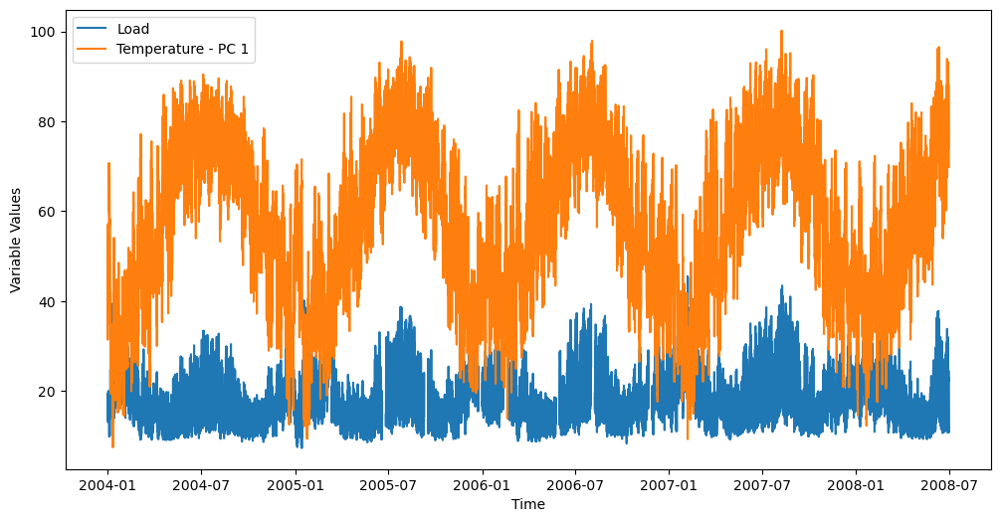

In [9]:
# Plotting Temperature Data with Load Data (Zone 1)
import matplotlib.pyplot as plt

# Converting to datetime values
load_long_z1["timestamp"] = pd.to_datetime(load_long_z1["timestamp"])
temperature["timestamp"] = pd.to_datetime(temperature["timestamp"])

# Re-scaling load values because temp values are much smaller
load_long_z1["load_rs"] = load_long_z1["load"]/1000

# Plotting 
fig, ax = plt.subplots(figsize=(12,6))
ax.plot(load_long_z1["timestamp"], load_long_z1["load_rs"], label="Load")
ax.plot(temperature["timestamp"], temperature["temp_weighted"], label="Temperature - PC 1")
ax.set_xlabel("Time")
ax.set_ylabel("Variable Values")
ax.legend()
plt.show()

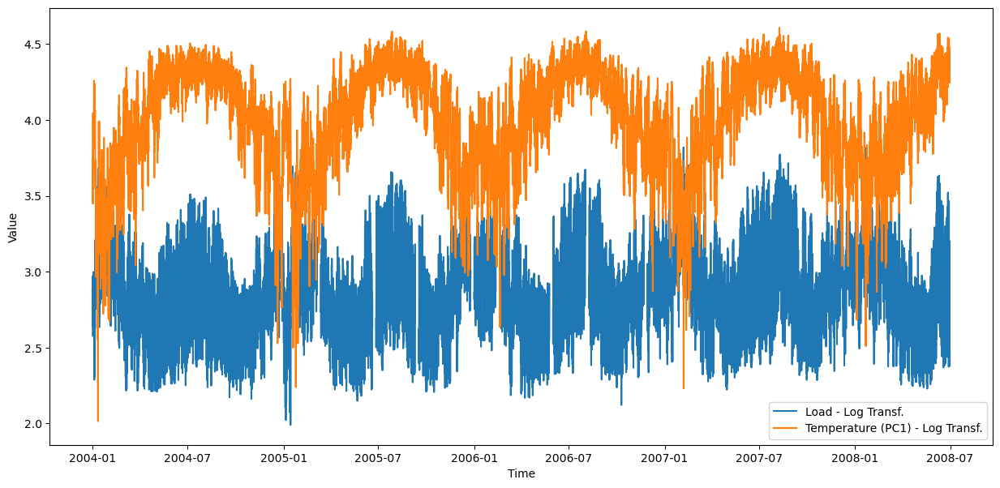

In [10]:
# Using log-log transformation to control both load and temperature data
 
fig, ax = plt.subplots(figsize=(15,7))
ax.plot(load_long_z1["timestamp"], np.log(load_long_z1["load_rs"]), label="Load - Log Transf.")
ax.plot(temperature["timestamp"], np.log(temperature["temp_weighted"]), label="Temperature (PC1) - Log Transf.")
ax.set_xlabel("Time")
ax.set_ylabel("Value")
ax.legend()
plt.show()

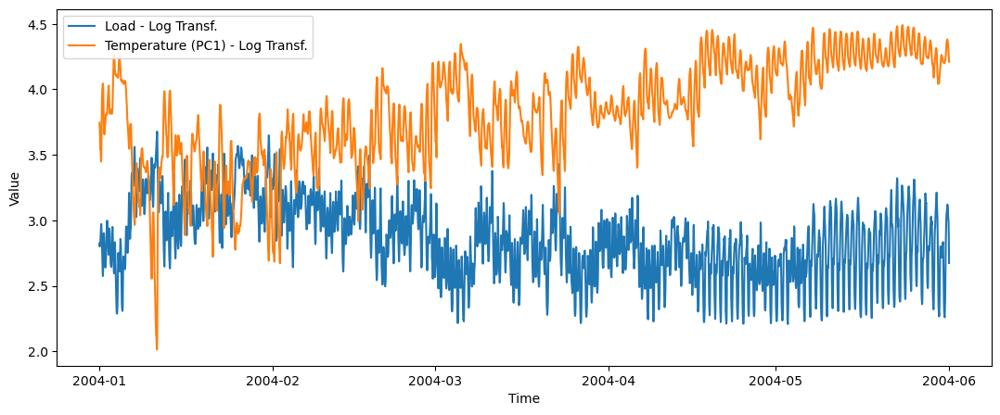

In [11]:
# Observing for first 5 months of 2024
fig, ax = plt.subplots(figsize=(13,5))
ax.plot(load_long_z1.loc[(load_long_z1.year==2004)&(load_long_z1.month<6),"timestamp"], np.log(load_long_z1.loc[(load_long_z1.year==2004)&(load_long_z1.month<6), "load_rs"]), label="Load - Log Transf.")
ax.plot(temperature.loc[temperature.timestamp < "2004-06-01", "timestamp"], np.log(temperature.loc[temperature.timestamp < "2004-06-01", "temp_weighted"]), label="Temperature (PC1) - Log Transf.")
ax.set_xlabel("Time")
ax.set_ylabel("Value")
ax.legend()
plt.show()

In winter months, the relationship between temperature and load appear more complex.

### Distributions of Load and Temperature Data
Histograms of both temperature and load are plotted here.

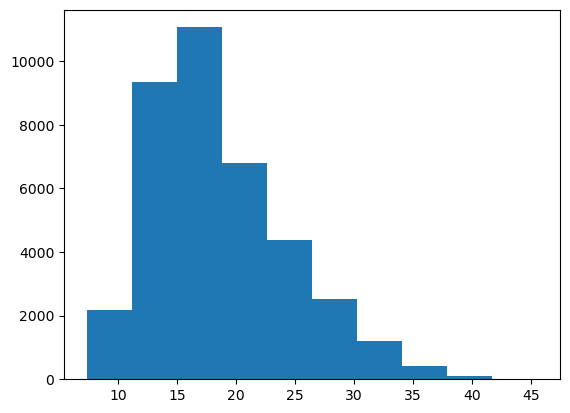

In [12]:
# Distribution of load data
import matplotlib.pyplot as plt
plt.hist(load_long_z1["load_rs"])
plt.show()

Appears to have long right tail. Transformation might be needed to control variance.

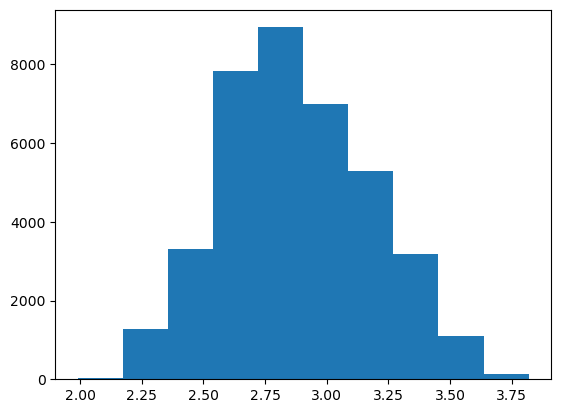

In [13]:
# Log transformation on load data
import matplotlib.pyplot as plt
import numpy as np

plt.hist(np.log(load_long_z1["load_rs"]))
plt.show()

Much more symmetric, it's better to use load values with log transformation.

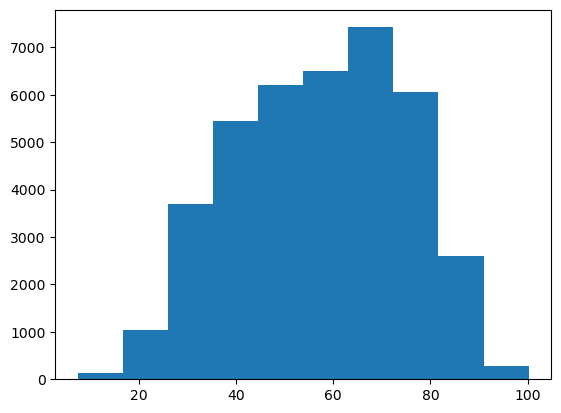

In [14]:
# Distribution of temperature data

plt.hist(temperature.temp_weighted)
plt.show()

Temperature data is not very unsymmetric. Trying log transformation on it.

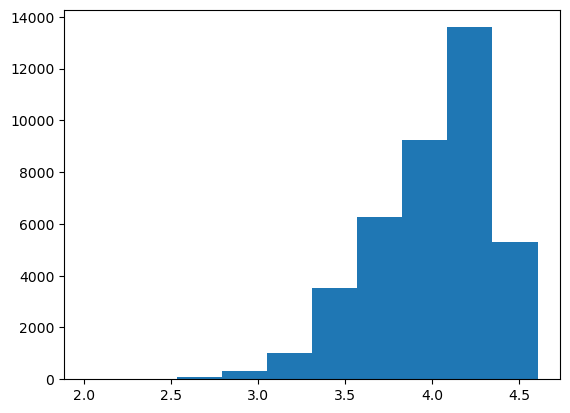

In [15]:
# Distribution of temperature data (log-transformed)

plt.hist(np.log(temperature.temp_weighted))
plt.show()

Log transformation makes temperature highly-unsymmetric.

## Univariate Linear Regression (Zone 1)
Here, only one predictor (temperature) is used as regressor. Since there is seasonality, model fit is likely not going to be as good.<br>
Visiting back the "Graphics" nb it can be seen that the relationship between temperature and load is non-linear.<br>
<i>(The model developed in this section is tested on various portions of 2004). </i>

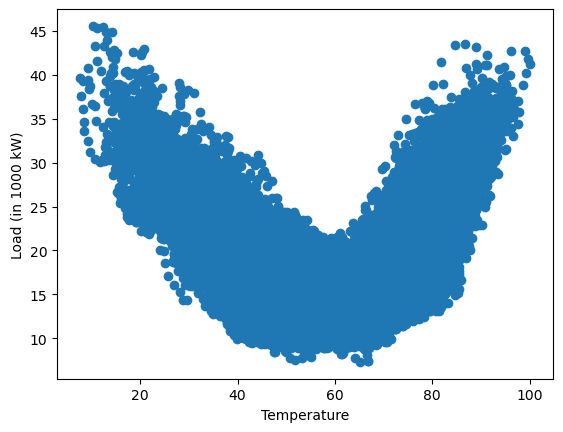

In [16]:
# load versus temperature - no transformation

plt.scatter(temperature.temp_weighted, load_long_z1.load_rs)
plt.ylabel("Load (in 1000 kW)")
plt.xlabel("Temperature")
plt.show()

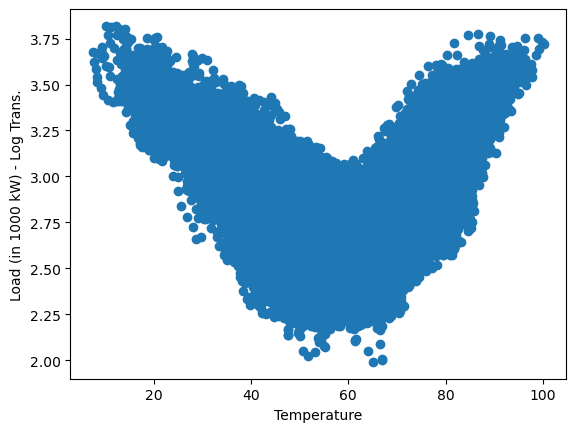

In [17]:
# log transformation on load only

plt.scatter(temperature.temp_weighted, np.log(load_long_z1.load_rs))
plt.ylabel("Load (in 1000 kW) - Log Trans.")
plt.xlabel("Temperature")
plt.show()

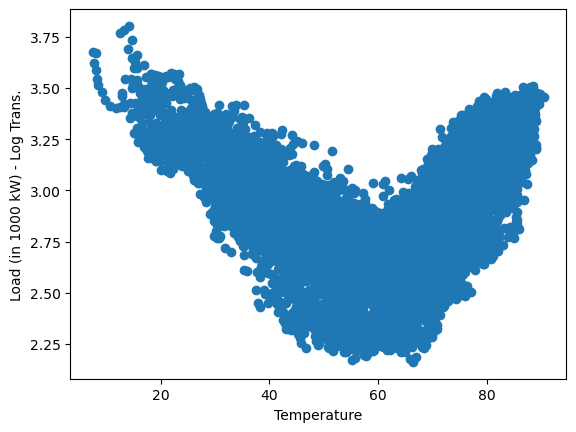

In [18]:
# log transformation on load only - filtered for 2004

plt.scatter(temperature.loc[temperature.timestamp < "2005-01-01", "temp_weighted"], np.log(load_long_z1.loc[load_long_z1.timestamp < "2005-01-01","load_rs"]))
plt.ylabel("Load (in 1000 kW) - Log Trans.")
plt.xlabel("Temperature")
plt.show()

Log transformation on load will help in making distribution symmetric, while also controlling for high variance.
<br>
Even after filtering for year, we see that the relationship between load and temperature is a U-shaped curve.

However from the <i> Graphics </i> notebook, we know that the relationship is linear when broken down on a monthly basis (for most months).

In [19]:
# Adding a new column: log_load_rs
load_long_z1["log_load_rs"] = np.log(load_long_z1.load_rs)
load_long_z1.head()

,zone_id,year,month,day,hour,load,timestamp,load_rs,log_load_rs
0,1,2004,1,1,00:30,16853.0,2004-01-01 00:30:00,16.853,2.824529
1,1,2004,1,1,01:30,16450.0,2004-01-01 01:30:00,16.450,2.800325
2,1,2004,1,1,02:30,16517.0,2004-01-01 02:30:00,16.517,2.804390
3,1,2004,1,1,03:30,16873.0,2004-01-01 03:30:00,16.873,2.825715
4,1,2004,1,1,04:30,17064.0,2004-01-01 04:30:00,17.064,2.836971


### Defining Regression for Jan 2004, Zone 1

#### Training

In [20]:
# log(y)-x regression
import numpy as np
from sklearn.linear_model import LinearRegression

X_train = np.array(temperature.loc[temperature.timestamp <= "2004-01-24 23:30:00" ,"temp_weighted"]).reshape(-1, 1)
y_train = np.array(load_long_z1.loc[load_long_z1.timestamp <= "2004-01-24 23:30:00", "log_load_rs"]).reshape(-1, 1)
simple_reg_jan04_train = LinearRegression().fit(X_train, y_train)

# Regression Results - training
print(simple_reg_jan04_train.score(X_train, y_train)) # r2 score
print(simple_reg_jan04_train.coef_)
print(simple_reg_jan04_train.intercept_)

0.7390718091210711
[[-0.01704261]]
[3.64695903]


Hence the model developed is:<br>
<b><i>log(load) = 3.64 - 0.017*(temp) + error </i></b>
<br><br>
The <b>R2 score:</b> <i>0.73</i> can also be seen in the plot below.

In [21]:
# Performance on training data
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error, mean_absolute_error

print(f"R2 score: {r2_score(y_train, np.array(simple_reg_jan04_train.predict(X_train)))}")
print(f'MSE score: {mean_squared_error(y_train, np.array(simple_reg_jan04_train.predict(X_train)))}')
print(f'MAE score: {mean_absolute_error(y_train, np.array(simple_reg_jan04_train.predict(X_train)))}')
print(f'MAPE score: {mean_absolute_percentage_error(y_train, np.array(simple_reg_jan04_train.predict(X_train)))}')

R2 score: 0.7390718091210711
MSE score: 0.017395835142786673
MAE score: 0.10809752855339178
MAPE score: 0.036285296090141576


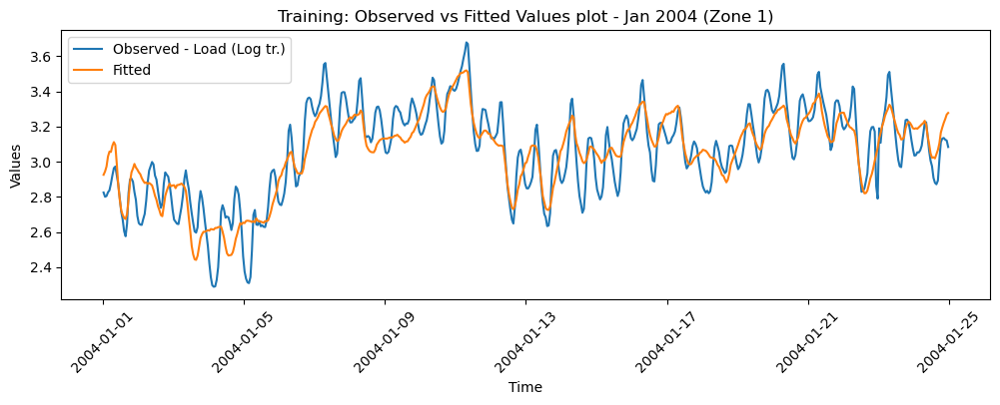

In [22]:
# Observed versus fitted values plot - training

fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(load_long_z1.loc[load_long_z1.timestamp <= "2004-01-24 23:30:00", "timestamp"], y_train, label="Observed - Load (Log tr.)")
ax.plot(load_long_z1.loc[load_long_z1.timestamp <= "2004-01-24 23:30:00", "timestamp"], simple_reg_jan04_train.predict(X_train), label="Fitted")
ax.set_xlabel("Time")
ax.set_ylabel("Values")
ax.legend()
ax.set_title("Training: Observed vs Fitted Values plot - Jan 2004 (Zone 1)")
plt.xticks(rotation=45)
plt.show()

Observed and fitted values appear to follow each other, but observed values have more periodicity pattern missed out by fitted values. 

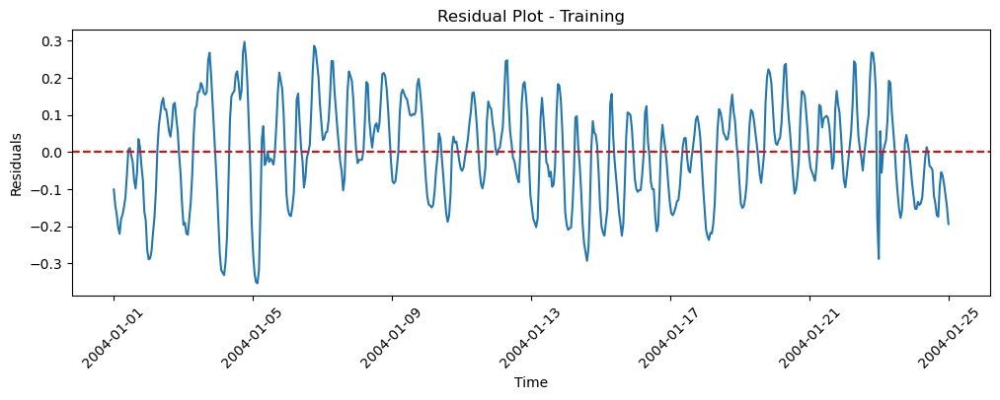

In [23]:
# Residual Variation with time - training

fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(load_long_z1.loc[load_long_z1.timestamp <= "2004-01-24 23:30:00", "timestamp"], np.array(y_train - simple_reg_jan04_train.predict(X_train)).reshape(-1, 1), label="Residuals")
ax.set_xlabel("Time")
ax.set_ylabel("Residuals")
ax.axhline(np.mean(y_train - simple_reg_jan04_train.predict(X_train)), color="red", linestyle="--") # Residual mean
plt.xticks(rotation=45)
ax.set_title("Residual Plot - Training")
plt.show()

Variance appears to stay within a range, does not proportionally increase or decrease with time.

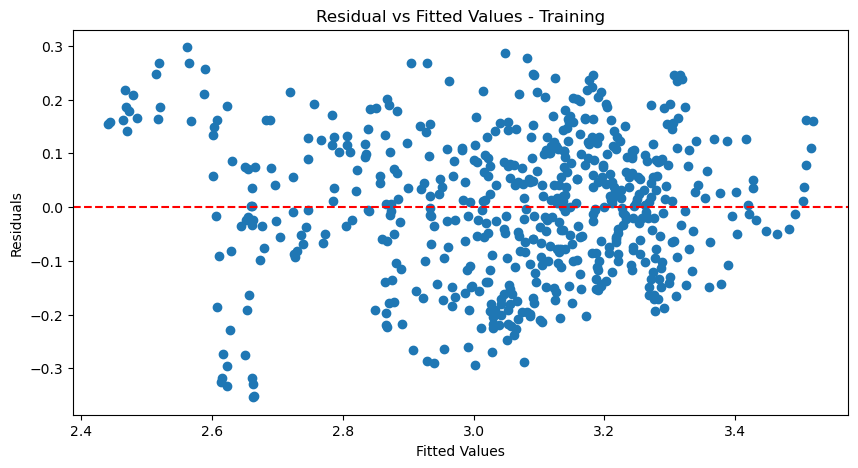

In [24]:
# Residual versus fitted values

fig, ax = plt.subplots(figsize=(10,5))
plt.scatter(simple_reg_jan04_train.predict(X_train), np.array(y_train - simple_reg_jan04_train.predict(X_train)).reshape(-1, 1))
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
ax.axhline(np.mean(y_train - simple_reg_jan04_train.predict(X_train)), color="red", linestyle="--") # Residual mean
plt.title("Residual vs Fitted Values - Training")
plt.show()

The residual variance appears to be slightly higher for lower fitted values.

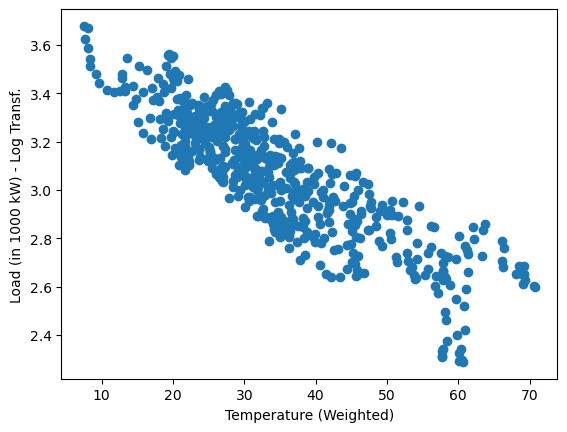

In [25]:
# Load vs temp relationship for the considered time duration

plt.scatter(temperature.loc[temperature.timestamp <= "2004-01-24 23:30:00", "temp_weighted"], load_long_z1.loc[load_long_z1.timestamp <= "2004-01-24 23:30:00", "log_load_rs"])
plt.ylabel("Load (in 1000 kW) - Log Transf.")
plt.xlabel("Temperature (Weighted)")
plt.show()

Relationship appears to be negative, though not perfectly linear. Pattern deviates from the trend more towards the extreme end of load values.

#### Testing

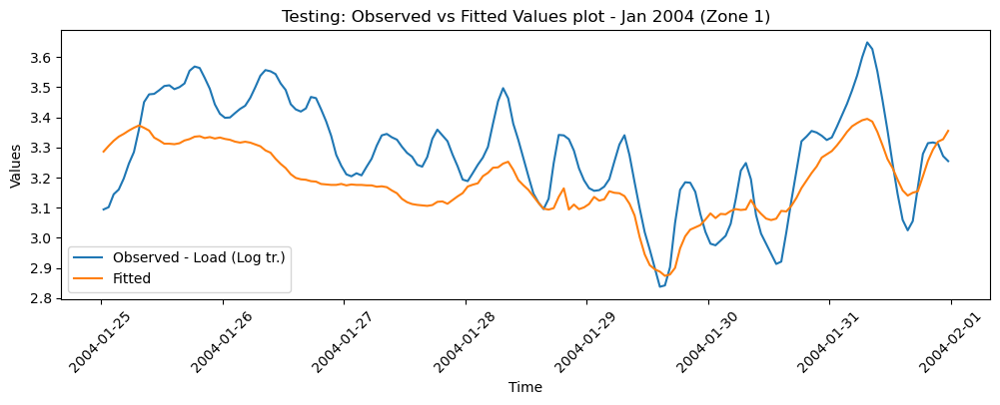

In [26]:
# log(y)-x regression

X_test = np.array(temperature.loc[(temperature.timestamp > "2004-01-24 23:30:00") & (temperature.timestamp < "2004-02-01 00:30:00") ,"temp_weighted"]).reshape(-1, 1)
y_test = np.array(load_long_z1.loc[(load_long_z1.timestamp > "2004-01-24 23:30:00") & (load_long_z1.timestamp < "2004-02-01 00:30:00"), "log_load_rs"]).reshape(-1, 1)

# Regression Results - test
y_pred = np.array(simple_reg_jan04_train.predict(X_test)).reshape(-1, 1)

# Observed versus fitted values plot - testing

fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(load_long_z1.loc[(load_long_z1.timestamp > "2004-01-24 23:30:00") & (load_long_z1.timestamp < "2004-02-01 00:30:00"), "timestamp"], y_test, label="Observed - Load (Log tr.)")
ax.plot(load_long_z1.loc[(load_long_z1.timestamp > "2004-01-24 23:30:00") & (load_long_z1.timestamp < "2004-02-01 00:30:00"), "timestamp"], y_pred, label="Fitted")
ax.set_xlabel("Time")
ax.set_ylabel("Values")
ax.legend()
ax.set_title("Testing: Observed vs Fitted Values plot - Jan 2004 (Zone 1)")
plt.xticks(rotation=45)
plt.show()

In [27]:
# Performance on testing data
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error, mean_absolute_error

print(f"R2 score: {r2_score(y_test, np.array(simple_reg_jan04_train.predict(X_test)))}")
print(f'MSE score: {mean_squared_error(y_test, np.array(simple_reg_jan04_train.predict(X_test)))}')
print(f'MAE score: {mean_absolute_error(y_test, np.array(simple_reg_jan04_train.predict(X_test)))}')
print(f'MAPE score: {mean_absolute_percentage_error(y_test, np.array(simple_reg_jan04_train.predict(X_test)))}')

R2 score: 0.30208284943458574
MSE score: 0.021315464039448166
MAE score: 0.12608101850812137
MAPE score: 0.03780859470183417


### Defining Regression for Apr 2004, Zone 1</b>

#### Training

In [28]:
# log(y)-x regression

X_train = np.array(temperature.loc[(temperature.timestamp <= "2004-04-23 23:30:00") & (temperature.timestamp >= "2004-04-01 00:30:00") ,"temp_weighted"]).reshape(-1, 1)
y_train = np.array(load_long_z1.loc[(load_long_z1.timestamp <= "2004-04-23 23:30:00") & (load_long_z1.timestamp >= "2004-04-01 00:30:00"), "log_load_rs"]).reshape(-1, 1)
simple_reg_apr04_train = LinearRegression().fit(X_train, y_train)

# Regression Results - training
print(simple_reg_apr04_train.score(X_train, y_train)) # r2 score
print(simple_reg_apr04_train.coef_)
print(simple_reg_apr04_train.intercept_)

0.02271463908929172
[[-0.0023992]]
[2.83246865]


The r2 score is extremely poor.

In [29]:
# Performance on training data
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error, mean_absolute_error

print(f"R2 score: {r2_score(y_train, np.array(simple_reg_apr04_train.predict(X_train)))}")
print(f'MSE score: {mean_squared_error(y_train, np.array(simple_reg_apr04_train.predict(X_train)))}')
print(f'MAE score: {mean_absolute_error(y_train, np.array(simple_reg_apr04_train.predict(X_train)))}')
print(f'MAPE score: {mean_absolute_percentage_error(y_train, np.array(simple_reg_apr04_train.predict(X_train)))}')

R2 score: 0.02271463908929172
MSE score: 0.03884855252634859
MAE score: 0.1566233659264609
MAPE score: 0.0594367230264483


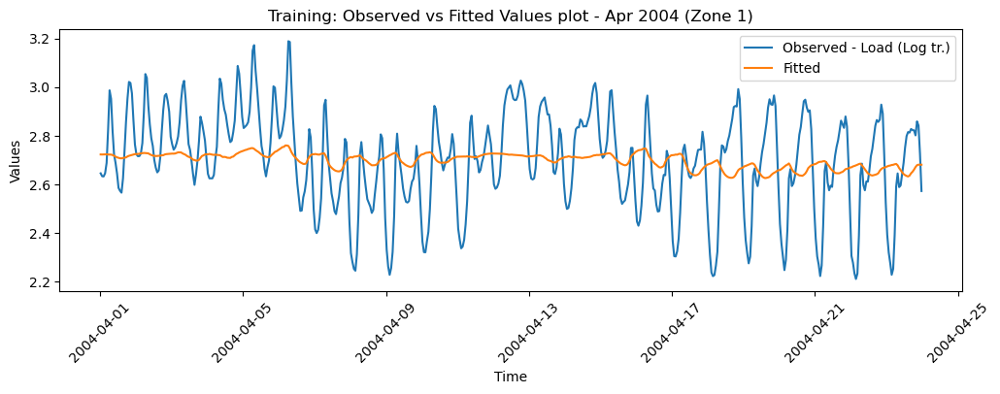

In [30]:
# Observed versus fitted values plot - training

fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(load_long_z1.loc[(load_long_z1.timestamp <= "2004-04-23 23:30:00") & (load_long_z1.timestamp >= "2004-04-01 00:30:00"), "timestamp"], y_train, label="Observed - Load (Log tr.)")
ax.plot(load_long_z1.loc[(load_long_z1.timestamp <= "2004-04-23 23:30:00") & (load_long_z1.timestamp >= "2004-04-01 00:30:00"), "timestamp"], simple_reg_apr04_train.predict(X_train), label="Fitted")
ax.set_xlabel("Time")
ax.set_ylabel("Values")
ax.legend()
ax.set_title("Training: Observed vs Fitted Values plot - Apr 2004 (Zone 1)")
plt.xticks(rotation=45)
plt.show()

The main issue appears to again be lack of periodicity in fitted values. In other words, fitted values should capture daily seasonality.

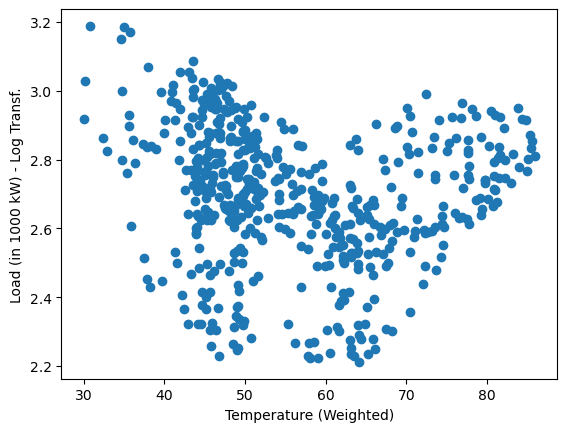

In [31]:
# Load vs temp relationship for the considered time duration - training

plt.scatter(temperature.loc[(temperature.timestamp <= "2004-04-23 23:30:00") & (temperature.timestamp > "2004-03-31 23:30:00"), "temp_weighted"], load_long_z1.loc[(load_long_z1.timestamp <= "2004-04-23 23:30:00") & (load_long_z1.timestamp > "2004-03-31 23:30:00"), "log_load_rs"])
plt.ylabel("Load (in 1000 kW) - Log Transf.")
plt.xlabel("Temperature (Weighted)")
plt.show()

The relationship between temperature and load is not that clear. That is why performance is poor.

#### Testing

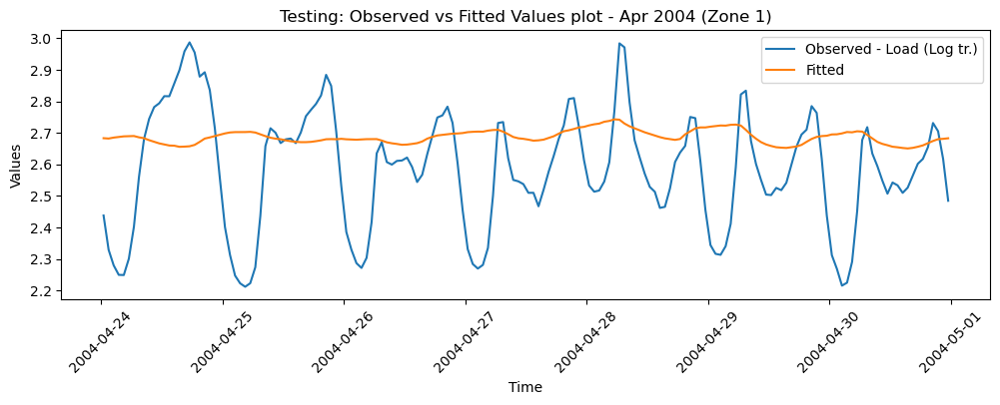

In [32]:
# log(y)-x regression

X_test = np.array(temperature.loc[(temperature.timestamp >= "2004-04-24 00:30:00") & (temperature.timestamp < "2004-05-01 00:30:00") ,"temp_weighted"]).reshape(-1, 1)
y_test = np.array(load_long_z1.loc[(load_long_z1.timestamp >= "2004-04-24 00:30:00") & (load_long_z1.timestamp < "2004-05-01 00:30:00"), "log_load_rs"]).reshape(-1, 1)

# Regression Results - test
y_pred = np.array(simple_reg_apr04_train.predict(X_test)).reshape(-1, 1)

# Observed versus fitted values plot - testing

fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(load_long_z1.loc[(load_long_z1.timestamp >= "2004-04-24 00:30:00") & (load_long_z1.timestamp < "2004-05-01 00:30:00"), "timestamp"], y_test, label="Observed - Load (Log tr.)")
ax.plot(load_long_z1.loc[(load_long_z1.timestamp >= "2004-04-24 00:30:00") & (load_long_z1.timestamp < "2004-05-01 00:30:00"), "timestamp"], y_pred, label="Fitted")
ax.set_xlabel("Time")
ax.set_ylabel("Values")
ax.legend()
ax.set_title("Testing: Observed vs Fitted Values plot - Apr 2004 (Zone 1)")
plt.xticks(rotation=45)
plt.show()

In [33]:
# Performance on testing data
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error, mean_absolute_error

print(f"R2 score: {r2_score(y_test, np.array(simple_reg_apr04_train.predict(X_test)))}")
print(f'MSE score: {mean_squared_error(y_test, np.array(simple_reg_apr04_train.predict(X_test)))}')
print(f'MAE score: {mean_absolute_error(y_test, np.array(simple_reg_apr04_train.predict(X_test)))}')
print(f'MAPE score: {mean_absolute_percentage_error(y_test, np.array(simple_reg_apr04_train.predict(X_test)))}')

R2 score: -0.3712275137581391
MSE score: 0.046904324320207164
MAE score: 0.16778610031938299
MAPE score: 0.06823683482504472


### Defining Regression for Jul 2004, Zone 1

#### Training

In [34]:
# log(y)-x regression

X_train = np.array(temperature.loc[(temperature.timestamp <= "2004-07-24 23:30:00") & (temperature.timestamp >= "2004-07-01 00:30:00") ,"temp_weighted"]).reshape(-1, 1)
y_train = np.array(load_long_z1.loc[(load_long_z1.timestamp <= "2004-07-24 23:30:00") & (load_long_z1.timestamp >= "2004-07-01 00:30:00"), "log_load_rs"]).reshape(-1, 1)
simple_reg_jul04_train = LinearRegression().fit(X_train, y_train)

# Regression Results - training
print(simple_reg_jul04_train.score(X_train, y_train)) # r2 score
print(simple_reg_jul04_train.coef_)
print(simple_reg_jul04_train.intercept_)

0.6839356852516187
[[0.03976281]]
[-0.04074807]


In [35]:
# Performance on training data
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error, mean_absolute_error

print(f"R2 score: {r2_score(y_train, np.array(simple_reg_jul04_train.predict(X_train)))}")
print(f'MSE score: {mean_squared_error(y_train, np.array(simple_reg_jul04_train.predict(X_train)))}')
print(f'MAE score: {mean_absolute_error(y_train, np.array(simple_reg_jul04_train.predict(X_train)))}')
print(f'MAPE score: {mean_absolute_percentage_error(y_train, np.array(simple_reg_jul04_train.predict(X_train)))}')

R2 score: 0.6839356852516187
MSE score: 0.032208764817715105
MAE score: 0.14613505091833606
MAPE score: 0.049190021050873584


The performance is okay.

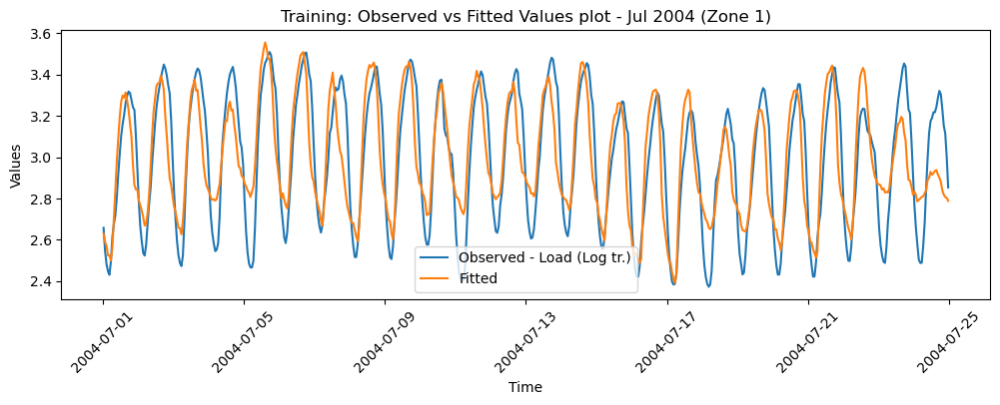

In [36]:
# Observed versus fitted values plot - training

fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(load_long_z1.loc[(load_long_z1.timestamp <= "2004-07-24 23:30:00") & (load_long_z1.timestamp >= "2004-07-01 00:30:00"), "timestamp"], y_train, label="Observed - Load (Log tr.)")
ax.plot(load_long_z1.loc[(load_long_z1.timestamp <= "2004-07-24 23:30:00") & (load_long_z1.timestamp >= "2004-07-01 00:30:00"), "timestamp"], simple_reg_jul04_train.predict(X_train), label="Fitted")
ax.set_xlabel("Time")
ax.set_ylabel("Values")
ax.legend()
ax.set_title("Training: Observed vs Fitted Values plot - Jul 2004 (Zone 1)")
plt.xticks(rotation=45)
plt.show()

Values seem to follow closely, fitted values seem to slightly miss out on capturing periodicity.

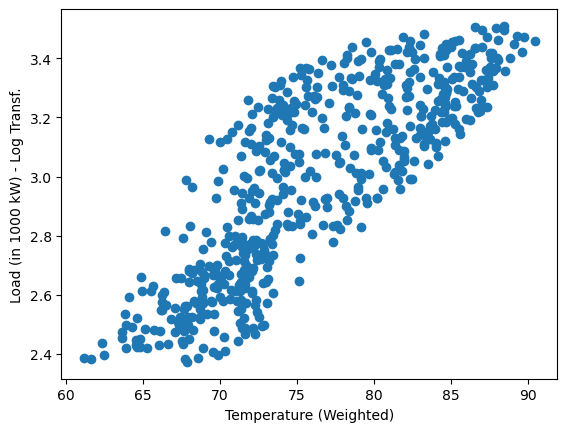

In [37]:
# Load vs temp relationship for the considered time duration - training

plt.scatter(temperature.loc[(temperature.timestamp < "2004-07-25") & (temperature.timestamp > "2004-06-30 23:30:00"), "temp_weighted"], load_long_z1.loc[(load_long_z1.timestamp < "2004-07-25") & (load_long_z1.timestamp > "2004-06-30 23:30:00"), "log_load_rs"])
plt.ylabel("Load (in 1000 kW) - Log Transf.")
plt.xlabel("Temperature (Weighted)")
plt.show()

The relationship appears roughly linear, although not exactly.

#### Testing

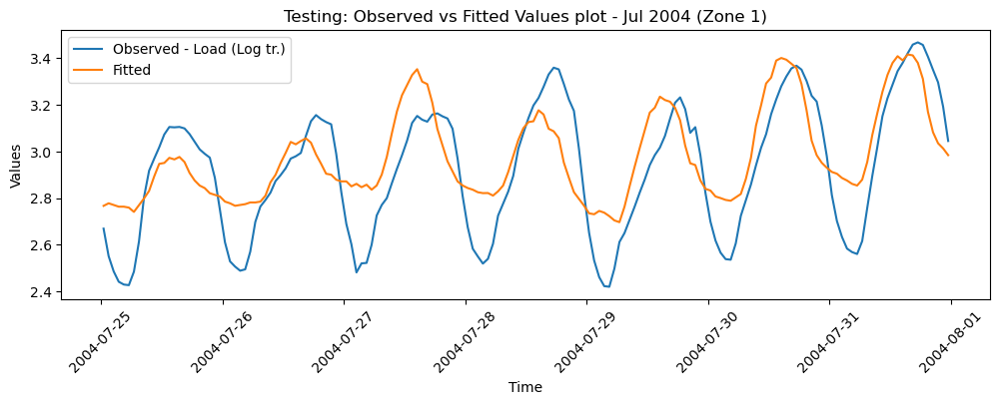

In [38]:
# log(y)-x regression

X_test = np.array(temperature.loc[(temperature.timestamp >= "2004-07-25 00:30:00") & (temperature.timestamp < "2004-08-01 00:30:00") ,"temp_weighted"]).reshape(-1, 1)
y_test = np.array(load_long_z1.loc[(load_long_z1.timestamp >= "2004-07-25 00:30:00") & (load_long_z1.timestamp < "2004-08-01 00:30:00"), "log_load_rs"]).reshape(-1, 1)

# Regression Results - test
y_pred = np.array(simple_reg_jul04_train.predict(X_test)).reshape(-1, 1)

# Observed versus fitted values plot - testing

fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(load_long_z1.loc[(load_long_z1.timestamp >= "2004-07-25 00:30:00") & (load_long_z1.timestamp < "2004-08-01 00:30:00"), "timestamp"], y_test, label="Observed - Load (Log tr.)")
ax.plot(load_long_z1.loc[(load_long_z1.timestamp >= "2004-07-25 00:30:00") & (load_long_z1.timestamp < "2004-08-01 00:30:00"), "timestamp"], y_pred, label="Fitted")
ax.set_xlabel("Time")
ax.set_ylabel("Values")
ax.legend()
ax.set_title("Testing: Observed vs Fitted Values plot - Jul 2004 (Zone 1)")
plt.xticks(rotation=45)
plt.show()

In [39]:
# Performance on testing data
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error, mean_absolute_error

print(f"R2 score: {r2_score(y_test, np.array(simple_reg_jul04_train.predict(X_test)))}")
print(f'MSE score: {mean_squared_error(y_test, np.array(simple_reg_jul04_train.predict(X_test)))}')
print(f'MAE score: {mean_absolute_error(y_test, np.array(simple_reg_jul04_train.predict(X_test)))}')
print(f'MAPE score: {mean_absolute_percentage_error(y_test, np.array(simple_reg_jul04_train.predict(X_test)))}')

R2 score: 0.5714630887458283
MSE score: 0.03384401885348054
MAE score: 0.16007026496075533
MAPE score: 0.05664390696911591


### Defining Regression for Oct 2004, Zone 1

#### Training

In [40]:
# log(y)-x regression

X_train = np.array(temperature.loc[(temperature.timestamp <= "2004-10-24 23:30:00") & (temperature.timestamp >= "2004-10-01 00:30:00") ,"temp_weighted"]).reshape(-1, 1)
y_train = np.array(load_long_z1.loc[(load_long_z1.timestamp <= "2004-10-24 23:30:00") & (load_long_z1.timestamp >= "2004-10-01 00:30:00"), "log_load_rs"]).reshape(-1, 1)
simple_reg_oct04_train = LinearRegression().fit(X_train, y_train)

# Regression Results - training
print(simple_reg_oct04_train.score(X_train, y_train)) # r2 score
print(simple_reg_oct04_train.coef_)
print(simple_reg_oct04_train.intercept_)

0.021573898601318975
[[0.00305683]]
[2.44057363]


The fit is again extremely poor.

In [41]:
# Performance on training data
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error, mean_absolute_error

print(f"R2 score: {r2_score(y_train, np.array(simple_reg_oct04_train.predict(X_train)))}")
print(f'MSE score: {mean_squared_error(y_train, np.array(simple_reg_oct04_train.predict(X_train)))}')
print(f'MAE score: {mean_absolute_error(y_train, np.array(simple_reg_oct04_train.predict(X_train)))}')
print(f'MAPE score: {mean_absolute_percentage_error(y_train, np.array(simple_reg_oct04_train.predict(X_train)))}')

R2 score: 0.021573898601318975
MSE score: 0.028584182501435684
MAE score: 0.13796738024511435
MAPE score: 0.05374767634287706


Fit is not that strong.

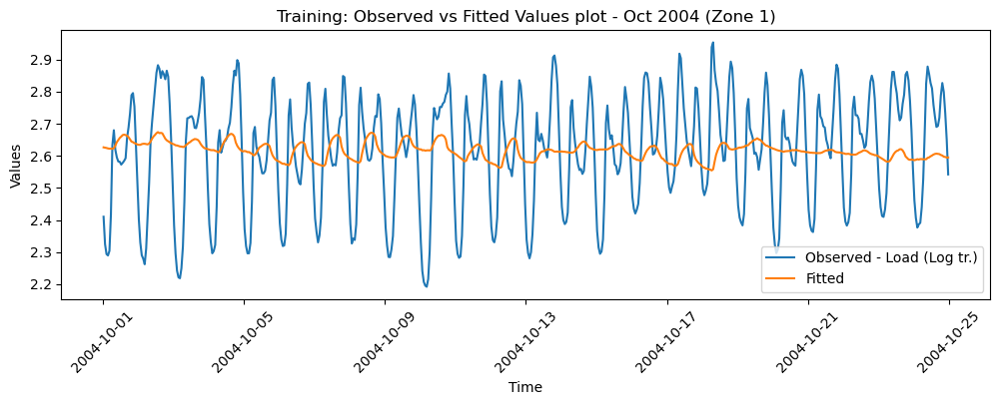

In [42]:
# Observed versus fitted values plot - training

fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(load_long_z1.loc[(load_long_z1.timestamp <= "2004-10-24 23:30:00") & (load_long_z1.timestamp >= "2004-10-01 00:30:00"), "timestamp"], y_train, label="Observed - Load (Log tr.)")
ax.plot(load_long_z1.loc[(load_long_z1.timestamp <= "2004-10-24 23:30:00") & (load_long_z1.timestamp >= "2004-10-01 00:30:00"), "timestamp"], simple_reg_oct04_train.predict(X_train), label="Fitted")
ax.set_xlabel("Time")
ax.set_ylabel("Values")
ax.legend()
ax.set_title("Training: Observed vs Fitted Values plot - Oct 2004 (Zone 1)")
plt.xticks(rotation=45)
plt.show()

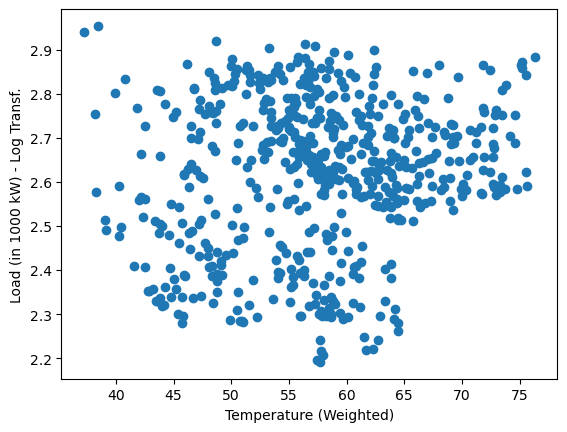

In [43]:
# Load vs temp relationship for the considered time duration - training

plt.scatter(temperature.loc[(temperature.timestamp < "2004-10-25") & (temperature.timestamp > "2004-09-30 23:30:00"), "temp_weighted"], load_long_z1.loc[(load_long_z1.timestamp < "2004-10-25") & (load_long_z1.timestamp > "2004-09-30 23:30:00"), "log_load_rs"])
plt.ylabel("Load (in 1000 kW) - Log Transf.")
plt.xlabel("Temperature (Weighted)")
plt.show()

Here again, we see that the relationship between temperature and load is very unclear.<br>
Hence even if model is re-specified, temperature can't always explain load values for certain portions of an year.<br>
Auto-regression or additional explanatory variables might be required in this case.

#### Testing

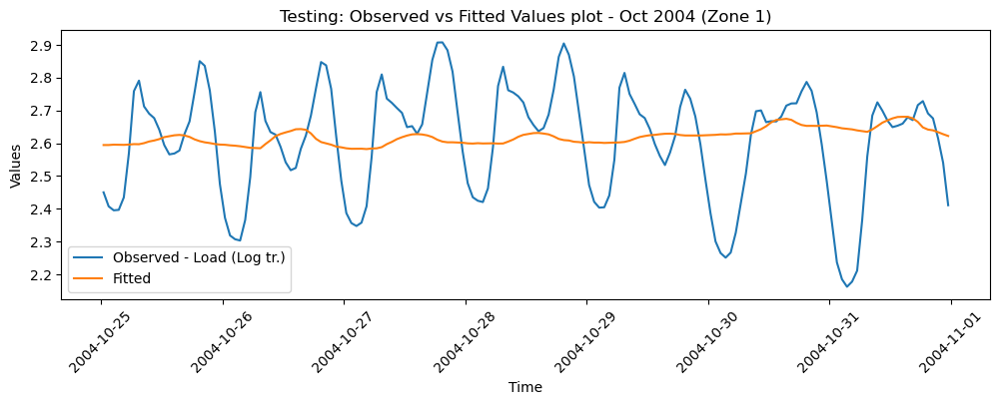

In [44]:
# log(y)-x regression

X_test = np.array(temperature.loc[(temperature.timestamp >= "2004-10-25 00:30:00") & (temperature.timestamp < "2004-11-01 00:30:00") ,"temp_weighted"]).reshape(-1, 1)
y_test = np.array(load_long_z1.loc[(load_long_z1.timestamp >= "2004-10-25 00:30:00") & (load_long_z1.timestamp < "2004-11-01 00:30:00"), "log_load_rs"]).reshape(-1, 1)

# Regression Results - test
y_pred = np.array(simple_reg_oct04_train.predict(X_test)).reshape(-1, 1)

# Observed versus fitted values plot - testing

fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(load_long_z1.loc[(load_long_z1.timestamp >= "2004-10-25 00:30:00") & (load_long_z1.timestamp < "2004-11-01 00:30:00"), "timestamp"], y_test, label="Observed - Load (Log tr.)")
ax.plot(load_long_z1.loc[(load_long_z1.timestamp >= "2004-10-25 00:30:00") & (load_long_z1.timestamp < "2004-11-01 00:30:00"), "timestamp"], y_pred, label="Fitted")
ax.set_xlabel("Time")
ax.set_ylabel("Values")
ax.legend()
ax.set_title("Testing: Observed vs Fitted Values plot - Oct 2004 (Zone 1)")
plt.xticks(rotation=45)
plt.show()

In [45]:
# Performance on testing data
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error, mean_absolute_error

print(f"R2 score: {r2_score(y_test, np.array(simple_reg_oct04_train.predict(X_test)))}")
print(f'MSE score: {mean_squared_error(y_test, np.array(simple_reg_oct04_train.predict(X_test)))}')
print(f'MAE score: {mean_absolute_error(y_test, np.array(simple_reg_oct04_train.predict(X_test)))}')
print(f'MAPE score: {mean_absolute_percentage_error(y_test, np.array(simple_reg_oct04_train.predict(X_test)))}')

R2 score: -0.008004155298134252
MSE score: 0.028463574373616747
MAE score: 0.13108993446729914
MAPE score: 0.05185108026870838


### Defining Regression for Dec 2004, Zone 1

#### Training

In [46]:
# log(y)-x regression

X_train = np.array(temperature.loc[(temperature.timestamp <= "2004-12-24 23:30:00") & (temperature.timestamp >= "2004-12-01 00:30:00") ,"temp_weighted"]).reshape(-1, 1)
y_train = np.array(load_long_z1.loc[(load_long_z1.timestamp <= "2004-12-24 23:30:00") & (load_long_z1.timestamp >= "2004-12-01 00:30:00"), "log_load_rs"]).reshape(-1, 1)
simple_reg_dec04_train = LinearRegression().fit(X_train, y_train)

# Regression Results - training
print(simple_reg_dec04_train.score(X_train, y_train)) # r2 score
print(simple_reg_dec04_train.coef_)
print(simple_reg_dec04_train.intercept_)

0.6635018423185537
[[-0.0175691]]
[3.73685522]


In [47]:
# Performance on training data
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error, mean_absolute_error

print(f"R2 score: {r2_score(y_train, np.array(simple_reg_dec04_train.predict(X_train)))}")
print(f'MSE score: {mean_squared_error(y_train, np.array(simple_reg_dec04_train.predict(X_train)))}')
print(f'MAE score: {mean_absolute_error(y_train, np.array(simple_reg_dec04_train.predict(X_train)))}')
print(f'MAPE score: {mean_absolute_percentage_error(y_train, np.array(simple_reg_dec04_train.predict(X_train)))}')

R2 score: 0.6635018423185537
MSE score: 0.02081459065599209
MAE score: 0.11721640803267415
MAPE score: 0.039535668049439504


Performance is okay.

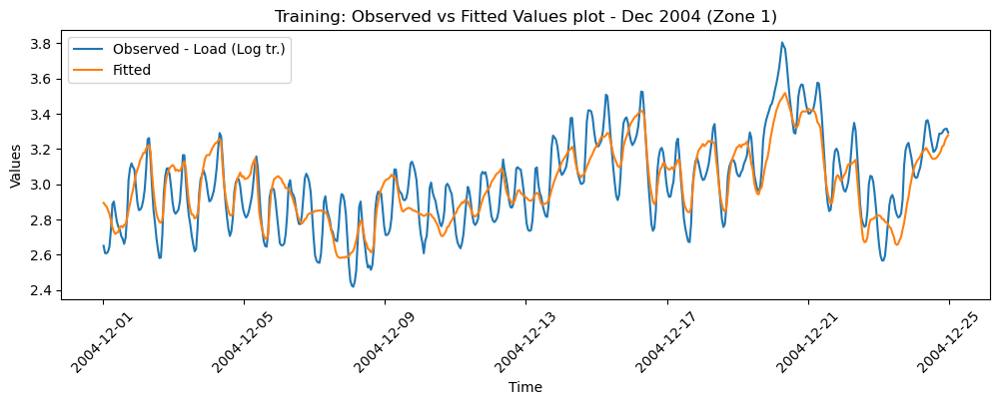

In [48]:
# Observed versus fitted values plot - training

fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(load_long_z1.loc[(load_long_z1.timestamp <= "2004-12-24 23:30:00") & (load_long_z1.timestamp >= "2004-12-01 00:30:00"), "timestamp"], y_train, label="Observed - Load (Log tr.)")
ax.plot(load_long_z1.loc[(load_long_z1.timestamp <= "2004-12-24 23:30:00") & (load_long_z1.timestamp >= "2004-12-01 00:30:00"), "timestamp"], simple_reg_dec04_train.predict(X_train), label="Fitted")
ax.set_xlabel("Time")
ax.set_ylabel("Values")
ax.legend()
ax.set_title("Training: Observed vs Fitted Values plot - Dec 2004 (Zone 1)")
plt.xticks(rotation=45)
plt.show()

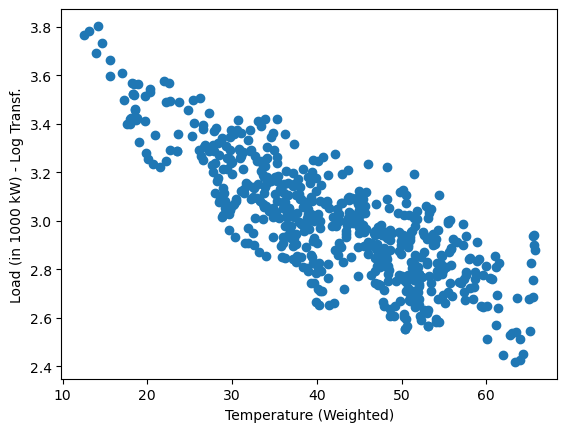

In [49]:
# Load vs temp relationship for the considered time duration - training

plt.scatter(temperature.loc[(temperature.timestamp < "2004-12-25") & (temperature.timestamp >= "2004-12-01 00:30:00"), "temp_weighted"], load_long_z1.loc[(load_long_z1.timestamp < "2004-12-25") & (load_long_z1.timestamp >= "2004-12-01 00:30:00"), "log_load_rs"])
plt.ylabel("Load (in 1000 kW) - Log Transf.")
plt.xlabel("Temperature (Weighted)")
plt.show()

Wherever the relationship between load and temperature is roughly linear, performance of the regression model is strong.<br>
It's mainly those portions of the year where the relationship is unclear, that the performance is suffering.

#### Testing

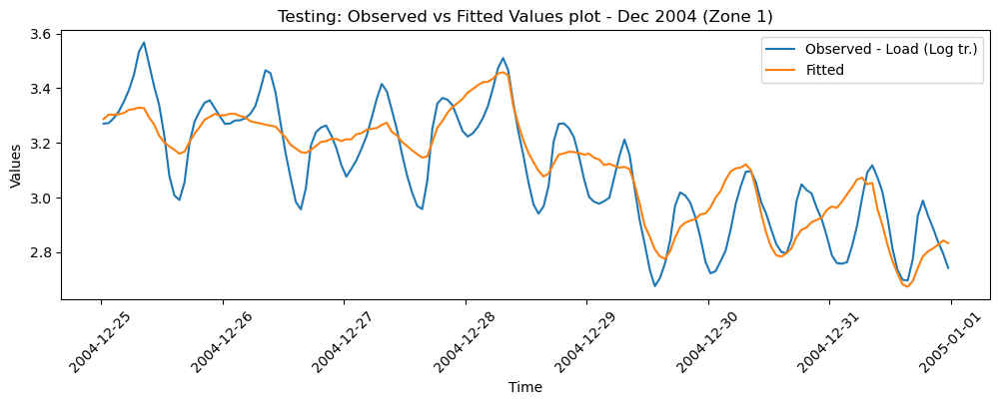

In [50]:
# log(y)-x regression

X_test = np.array(temperature.loc[(temperature.timestamp >= "2004-12-25 00:30:00") & (temperature.timestamp < "2005-01-01") ,"temp_weighted"]).reshape(-1, 1)
y_test = np.array(load_long_z1.loc[(load_long_z1.timestamp >= "2004-12-25 00:30:00") & (load_long_z1.timestamp < "2005-01-01"), "log_load_rs"]).reshape(-1, 1)

# Regression Results - test
y_pred = np.array(simple_reg_dec04_train.predict(X_test)).reshape(-1, 1)

# Observed versus fitted values plot - testing

fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(load_long_z1.loc[(load_long_z1.timestamp >= "2004-12-25 00:30:00") & (load_long_z1.timestamp < "2005-01-01"), "timestamp"], y_test, label="Observed - Load (Log tr.)")
ax.plot(load_long_z1.loc[(load_long_z1.timestamp >= "2004-12-25 00:30:00") & (load_long_z1.timestamp < "2005-01-01"), "timestamp"], y_pred, label="Fitted")
ax.set_xlabel("Time")
ax.set_ylabel("Values")
ax.legend()
ax.set_title("Testing: Observed vs Fitted Values plot - Dec 2004 (Zone 1)")
plt.xticks(rotation=45)
plt.show()

In [51]:
# Performance on testing data
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error, mean_absolute_error

print(f"R2 score: {r2_score(y_test, np.array(simple_reg_dec04_train.predict(X_test)))}")
print(f'MSE score: {mean_squared_error(y_test, np.array(simple_reg_dec04_train.predict(X_test)))}')
print(f'MAE score: {mean_absolute_error(y_test, np.array(simple_reg_dec04_train.predict(X_test)))}')
print(f'MAPE score: {mean_absolute_percentage_error(y_test, np.array(simple_reg_dec04_train.predict(X_test)))}')

R2 score: 0.7274522448832335
MSE score: 0.012788922179513884
MAE score: 0.09193018949677696
MAPE score: 0.030146971801569153


## Harmonic Regression
Fourier series can be used to capture hourly seasonality. The advantage of this approach is that it doesn't rely on lagged values, meaning that it can be used for backcasting and forecasting when time intervals are very wide. <br>

The periodicity can be modelled by creating harmonics for seperate cycles:
- Every 12th lag
- Every 24th lag
- Every seasonal lag (annual)
- Some cycle that can relate periodicity with temp (example quarter)

Since missing intervals and forecasting horizon don't expand beyond one week, generating signal (via harmonics) longer than a week isn't necessary. For generating the signal, one month period should be sufficient.

### Defining Harmonic for Jan 2004, Zone 1

#### Determining Periodicity and Number of Harmonics

The load values used are re-scaled (division by 1000) to accommodate temperature data used previously.

In [52]:
load_long_z1.head()

,zone_id,year,month,day,hour,load,timestamp,load_rs,log_load_rs
0,1,2004,1,1,00:30,16853.0,2004-01-01 00:30:00,16.853,2.824529
1,1,2004,1,1,01:30,16450.0,2004-01-01 01:30:00,16.450,2.800325
2,1,2004,1,1,02:30,16517.0,2004-01-01 02:30:00,16.517,2.804390
3,1,2004,1,1,03:30,16873.0,2004-01-01 03:30:00,16.873,2.825715
4,1,2004,1,1,04:30,17064.0,2004-01-01 04:30:00,17.064,2.836971


In [53]:
# generating a new dataframe - Zone 1 (Jan 2004)
harmonic_df_jan04 = load_long_z1.loc[(load_long_z1.year == 2004) & (load_long_z1.month == 1),['timestamp','month','day','hour','load_rs']]
harmonic_df_jan04["t"] = range(1,len(harmonic_df_jan04)+1)
harmonic_df_jan04 = harmonic_df_jan04.set_index("timestamp")
harmonic_df_jan04.head()

,month,day,hour,load_rs,t
timestamp,,,,,
2004-01-01 00:30:00,1,1,00:30,16.853,1
2004-01-01 01:30:00,1,1,01:30,16.450,2
2004-01-01 02:30:00,1,1,02:30,16.517,3
2004-01-01 03:30:00,1,1,03:30,16.873,4
2004-01-01 04:30:00,1,1,04:30,17.064,5


In [54]:
# Defining custom fourier terms
from statsmodels.tsa.deterministic import Fourier
periodicity_1 = Fourier(period=24, order=1) # daily cycle i.e. 24 hours, only one harmonic

In [55]:
# Generating matrix that includes waves corresponding to all periodicities
from statsmodels.tsa.deterministic import DeterministicProcess

dp = DeterministicProcess(
    index=harmonic_df_jan04.index,
    period=None,         # It's not defined so that frequency can be read from the index
    constant=False,      # Let regression model define this intercept later on
    order=1,             # allows trend to be included so that the level of the wave is allowed to change with time, linearly 
    seasonal=False,      # no seasonal dummies
    additional_terms=[periodicity_1],
    drop=True            # if perfect collinearity exists, the terms can be dropped
)

waves = dp.in_sample()
waves.head()

,trend,"sin(1,24)","cos(1,24)"
timestamp,,,
2004-01-01 00:30:00,1.0,0.000000,1.000000
2004-01-01 01:30:00,2.0,0.258819,0.965926
2004-01-01 02:30:00,3.0,0.500000,0.866025
2004-01-01 03:30:00,4.0,0.707107,0.707107
2004-01-01 04:30:00,5.0,0.866025,0.500000


The individual waves can be fitted as features in the regression model.

In [56]:
# Fitting a regression model - daily periodicity of order 1
from sklearn.linear_model import LinearRegression

model_1 = LinearRegression() 
model_1.fit(waves, harmonic_df_jan04['load_rs'])

LinearRegression()

In [57]:
# Fitted values 
fitted_1 = model_1.predict(waves)

# Regression fit score
print(model_1.score(waves, harmonic_df_jan04['load_rs'])) # r2 score

0.24218879677209493


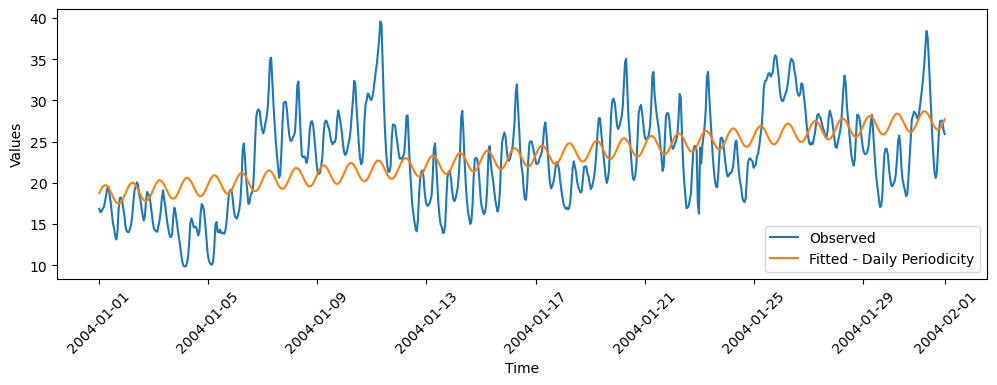

In [58]:
# Observed versus fitted values plot 

fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(harmonic_df_jan04.index, np.array(harmonic_df_jan04.load_rs).reshape(-1, 1), label="Observed")
ax.plot(harmonic_df_jan04.index, fitted_1, label="Fitted - Daily Periodicity")
ax.set_xlabel("Time")
ax.set_ylabel("Values")
ax.legend()
plt.xticks(rotation=45)
plt.show()

In [59]:
# Adding periodicities
periodicity_2 = Fourier(period=24, order=4) # daily cycle i.e. 24 hours, 4 harmonics

# Defining the sine wave
dp = DeterministicProcess(
    index=harmonic_df_jan04.index,
    period=None,         # It's not defined so that frequency can be read from the index
    constant=False,      # Let regression model define this intercept later on
    order=1,             # allows trend to be included so that the level of the wave is allowed to change with time, linearly 
    seasonal=False,      # no seasonal dummies
    additional_terms=[periodicity_2], # 4 seperate waves will be generated
    drop=True            # if perfect collinearity exists, the terms can be dropped
)

waves = dp.in_sample()
waves.head()

,trend,"sin(1,24)","cos(1,24)","sin(2,24)","cos(2,24)","sin(3,24)","cos(3,24)","sin(4,24)","cos(4,24)"
timestamp,,,,,,,,,
2004-01-01 00:30:00,1.0,0.000000,1.000000,0.000000,1.000000e+00,0.000000e+00,1.000000e+00,0.000000e+00,1.0
2004-01-01 01:30:00,2.0,0.258819,0.965926,0.500000,8.660254e-01,7.071068e-01,7.071068e-01,8.660254e-01,0.5
2004-01-01 02:30:00,3.0,0.500000,0.866025,0.866025,5.000000e-01,1.000000e+00,6.123234e-17,8.660254e-01,-0.5
2004-01-01 03:30:00,4.0,0.707107,0.707107,1.000000,6.123234e-17,7.071068e-01,-7.071068e-01,1.224647e-16,-1.0
2004-01-01 04:30:00,5.0,0.866025,0.500000,0.866025,-5.000000e-01,1.224647e-16,-1.000000e+00,-8.660254e-01,-0.5


0.37744265080853756


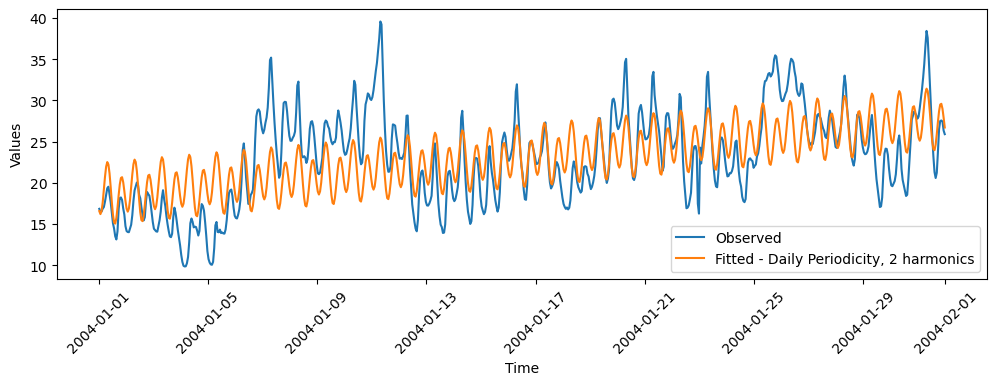

In [60]:
# Regression with multiple harmonics

model_2 = LinearRegression() 
model_2.fit(waves[['trend','sin(1,24)','cos(1,24)', 'sin(2,24)', 'cos(2,24)']], harmonic_df_jan04['load_rs']) # 2 harmonics

# Fitted values
fitted_2 = model_2.predict(waves[['trend','sin(1,24)','cos(1,24)', 'sin(2,24)', 'cos(2,24)']])

# Regression fit score
print(model_2.score(waves[['trend','sin(1,24)','cos(1,24)','sin(2,24)','cos(2,24)']], harmonic_df_jan04['load_rs'])) # r2 score

# Observed versus fitted values plot
fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(harmonic_df_jan04.index, np.array(harmonic_df_jan04.load_rs).reshape(-1, 1), label="Observed")
ax.plot(harmonic_df_jan04.index, fitted_2, label="Fitted - Daily Periodicity, 2 harmonics")
ax.set_xlabel("Time")
ax.set_ylabel("Values")
ax.legend()
plt.xticks(rotation=45)
plt.show()

R2 score improved substantially.

0.3780035268570444


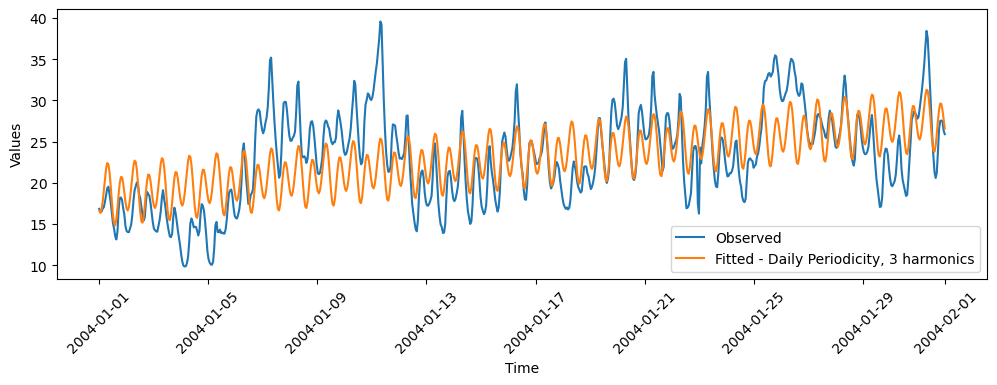

In [61]:
# Regression with multiple harmonics

model_3 = LinearRegression() 
model_3.fit(waves[['trend','sin(1,24)','cos(1,24)', 'sin(2,24)', 'cos(2,24)', 'sin(3,24)', 'cos(3,24)']], harmonic_df_jan04['load_rs']) # 3 harmonics

# Fitted values
fitted_3 = model_3.predict(waves[['trend','sin(1,24)','cos(1,24)', 'sin(2,24)', 'cos(2,24)', 'sin(3,24)', 'cos(3,24)']])

# Regression fit score
print(model_3.score(waves[['trend','sin(1,24)','cos(1,24)','sin(2,24)','cos(2,24)', 'sin(3,24)', 'cos(3,24)']], harmonic_df_jan04['load_rs'])) # r2 score

# Observed versus fitted values plot
fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(harmonic_df_jan04.index, np.array(harmonic_df_jan04.load_rs).reshape(-1, 1), label="Observed")
ax.plot(harmonic_df_jan04.index, fitted_3, label="Fitted - Daily Periodicity, 3 harmonics")
ax.set_xlabel("Time")
ax.set_ylabel("Values")
ax.legend()
plt.xticks(rotation=45)
plt.show()

3 harmonics didn't improve r2, compared to 2 harmonics.

0.3836335540912895


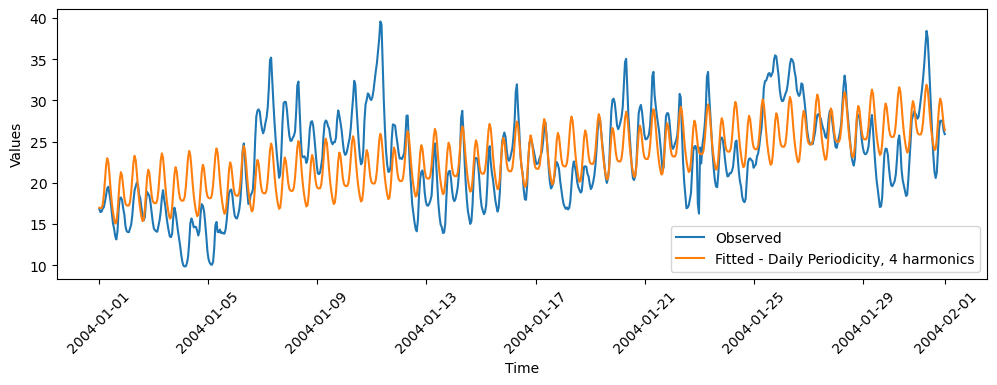

In [62]:
# Regression with multiple harmonics

model_4 = LinearRegression() 
model_4.fit(waves, harmonic_df_jan04['load_rs']) # 4 harmonics

# Fitted values
fitted_4 = model_4.predict(waves)

# Regression fit score
print(model_4.score(waves, harmonic_df_jan04['load_rs'])) # r2 score

# Observed versus fitted values plot
fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(harmonic_df_jan04.index, np.array(harmonic_df_jan04.load_rs).reshape(-1, 1), label="Observed")
ax.plot(harmonic_df_jan04.index, fitted_4, label="Fitted - Daily Periodicity, 4 harmonics")
ax.set_xlabel("Time")
ax.set_ylabel("Values")
ax.legend()
plt.xticks(rotation=45)
plt.show()

R2 score didn't improve by much, compared to 2 harmonics. Excessive number of harmonics could lead to overfitting.

In [63]:
# Adding periodicities, 24 hour + 12 hour periodicities
periodicity_3 = Fourier(period=24, order=2) # daily cycle i.e. 24 hours, 2 harmonics
periodicity_4 = Fourier(period=12, order=2) # half day cycle i.e. 12 hours, 2 harmonics

# Defining the sine wave
dp = DeterministicProcess(
    index=harmonic_df_jan04.index,
    period=None,         # It's not defined so that frequency can be read from the index
    constant=False,      # Let regression model define this intercept later on
    order=1,             # allows trend to be included so that the level of the wave is allowed to change with time, linearly 
    seasonal=False,      # no seasonal dummies
    additional_terms=[periodicity_3, periodicity_4], 
    drop=True            # if perfect collinearity exists, the terms can be dropped
)

waves = dp.in_sample()
waves.head()

,trend,"sin(1,24)","cos(1,24)","sin(2,24)","cos(2,24)","sin(2,12)","cos(2,12)"
timestamp,,,,,,,
2004-01-01 00:30:00,1.0,0.000000,1.000000,0.000000,1.000000e+00,0.000000e+00,1.0
2004-01-01 01:30:00,2.0,0.258819,0.965926,0.500000,8.660254e-01,8.660254e-01,0.5
2004-01-01 02:30:00,3.0,0.500000,0.866025,0.866025,5.000000e-01,8.660254e-01,-0.5
2004-01-01 03:30:00,4.0,0.707107,0.707107,1.000000,6.123234e-17,1.224647e-16,-1.0
2004-01-01 04:30:00,5.0,0.866025,0.500000,0.866025,-5.000000e-01,-8.660254e-01,-0.5


Due to collinearity, 1st harmonic for 12 hour cycle was dropped.

0.38307248891662715


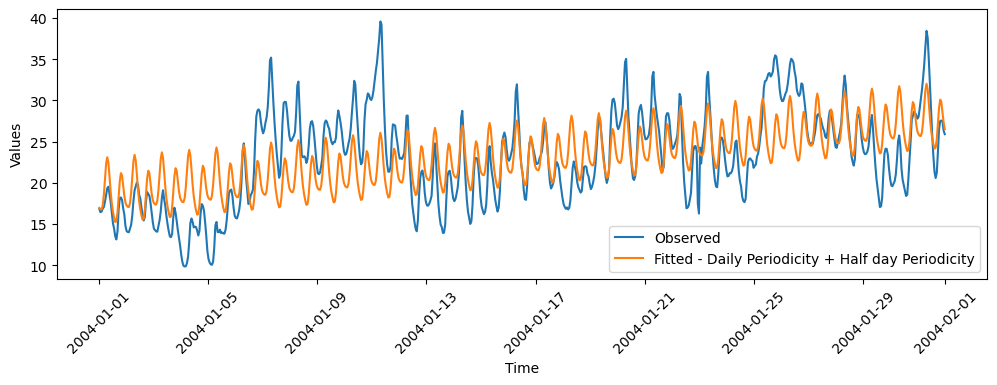

In [64]:
# Regression with multiple harmonics

model_5 = LinearRegression() 
model_5.fit(waves, harmonic_df_jan04['load_rs']) 

# Fitted values
fitted_5 = model_5.predict(waves)

# Regression fit score
print(model_5.score(waves, harmonic_df_jan04['load_rs'])) # r2 score

# Observed versus fitted values plot
fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(harmonic_df_jan04.index, np.array(harmonic_df_jan04.load_rs).reshape(-1, 1), label="Observed")
ax.plot(harmonic_df_jan04.index, fitted_5, label="Fitted - Daily Periodicity + Half day Periodicity")
ax.set_xlabel("Time")
ax.set_ylabel("Values")
ax.legend()
plt.xticks(rotation=45)
plt.show()

R2 score slightly improved, compared to the case where 2 harmonics from daily periodicity were used. Observing at ACF for different time periods, using 12 hour periodicity is not promising since it can change depending on month of year.<br><br>
To avoid overfitting, 2 harmonics with 24 hr periodicity is the most relevant. It explains the variance just as much as other cases with more harmonics.

<b>Residual Plot - Variance of residuals with time </b><br>
It is important that variance is near constant or stable.

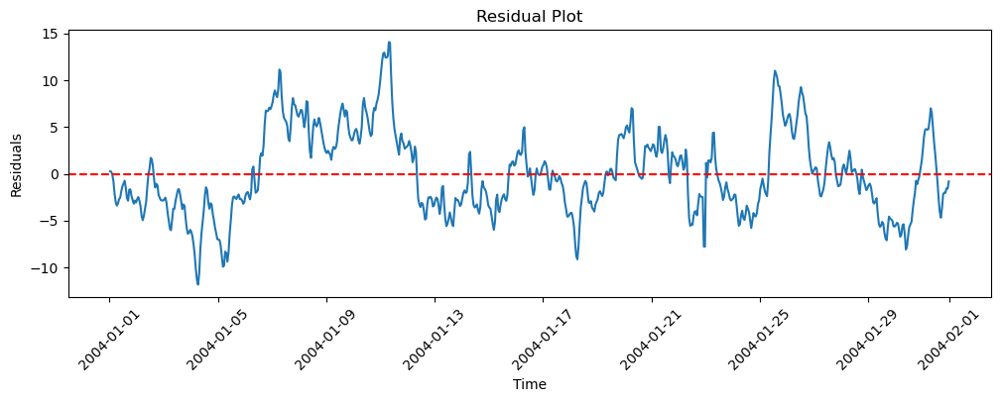

In [65]:
# Using the case of only daily periodicity with 2 harmonics

fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(harmonic_df_jan04.index, np.array(harmonic_df_jan04.load_rs - fitted_2).reshape(-1, 1), label="Residuals")
ax.set_xlabel("Time")
ax.set_ylabel("Residuals")
ax.axhline(np.mean(harmonic_df_jan04.load_rs - fitted_2), color="red", linestyle="--") # Residual mean
plt.xticks(rotation=45)
ax.set_title("Residual Plot")
plt.show()

- The residuals fluctuate around zero without a strong “funnel shape” (not clearly expanding or shrinking as time goes on).
- Importantly, variance does not explode over time (no runaway volatility) nor does it dampen to near zero.

<b>Residual Plot - Residuals vs Fitted Values </b><br>

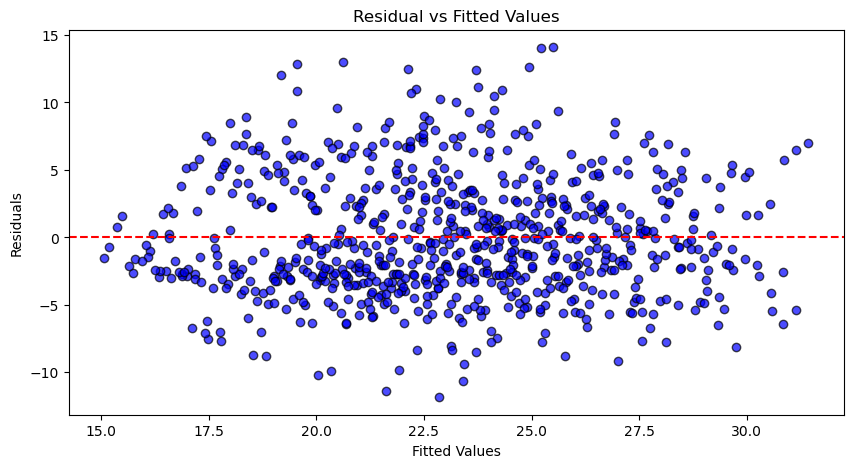

In [66]:
# Using the case of only daily periodicity with 2 harmonics

fig, ax = plt.subplots(figsize=(10,5))
plt.scatter(fitted_2, np.array(harmonic_df_jan04.load_rs - fitted_2).reshape(-1, 1), color="blue", alpha=0.7, edgecolors="black")
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
ax.axhline(np.mean(harmonic_df_jan04.load_rs - fitted_2), color="red", linestyle="--") # Residual mean
plt.title("Residual vs Fitted Values")
plt.show()

Plot looks good.

##### Log Transformation

0.3939081616488005


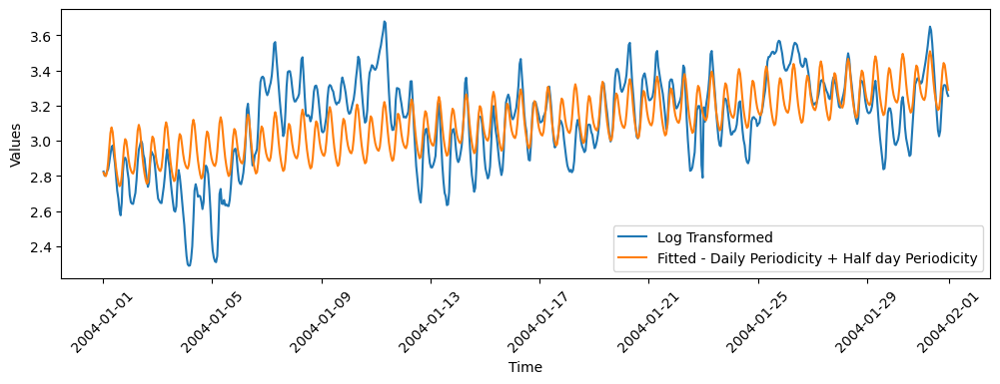

In [67]:
# Using log transformation to see improvements

model_6 = LinearRegression() 
model_6.fit(waves, np.log(harmonic_df_jan04['load_rs']))

# Fitted values
fitted_6 = model_6.predict(waves)

# Regression fit score
print(model_6.score(waves,  np.log(harmonic_df_jan04['load_rs']))) # r2 score

# Observed versus fitted values plot
fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(harmonic_df_jan04.index, np.array(np.log(harmonic_df_jan04.load_rs)).reshape(-1, 1), label="Log Transformed")
ax.plot(harmonic_df_jan04.index, fitted_6, label="Fitted - Daily Periodicity + Half day Periodicity")
ax.set_xlabel("Time")
ax.set_ylabel("Values")
ax.legend()
plt.xticks(rotation=45)
plt.show()

R2 score has slightly improved.

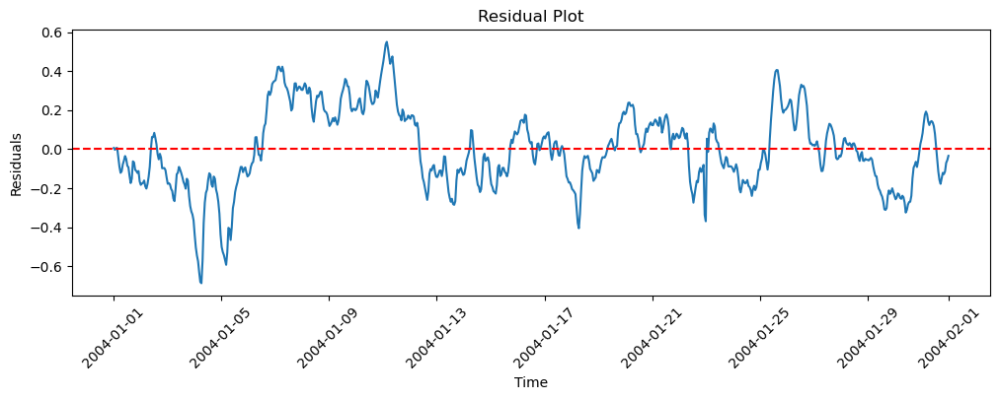

In [68]:
# Residual plot with time

fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(harmonic_df_jan04.index, np.array(np.log(harmonic_df_jan04.load_rs) - fitted_6).reshape(-1, 1), label="Residuals")
ax.set_xlabel("Time")
ax.set_ylabel("Residuals")
ax.axhline(np.mean(np.log(harmonic_df_jan04.load_rs) - fitted_6), color="red", linestyle="--") # Residual mean
plt.xticks(rotation=45)
ax.set_title("Residual Plot")
plt.show()

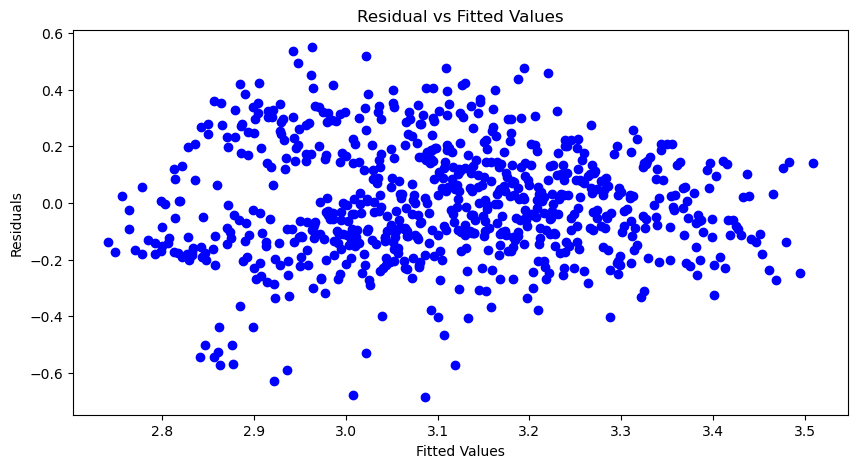

In [69]:
# Residual versus Fitted Values

fig, ax = plt.subplots(figsize=(10,5))
plt.scatter(fitted_6, np.array(np.log(harmonic_df_jan04.load_rs) - fitted_6).reshape(-1, 1), color="blue")
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residual vs Fitted Values")
plt.show()

#### Training

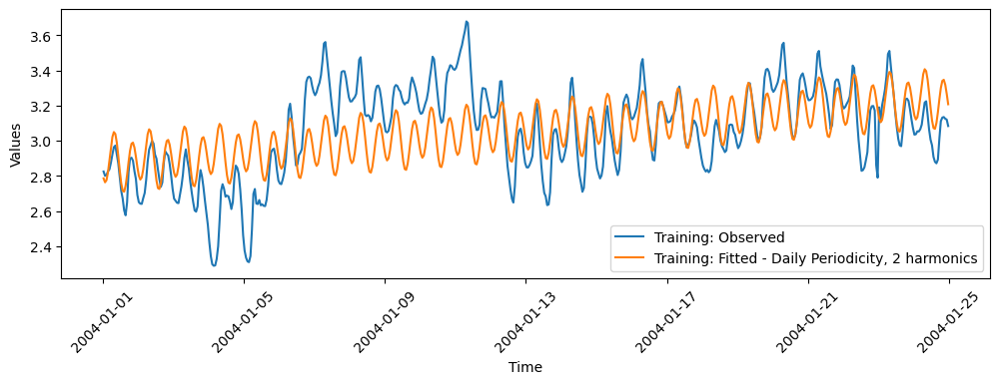

In [70]:
# daily periodicity and 2 harmonics
harmonic_df_jan04["log_load_rs"] = np.log(harmonic_df_jan04.load_rs)

# defining training data
harmonic_df_jan04_train = harmonic_df_jan04.loc[(harmonic_df_jan04.index <= "2004-01-25") & (harmonic_df_jan04.index >= "2004-01-01 00:30:00"), :]

# Adding periodicities
periodicity = Fourier(period=24, order=2) # daily cycle i.e. 24 hours, 2 harmonics

# Defining the sine wave
dp = DeterministicProcess(
    index=harmonic_df_jan04_train.index,
    period=None,         # It's not defined so that frequency can be read from the index
    constant=False,      # Let regression model define this intercept later on
    order=1,             # allows trend to be included so that the level of the wave is allowed to change with time, linearly 
    seasonal=False,      # no seasonal dummies
    additional_terms=[periodicity], # 2 seperate waves will be generated
    drop=True            # if perfect collinearity exists, the terms can be dropped
)

waves = dp.in_sample()

# Regression with 2 harmonics
model_jan04_train = LinearRegression() 
X_train = waves[['trend','sin(1,24)','cos(1,24)', 'sin(2,24)', 'cos(2,24)']]
y_train = harmonic_df_jan04_train.log_load_rs
model_jan04_train.fit(X_train, y_train) # 2 harmonics

# Fitted values - training data
fitted_jan04_train = model_jan04_train.predict(X_train)

# Observed versus fitted values plot
fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(harmonic_df_jan04_train.index, y_train, label="Training: Observed")
ax.plot(harmonic_df_jan04_train.index, fitted_jan04_train, label="Training: Fitted - Daily Periodicity, 2 harmonics")
ax.set_xlabel("Time")
ax.set_ylabel("Values")
ax.legend()
plt.xticks(rotation=45)
plt.show()

In [71]:
# Performance on training set
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error, mean_absolute_error

print(f"R2 score: {r2_score(y_train, fitted_jan04_train)}")
print(f'MSE score: {mean_squared_error(y_train, fitted_jan04_train)}')
print(f'MAE score: {mean_absolute_error(y_train, fitted_jan04_train)}')
print(f'MAPE score: {mean_absolute_percentage_error(y_train, fitted_jan04_train)}')

R2 score: 0.3381553616038755
MSE score: 0.044124554655799716
MAE score: 0.16836988371264885
MAPE score: 0.05609579804428893


#### Testing

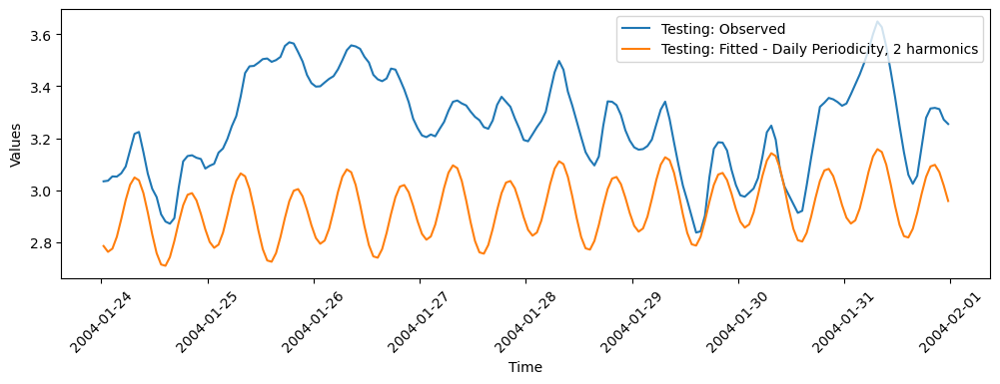

In [72]:
# defining test data
harmonic_df_jan04_test = harmonic_df_jan04.loc[(harmonic_df_jan04.index > "2004-01-24") & (harmonic_df_jan04.index < "2004-02-01"), :]

# Defining the sine wave
dp = DeterministicProcess(
    index=harmonic_df_jan04_test.index,
    period=None,         # It's not defined so that frequency can be read from the index
    constant=False,      # Let regression model define this intercept later on
    order=1,             # allows trend to be included so that the level of the wave is allowed to change with time, linearly 
    seasonal=False,      # no seasonal dummies
    additional_terms=[periodicity], # 2 seperate waves will be generated
    drop=True            # if perfect collinearity exists, the terms can be dropped
)

waves = dp.in_sample()

# Regression with 2 harmonics
model_jan04_test = LinearRegression() 
X_test = waves[['trend','sin(1,24)','cos(1,24)', 'sin(2,24)', 'cos(2,24)']]
y_test = harmonic_df_jan04_test.log_load_rs

# Fitted values - test data
fitted_jan04_test = model_jan04_train.predict(X_test)

# Observed versus fitted values plot
fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(harmonic_df_jan04_test.index, y_test, label="Testing: Observed")
ax.plot(harmonic_df_jan04_test.index, fitted_jan04_test, label="Testing: Fitted - Daily Periodicity, 2 harmonics")
ax.set_xlabel("Time")
ax.set_ylabel("Values")
ax.legend()
plt.xticks(rotation=45)
plt.show()

In [73]:
# Performance on test set

print(f"R2 score: {r2_score(y_test, fitted_jan04_test)}")
print(f'MSE score: {mean_squared_error(y_test, fitted_jan04_test)}')
print(f'MAE score: {mean_absolute_error(y_test, fitted_jan04_test)}')
print(f'MAPE score: {mean_absolute_percentage_error(y_test, fitted_jan04_test)}')

R2 score: -2.994234065085959
MSE score: 0.133300896828065
MAE score: 0.3209263909224331
MAPE score: 0.09650670940345635


### Defining Harmonic For Apr 2004, Zone 1

#### Identifying Periodicity and Number of Harmonics

In [74]:
# generating a new dataframe - Zone 1 (Jan 2004)
harmonic_df_apr04 = load_long_z1.loc[(load_long_z1.year == 2004) & (load_long_z1.month == 4),['timestamp','month','day','hour','load_rs']]
harmonic_df_apr04["t"] = range(1,len(harmonic_df_apr04)+1)
harmonic_df_apr04 = harmonic_df_apr04.set_index("timestamp")
harmonic_df_apr04.head()

,month,day,hour,load_rs,t
timestamp,,,,,
2004-04-01 00:30:00,4,1,00:30,14.095,1
2004-04-01 01:30:00,4,1,01:30,13.928,2
2004-04-01 02:30:00,4,1,02:30,13.916,3
2004-04-01 03:30:00,4,1,03:30,14.101,4
2004-04-01 04:30:00,4,1,04:30,14.710,5


In [75]:
# Adding periodicities
periodicity_1 = Fourier(period=24, order=4) # daily cycle i.e. 24 hours, 4 harmonics

# Defining the sine wave
dp = DeterministicProcess(
    index=harmonic_df_apr04.index,
    period=None,         # It's not defined so that frequency can be read from the index
    constant=False,      # Let regression model define this intercept later on
    order=1,             # allows trend to be included so that the level of the wave is allowed to change with time, linearly 
    seasonal=False,      # no seasonal dummies
    additional_terms=[periodicity_1], # 4 seperate waves will be generated
    drop=True            # if perfect collinearity exists, the terms can be dropped
)

waves = dp.in_sample()
waves.head()

,trend,"sin(1,24)","cos(1,24)","sin(2,24)","cos(2,24)","sin(3,24)","cos(3,24)","sin(4,24)","cos(4,24)"
timestamp,,,,,,,,,
2004-04-01 00:30:00,1.0,0.000000,1.000000,0.000000,1.000000e+00,0.000000e+00,1.000000e+00,0.000000e+00,1.0
2004-04-01 01:30:00,2.0,0.258819,0.965926,0.500000,8.660254e-01,7.071068e-01,7.071068e-01,8.660254e-01,0.5
2004-04-01 02:30:00,3.0,0.500000,0.866025,0.866025,5.000000e-01,1.000000e+00,6.123234e-17,8.660254e-01,-0.5
2004-04-01 03:30:00,4.0,0.707107,0.707107,1.000000,6.123234e-17,7.071068e-01,-7.071068e-01,1.224647e-16,-1.0
2004-04-01 04:30:00,5.0,0.866025,0.500000,0.866025,-5.000000e-01,1.224647e-16,-1.000000e+00,-8.660254e-01,-0.5


In [76]:
# Fitting regression model
model_1 = LinearRegression() 
model_1.fit(waves, harmonic_df_apr04['load_rs'])

LinearRegression()

0.47930450109886846


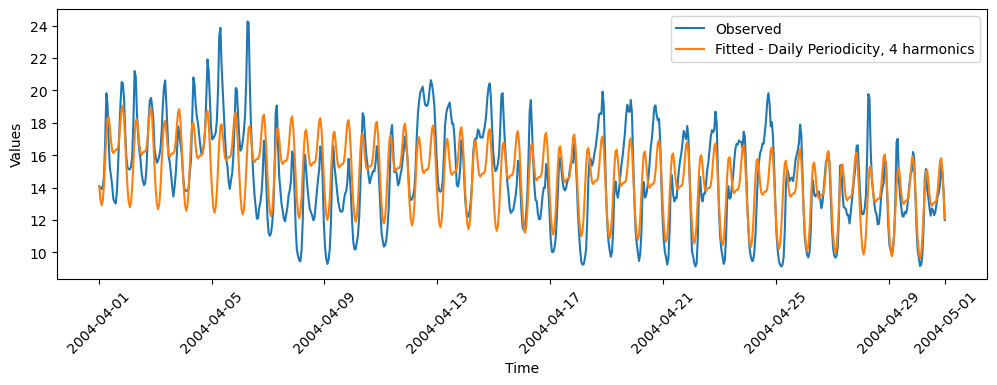

In [77]:
# Fitted values
fitted_1 = model_1.predict(waves)

# Regression fit score
print(model_1.score(waves, harmonic_df_apr04['load_rs'])) # r2 score

# Observed versus fitted values plot
fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(harmonic_df_apr04.index, np.array(harmonic_df_apr04.load_rs).reshape(-1, 1), label="Observed")
ax.plot(harmonic_df_apr04.index, fitted_1, label="Fitted - Daily Periodicity, 4 harmonics")
ax.set_xlabel("Time")
ax.set_ylabel("Values")
ax.legend()
plt.xticks(rotation=45)
plt.show()

With all 4 harmonics, the R2 score appears to be very strong. Can reducing harmonics retain training performance ?

0.4736185686262562


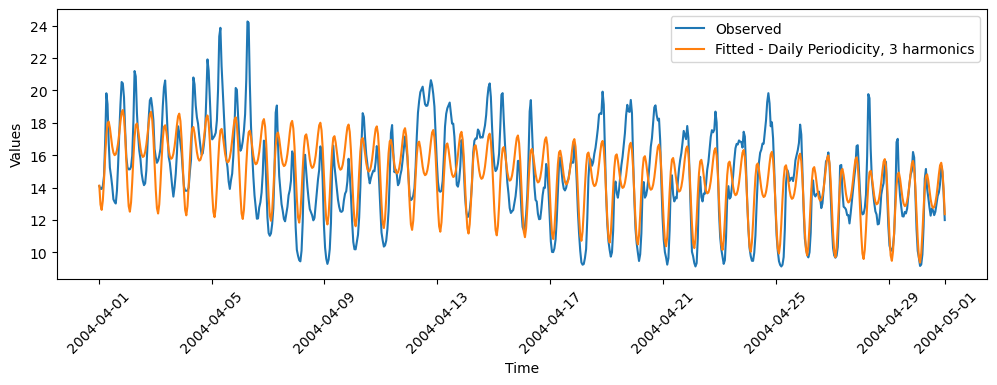

In [78]:
# Fitting regression model
model_2 = LinearRegression() 
model_2.fit(waves[['trend', 'sin(1,24)',	'cos(1,24)',	'sin(2,24)',	'cos(2,24)',	'sin(3,24)',	'cos(3,24)'	]], harmonic_df_apr04['load_rs'])

# Fitted values
fitted_2 = model_2.predict(waves[['trend', 'sin(1,24)',	'cos(1,24)',	'sin(2,24)',	'cos(2,24)',	'sin(3,24)',	'cos(3,24)'	]])

# Regression fit score
print(model_2.score(waves[['trend', 'sin(1,24)',	'cos(1,24)',	'sin(2,24)',	'cos(2,24)',	'sin(3,24)',	'cos(3,24)'	]], harmonic_df_apr04['load_rs'])) # r2 score

# Observed versus fitted values plot
fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(harmonic_df_apr04.index, np.array(harmonic_df_apr04.load_rs).reshape(-1, 1), label="Observed")
ax.plot(harmonic_df_apr04.index, fitted_2, label="Fitted - Daily Periodicity, 3 harmonics")
ax.set_xlabel("Time")
ax.set_ylabel("Values")
ax.legend()
plt.xticks(rotation=45)
plt.show()

Performance drop is not considerable, hence 4 harmonics are not required. Can 2 harmonics retain performance?

0.46059974092938305


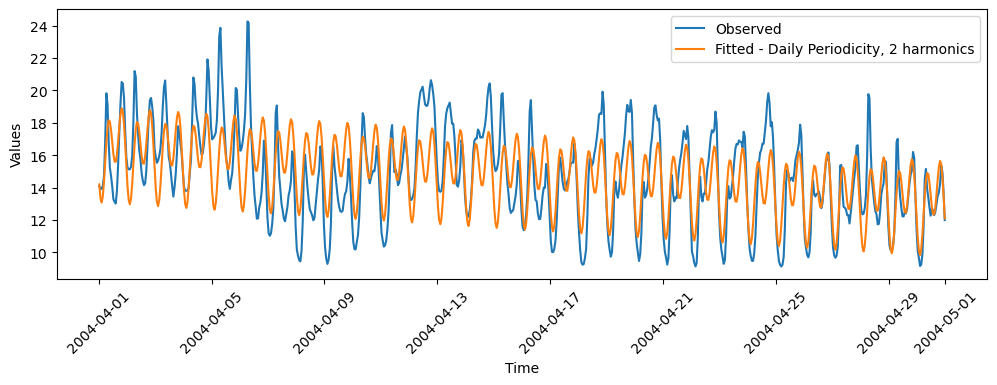

In [79]:
# Fitting regression model
model_3 = LinearRegression() 
model_3.fit(waves[['trend', 'sin(1,24)',	'cos(1,24)',	'sin(2,24)',	'cos(2,24)']], harmonic_df_apr04['load_rs'])

# Fitted values
fitted_3 = model_3.predict(waves[['trend', 'sin(1,24)',	'cos(1,24)',	'sin(2,24)',	'cos(2,24)']])

# Regression fit score
print(model_3.score(waves[['trend', 'sin(1,24)',	'cos(1,24)',	'sin(2,24)',	'cos(2,24)']], harmonic_df_apr04['load_rs'])) # r2 score

# Observed versus fitted values plot
fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(harmonic_df_apr04.index, np.array(harmonic_df_apr04.load_rs).reshape(-1, 1), label="Observed")
ax.plot(harmonic_df_apr04.index, fitted_3, label="Fitted - Daily Periodicity, 2 harmonics")
ax.set_xlabel("Time")
ax.set_ylabel("Values")
ax.legend()
plt.xticks(rotation=45)
plt.show()

2 harmonics appear sufficient. Using more harmonics can lead to overfitting.

0.49259763172567683


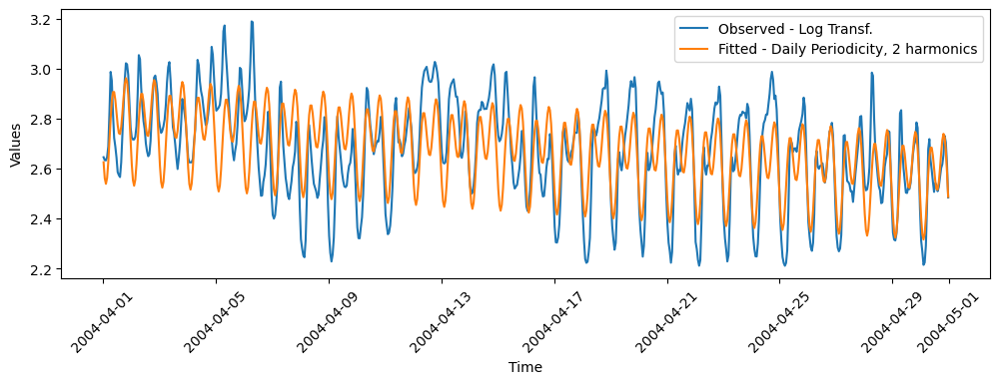

In [80]:
# Does log transformation improve performance? - 2 harmonics

# Fitting regression model
model_4 = LinearRegression() 
model_4.fit(waves[['trend', 'sin(1,24)',	'cos(1,24)',	'sin(2,24)',	'cos(2,24)']], np.log(harmonic_df_apr04['load_rs']))

# Fitted values
fitted_4 = model_4.predict(waves[['trend', 'sin(1,24)',	'cos(1,24)',	'sin(2,24)',	'cos(2,24)']])

# Regression fit score
print(model_4.score(waves[['trend', 'sin(1,24)',	'cos(1,24)',	'sin(2,24)',	'cos(2,24)']], np.log(harmonic_df_apr04['load_rs']))) # r2 score

# Observed versus fitted values plot
fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(harmonic_df_apr04.index, np.array(np.log(harmonic_df_apr04.load_rs)).reshape(-1, 1), label="Observed - Log Transf.")
ax.plot(harmonic_df_apr04.index, fitted_4, label="Fitted - Daily Periodicity, 2 harmonics")
ax.set_xlabel("Time")
ax.set_ylabel("Values")
ax.legend()
plt.xticks(rotation=45)
plt.show()

Performance increase is considerable with log transformation.

<b>Residuals vs Time Plot</b><br>
Assessing the relationship between residual variance and time.

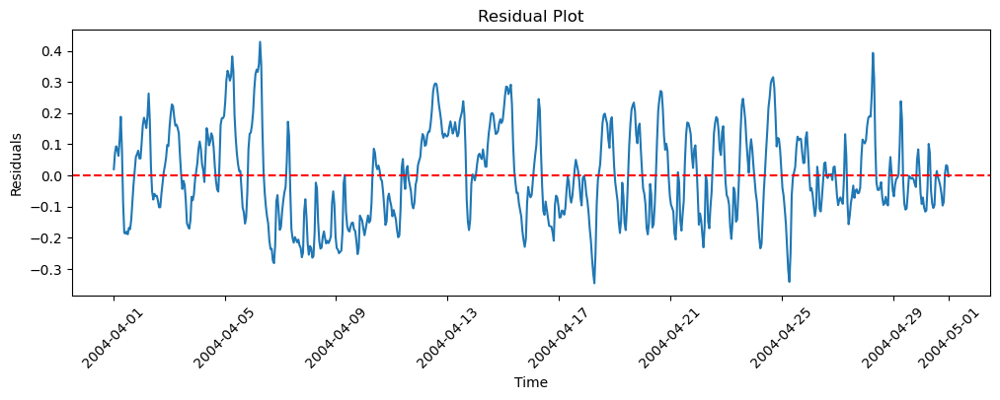

In [81]:
# Residual plot with time - log transformed load

fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(harmonic_df_apr04.index, np.array(np.log(harmonic_df_apr04.load_rs) - fitted_4).reshape(-1, 1), label="Residuals")
ax.set_xlabel("Time")
ax.set_ylabel("Residuals")
ax.axhline(np.mean(np.log(harmonic_df_apr04.load_rs) - fitted_4), color="red", linestyle="--") # Residual mean
plt.xticks(rotation=45)
ax.set_title("Residual Plot")
plt.show()

- The residuals fluctuate around zero without a strong “funnel shape” (not clearly expanding or shrinking as time goes on).
- Importantly, variance does not explode over time (no runaway volatility) nor does it dampen to near zero.

<b>Residual Plot - Residuals vs Fitted Values </b><br>

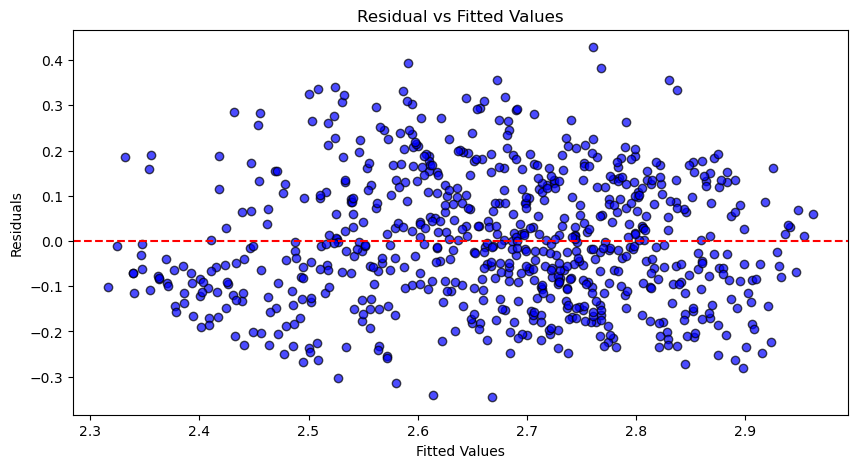

In [82]:
# Using the case of only daily periodicity with 4 harmonics - log transformed

fig, ax = plt.subplots(figsize=(10,5))
plt.scatter(fitted_4, np.array(np.log(harmonic_df_apr04.load_rs) - fitted_4).reshape(-1, 1), color="blue", alpha=0.7, edgecolors="black")
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
ax.axhline(np.mean(np.log(harmonic_df_apr04.load_rs) - fitted_4), color="red", linestyle="--") # Residual mean
plt.title("Residual vs Fitted Values")
plt.show()

Plot looks good, residuals have '0' mean and variance appears stable.<br>
Hence, 2 harmonics with daily periodicity suffice.

#### Training

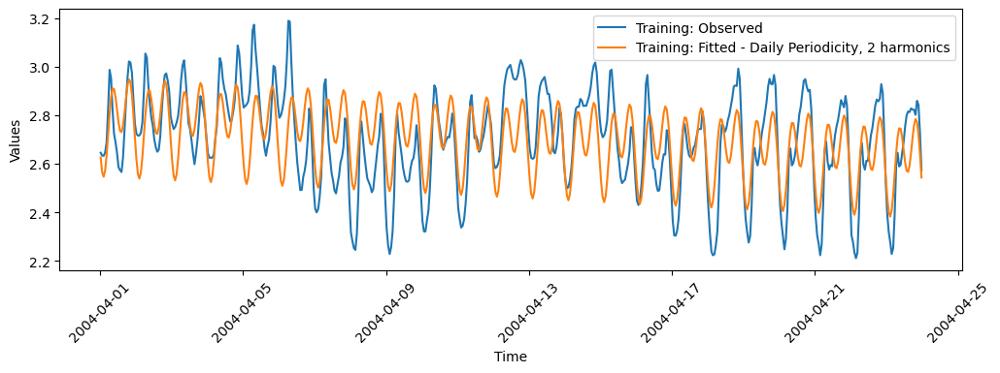

In [83]:
# daily periodicity and 2 harmonics
harmonic_df_apr04["log_load_rs"] = np.log(harmonic_df_apr04.load_rs)

# defining training data
harmonic_df_apr04_train = harmonic_df_apr04.loc[(harmonic_df_apr04.index < "2004-04-24") & (harmonic_df_apr04.index >= "2004-04-01 00:30:00"), :]

# Defining the sine wave
dp = DeterministicProcess(
    index=harmonic_df_apr04_train.index,
    period=None,         # It's not defined so that frequency can be read from the index
    constant=False,      # Let regression model define this intercept later on
    order=1,             # allows trend to be included so that the level of the wave is allowed to change with time, linearly 
    seasonal=False,      # no seasonal dummies
    additional_terms=[periodicity], # 2 seperate waves will be generated
    drop=True            # if perfect collinearity exists, the terms can be dropped
)

waves = dp.in_sample()

# Regression with 2 harmonics
model_apr04_train = LinearRegression() 
X_train = waves[['trend','sin(1,24)','cos(1,24)', 'sin(2,24)', 'cos(2,24)']]
y_train = harmonic_df_apr04_train.log_load_rs
model_apr04_train.fit(X_train, y_train) # 2 harmonics

# Fitted values - training data
fitted_apr04_train = model_apr04_train.predict(X_train)

# Observed versus fitted values plot
fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(harmonic_df_apr04_train.index, y_train, label="Training: Observed")
ax.plot(harmonic_df_apr04_train.index, fitted_apr04_train, label="Training: Fitted - Daily Periodicity, 2 harmonics")
ax.set_xlabel("Time")
ax.set_ylabel("Values")
ax.legend()
plt.xticks(rotation=45)
plt.show()

In [84]:
# Performance on training set
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error, mean_absolute_error

print(f"R2 score: {r2_score(y_train, fitted_apr04_train)}")
print(f'MSE score: {mean_squared_error(y_train, fitted_apr04_train)}')
print(f'MAE score: {mean_absolute_error(y_train, fitted_apr04_train)}')
print(f'MAPE score: {mean_absolute_percentage_error(y_train, fitted_apr04_train)}')

R2 score: 0.42703382913083954
MSE score: 0.022776260931698468
MAE score: 0.12820815647371392
MAPE score: 0.04790899962340809


#### Testing

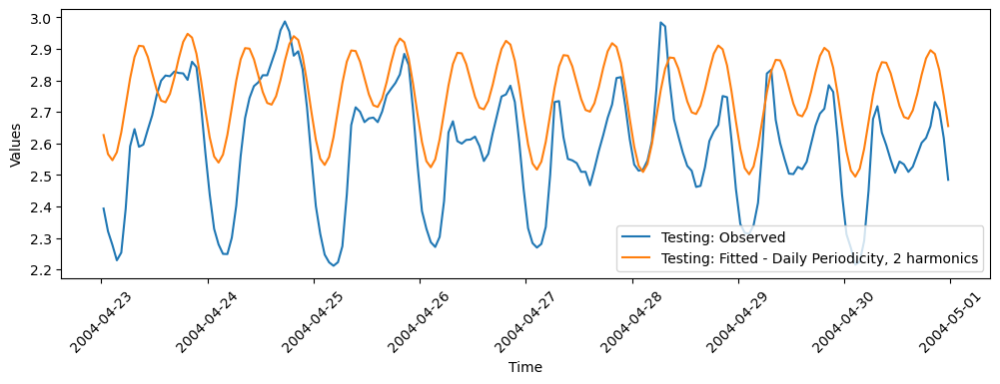

In [85]:
# defining test data
harmonic_df_apr04_test = harmonic_df_apr04.loc[(harmonic_df_apr04.index > "2004-04-23") & (harmonic_df_apr04.index < "2004-05-01 00:30:00"), :]

# Defining the sine wave
dp = DeterministicProcess(
    index=harmonic_df_apr04_test.index,
    period=None,         # It's not defined so that frequency can be read from the index
    constant=False,      # Let regression model define this intercept later on
    order=1,             # allows trend to be included so that the level of the wave is allowed to change with time, linearly 
    seasonal=False,      # no seasonal dummies
    additional_terms=[periodicity], # 2 seperate waves will be generated
    drop=True            # if perfect collinearity exists, the terms can be dropped
)

waves = dp.in_sample()

# Regression with 2 harmonics
model_apr04_test = LinearRegression() 
X_test = waves[['trend','sin(1,24)','cos(1,24)', 'sin(2,24)', 'cos(2,24)']]
y_test = harmonic_df_apr04_test.log_load_rs

# Fitted values - test data
fitted_apr04_test = model_apr04_train.predict(X_test)

# Observed versus fitted values plot
fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(harmonic_df_apr04_test.index, y_test, label="Testing: Observed")
ax.plot(harmonic_df_apr04_test.index, fitted_apr04_test, label="Testing: Fitted - Daily Periodicity, 2 harmonics")
ax.set_xlabel("Time")
ax.set_ylabel("Values")
ax.legend()
plt.xticks(rotation=45)
plt.show()

In [86]:
# Performance on test set

print(f"R2 score: {r2_score(y_test, fitted_apr04_test)}")
print(f'MSE score: {mean_squared_error(y_test, fitted_apr04_test)}')
print(f'MAE score: {mean_absolute_error(y_test, fitted_apr04_test)}')
print(f'MAPE score: {mean_absolute_percentage_error(y_test, fitted_apr04_test)}')

R2 score: -0.20304066379035302
MSE score: 0.042599642157784896
MAE score: 0.18201500339917423
MAPE score: 0.0727199711471181


### Defining Harmonic For Jul 2004, Zone 1

#### Identifying Suitable Number of Harmonics and Periodicity

In [87]:
# generating a new dataframe - Zone 1 (Jul 2004)
harmonic_df_jul04 = load_long_z1.loc[(load_long_z1.year == 2004) & (load_long_z1.month == 7),['timestamp','month','day','hour','load_rs']]
harmonic_df_jul04["t"] = range(1,len(harmonic_df_jul04)+1)
harmonic_df_jul04 = harmonic_df_jul04.set_index("timestamp")
harmonic_df_jul04.head()

,month,day,hour,load_rs,t
timestamp,,,,,
2004-07-01 00:30:00,7,1,00:30,14.271,1
2004-07-01 01:30:00,7,1,01:30,12.788,2
2004-07-01 02:30:00,7,1,02:30,11.970,3
2004-07-01 03:30:00,7,1,03:30,11.559,4
2004-07-01 04:30:00,7,1,04:30,11.366,5


0.9042701946077442


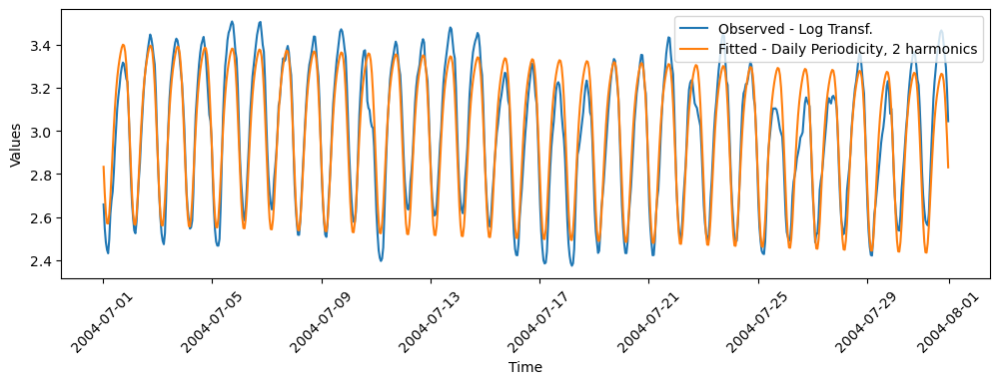

In [88]:
# LOG TRANSFORMED

# Adding periodicities
periodicity_1 = Fourier(period=24, order=4) # daily cycle i.e. 24 hours, 4 harmonics

# Defining the sine wave
dp = DeterministicProcess(
    index=harmonic_df_jul04.index,
    period=None,         # It's not defined so that frequency can be read from the index
    constant=False,      # Let regression model define this intercept later on
    order=1,             # allows trend to be included so that the level of the wave is allowed to change with time, linearly 
    seasonal=False,      # no seasonal dummies
    additional_terms=[periodicity_1], # 4 seperate waves will be generated
    drop=True            # if perfect collinearity exists, the terms can be dropped
)

waves = dp.in_sample()

# Fitting regression model - log transformed
model_1 = LinearRegression() 
model_1.fit(waves[['trend', 'sin(1,24)', 'cos(1,24)', 'sin(2,24)', 'cos(2,24)']], np.log(harmonic_df_jul04['load_rs'])) # Only using first 2 harmonics

# Fitted values
fitted_1 = model_1.predict(waves[['trend', 'sin(1,24)',	'cos(1,24)', 'sin(2,24)', 'cos(2,24)']])

# Regression fit score
print(model_1.score(waves[['trend', 'sin(1,24)','cos(1,24)', 'sin(2,24)', 'cos(2,24)']], np.log(harmonic_df_jul04['load_rs']))) # r2 score

# Observed versus fitted values plot
fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(harmonic_df_jul04.index, np.array(np.log(harmonic_df_jul04.load_rs)).reshape(-1, 1), label="Observed - Log Transf.")
ax.plot(harmonic_df_jul04.index, fitted_1, label="Fitted - Daily Periodicity, 2 harmonics")
ax.set_xlabel("Time")
ax.set_ylabel("Values")
ax.legend()
plt.xticks(rotation=45)
plt.show()

0.9045735133565671


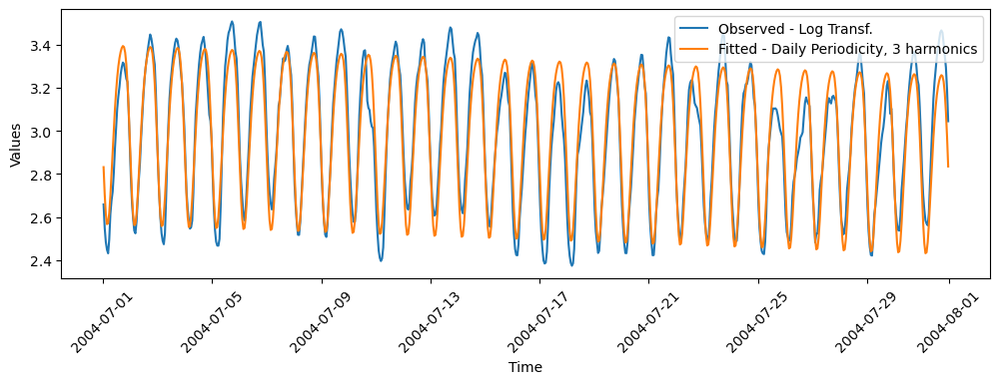

In [89]:
# Fitting regression model - log transformed
model_2 = LinearRegression() 
model_2.fit(waves[['trend', 'sin(1,24)', 'cos(1,24)', 'sin(2,24)', 'cos(2,24)', 'sin(3,24)', 'cos(3,24)']], np.log(harmonic_df_jul04['load_rs'])) # Only using first 3 harmonics

# Fitted values
fitted_2 = model_2.predict(waves[['trend', 'sin(1,24)',	'cos(1,24)', 'sin(2,24)', 'cos(2,24)', 'sin(3,24)', 'cos(3,24)']])

# Regression fit score
print(model_2.score(waves[['trend', 'sin(1,24)','cos(1,24)', 'sin(2,24)', 'cos(2,24)', 'sin(3,24)', 'cos(3,24)']], np.log(harmonic_df_jul04['load_rs']))) # r2 score

# Observed versus fitted values plot
fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(harmonic_df_jul04.index, np.array(np.log(harmonic_df_jul04.load_rs)).reshape(-1, 1), label="Observed - Log Transf.")
ax.plot(harmonic_df_jul04.index, fitted_2, label="Fitted - Daily Periodicity, 3 harmonics")
ax.set_xlabel("Time")
ax.set_ylabel("Values")
ax.legend()
plt.xticks(rotation=45)
plt.show()

3 harmonics didn't lead to performance increase! Can 4 harmonics make a difference?

0.9050231085177878


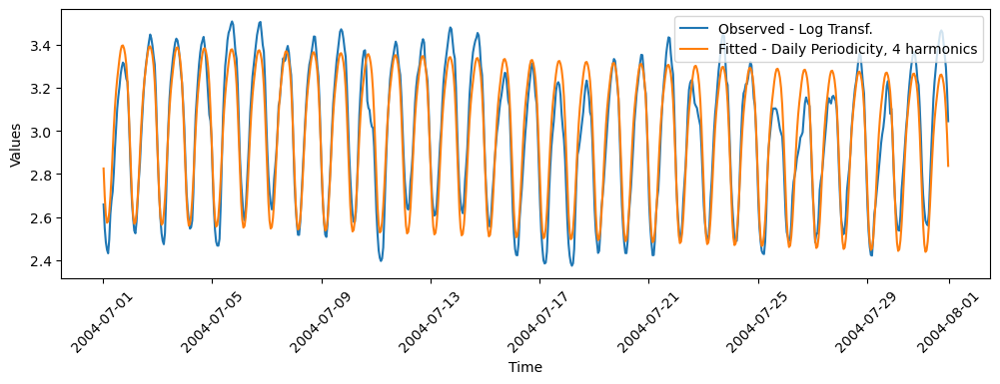

In [90]:
# Fitting regression model - log transformed
model_3 = LinearRegression() 
model_3.fit(waves, np.log(harmonic_df_jul04['load_rs'])) # Using 4 harmonics

# Fitted values
fitted_3 = model_3.predict(waves)

# Regression fit score
print(model_3.score(waves, np.log(harmonic_df_jul04['load_rs']))) # r2 score

# Observed versus fitted values plot
fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(harmonic_df_jul04.index, np.array(np.log(harmonic_df_jul04.load_rs)).reshape(-1, 1), label="Observed - Log Transf.")
ax.plot(harmonic_df_jul04.index, fitted_3, label="Fitted - Daily Periodicity, 4 harmonics")
ax.set_xlabel("Time")
ax.set_ylabel("Values")
ax.legend()
plt.xticks(rotation=45)
plt.show()

Did not lead to performance increase with 4 harmonics, 2 harmonics are sufficient here as well.

#### Training

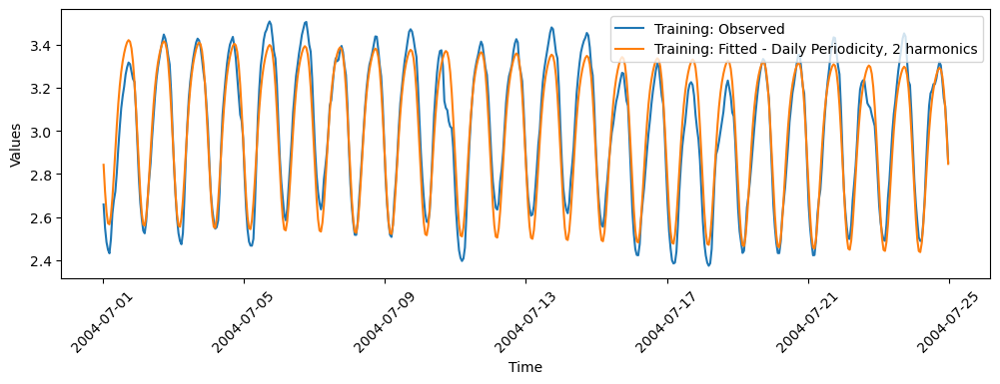

In [91]:
# daily periodicity and 2 harmonics
harmonic_df_jul04["log_load_rs"] = np.log(harmonic_df_jul04.load_rs)

# defining training data
harmonic_df_jul04_train = harmonic_df_jul04.loc[(harmonic_df_jul04.index < "2004-07-25") & (harmonic_df_jul04.index >= "2004-07-01 00:30:00"), :]

# Defining the sine wave
dp = DeterministicProcess(
    index=harmonic_df_jul04_train.index,
    period=None,         # It's not defined so that frequency can be read from the index
    constant=False,      # Let regression model define this intercept later on
    order=1,             # allows trend to be included so that the level of the wave is allowed to change with time, linearly 
    seasonal=False,      # no seasonal dummies
    additional_terms=[periodicity], # 2 seperate waves will be generated
    drop=True            # if perfect collinearity exists, the terms can be dropped
)

waves = dp.in_sample()

# Regression with 2 harmonics
model_jul04_train = LinearRegression() 
X_train = waves[['trend','sin(1,24)','cos(1,24)', 'sin(2,24)', 'cos(2,24)']]
y_train = harmonic_df_jul04_train.log_load_rs
model_jul04_train.fit(X_train, y_train) # 2 harmonics

# Fitted values - training data
fitted_jul04_train = model_jul04_train.predict(X_train)

# Observed versus fitted values plot
fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(harmonic_df_jul04_train.index, y_train, label="Training: Observed")
ax.plot(harmonic_df_jul04_train.index, fitted_jul04_train, label="Training: Fitted - Daily Periodicity, 2 harmonics")
ax.set_xlabel("Time")
ax.set_ylabel("Values")
ax.legend()
plt.xticks(rotation=45)
plt.show()

In [92]:
# Performance on training set
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error, mean_absolute_error

print(f"R2 score: {r2_score(y_train, fitted_jul04_train)}")
print(f'MSE score: {mean_squared_error(y_train, fitted_jul04_train)}')
print(f'MAE score: {mean_absolute_error(y_train, fitted_jul04_train)}')
print(f'MAPE score: {mean_absolute_percentage_error(y_train, fitted_jul04_train)}')

R2 score: 0.9203942247225417
MSE score: 0.008112284666127952
MAE score: 0.07471872425048823
MAPE score: 0.025341953152983245


#### Testing

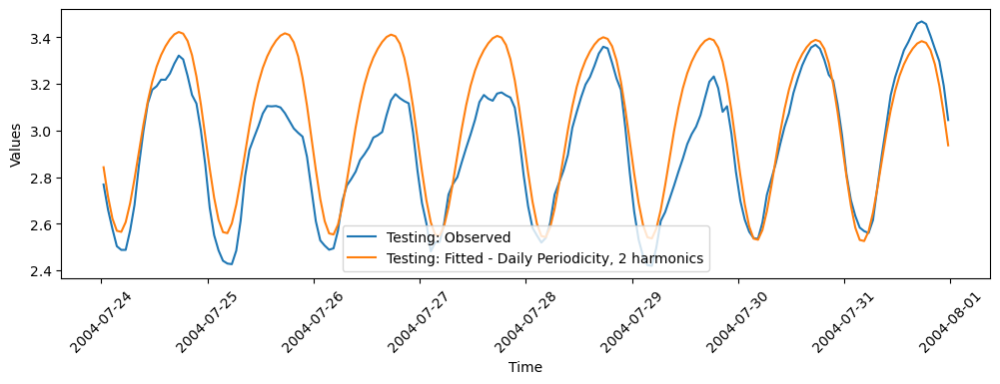

In [93]:
# defining test data
harmonic_df_jul04_test = harmonic_df_jul04.loc[(harmonic_df_jul04.index > "2004-07-24") & (harmonic_df_jul04.index < "2004-08-01 00:30:00"), :]

# Defining the sine wave
dp = DeterministicProcess(
    index=harmonic_df_jul04_test.index,
    period=None,         # It's not defined so that frequency can be read from the index
    constant=False,      # Let regression model define this intercept later on
    order=1,             # allows trend to be included so that the level of the wave is allowed to change with time, linearly 
    seasonal=False,      # no seasonal dummies
    additional_terms=[periodicity], # 2 seperate waves will be generated
    drop=True            # if perfect collinearity exists, the terms can be dropped
)

waves = dp.in_sample()

# Regression with 2 harmonics
model_jul04_test = LinearRegression() 
X_test = waves[['trend','sin(1,24)','cos(1,24)', 'sin(2,24)', 'cos(2,24)']]
y_test = harmonic_df_jul04_test.log_load_rs

# Fitted values - test data
fitted_jul04_test = model_jul04_train.predict(X_test)

# Observed versus fitted values plot
fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(harmonic_df_jul04_test.index, y_test, label="Testing: Observed")
ax.plot(harmonic_df_jul04_test.index, fitted_jul04_test, label="Testing: Fitted - Daily Periodicity, 2 harmonics")
ax.set_xlabel("Time")
ax.set_ylabel("Values")
ax.legend()
plt.xticks(rotation=45)
plt.show()

In [94]:
# Performance on test set
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error, mean_absolute_error

print(f"R2 score: {r2_score(y_test, fitted_jul04_test)}")
print(f'MSE score: {mean_squared_error(y_test, fitted_jul04_test)}')
print(f'MAE score: {mean_absolute_error(y_test, fitted_jul04_test)}')
print(f'MAPE score: {mean_absolute_percentage_error(y_test, fitted_jul04_test)}')

R2 score: 0.6957915396635272
MSE score: 0.02425169393968332
MAE score: 0.12558438468409924
MAPE score: 0.04284243396833198


### Defining Harmonic For Oct 2004, Zone 1

#### Identifying Number of Harmonics and Periodicity

In [95]:
# generating a new dataframe - Zone 1 (Oct 2004)
harmonic_df_oct04 = load_long_z1.loc[(load_long_z1.year == 2004) & (load_long_z1.month == 10),['timestamp','month','day','hour','load_rs']]
harmonic_df_oct04["t"] = range(1,len(harmonic_df_oct04)+1)
harmonic_df_oct04 = harmonic_df_oct04.set_index("timestamp")
harmonic_df_oct04.head()

,month,day,hour,load_rs,t
timestamp,,,,,
2004-10-01 00:30:00,10,1,00:30,11.135,1
2004-10-01 01:30:00,10,1,01:30,10.221,2
2004-10-01 02:30:00,10,1,02:30,9.910,3
2004-10-01 03:30:00,10,1,03:30,9.869,4
2004-10-01 04:30:00,10,1,04:30,10.011,5


0.7786983122276578


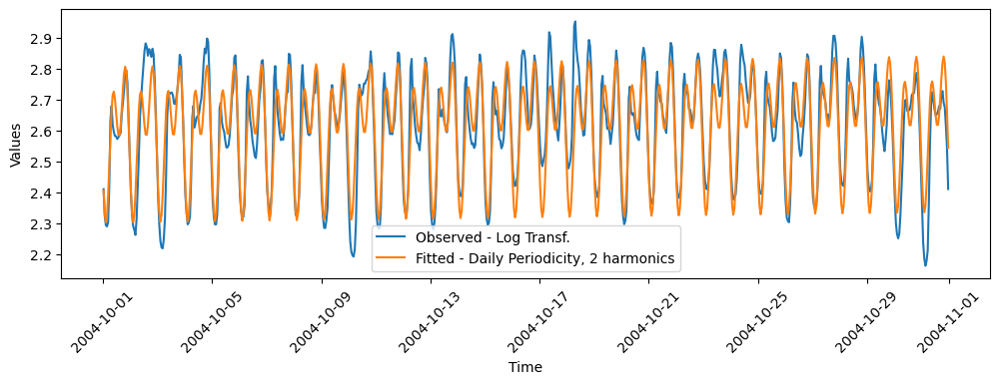

In [96]:
# LOG TRANSFORMED

# Adding periodicities
periodicity_1 = Fourier(period=24, order=4) # daily cycle i.e. 24 hours, 4 harmonics

# Defining the sine wave
dp = DeterministicProcess(
    index=harmonic_df_oct04.index,
    period=None,         # It's not defined so that frequency can be read from the index
    constant=False,      # Let regression model define this intercept later on
    order=1,             # allows trend to be included so that the level of the wave is allowed to change with time, linearly 
    seasonal=False,      # no seasonal dummies
    additional_terms=[periodicity_1], # 4 seperate waves will be generated
    drop=True            # if perfect collinearity exists, the terms can be dropped
)

waves = dp.in_sample()

# Fitting regression model - log transformed
model_1 = LinearRegression() 
model_1.fit(waves[['trend', 'sin(1,24)', 'cos(1,24)', 'sin(2,24)', 'cos(2,24)']], np.log(harmonic_df_oct04['load_rs'])) # Only using first 2 harmonics

# Fitted values
fitted_1 = model_1.predict(waves[['trend', 'sin(1,24)',	'cos(1,24)', 'sin(2,24)', 'cos(2,24)']])

# Regression fit score
print(model_1.score(waves[['trend', 'sin(1,24)','cos(1,24)', 'sin(2,24)', 'cos(2,24)']], np.log(harmonic_df_oct04['load_rs']))) # r2 score

# Observed versus fitted values plot
fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(harmonic_df_oct04.index, np.array(np.log(harmonic_df_oct04.load_rs)).reshape(-1, 1), label="Observed - Log Transf.")
ax.plot(harmonic_df_oct04.index, fitted_1, label="Fitted - Daily Periodicity, 2 harmonics")
ax.set_xlabel("Time")
ax.set_ylabel("Values")
ax.legend()
plt.xticks(rotation=45)
plt.show()

0.7816190218511713


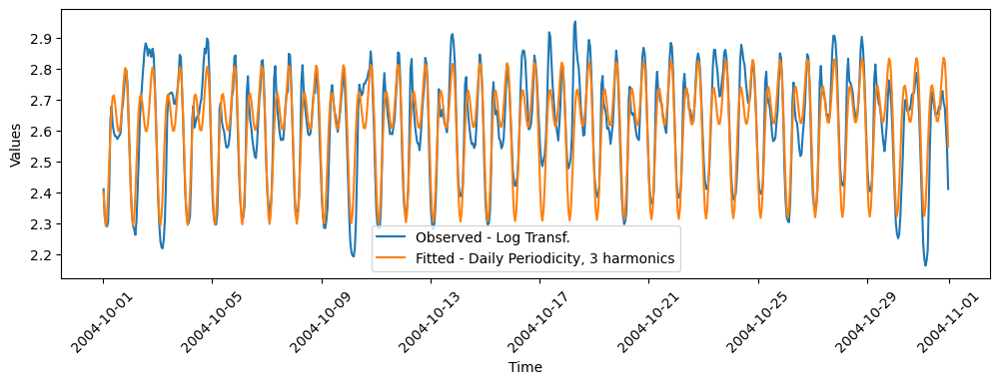

In [97]:
# Fitting regression model - log transformed
model_2 = LinearRegression() 
model_2.fit(waves[['trend', 'sin(1,24)', 'cos(1,24)', 'sin(2,24)', 'cos(2,24)', 'sin(3,24)', 'cos(3,24)']], np.log(harmonic_df_oct04['load_rs'])) # Only using first 3 harmonics

# Fitted values
fitted_2 = model_2.predict(waves[['trend', 'sin(1,24)',	'cos(1,24)', 'sin(2,24)', 'cos(2,24)', 'sin(3,24)', 'cos(3,24)']])

# Regression fit score
print(model_2.score(waves[['trend', 'sin(1,24)','cos(1,24)', 'sin(2,24)', 'cos(2,24)', 'sin(3,24)', 'cos(3,24)']], np.log(harmonic_df_oct04['load_rs']))) # r2 score

# Observed versus fitted values plot
fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(harmonic_df_oct04.index, np.array(np.log(harmonic_df_oct04.load_rs)).reshape(-1, 1), label="Observed - Log Transf.")
ax.plot(harmonic_df_oct04.index, fitted_2, label="Fitted - Daily Periodicity, 3 harmonics")
ax.set_xlabel("Time")
ax.set_ylabel("Values")
ax.legend()
plt.xticks(rotation=45)
plt.show()

Performance increase with 3 harmonics is slight. Try with 4 harmonics.

0.789483478134656


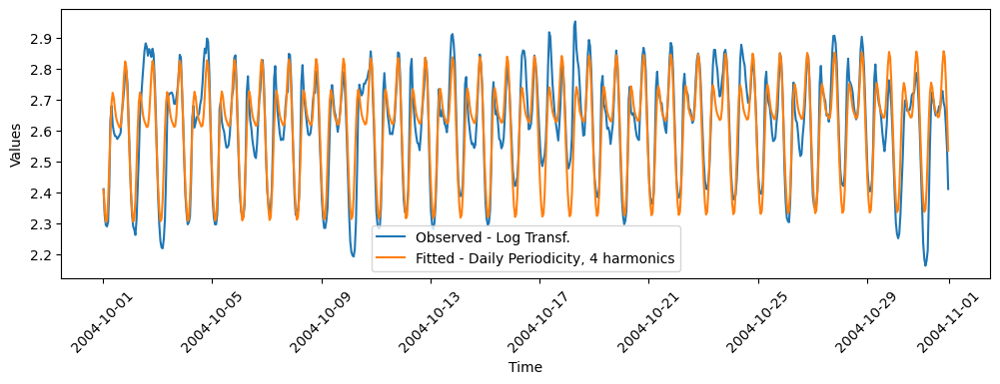

In [98]:
# Fitting regression model - log transformed
model_3 = LinearRegression() 
model_3.fit(waves, np.log(harmonic_df_oct04['load_rs'])) # 4 harmonics

# Fitted values
fitted_3 = model_3.predict(waves)

# Regression fit score
print(model_3.score(waves, np.log(harmonic_df_oct04['load_rs']))) # r2 score

# Observed versus fitted values plot
fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(harmonic_df_oct04.index, np.array(np.log(harmonic_df_oct04.load_rs)).reshape(-1, 1), label="Observed - Log Transf.")
ax.plot(harmonic_df_oct04.index, fitted_3, label="Fitted - Daily Periodicity, 4 harmonics")
ax.set_xlabel("Time")
ax.set_ylabel("Values")
ax.legend()
plt.xticks(rotation=45)
plt.show()

Again, we see there to be not so much increase in performance. 2 harmonics are sufficient (while also avoiding overfitting).

#### Training

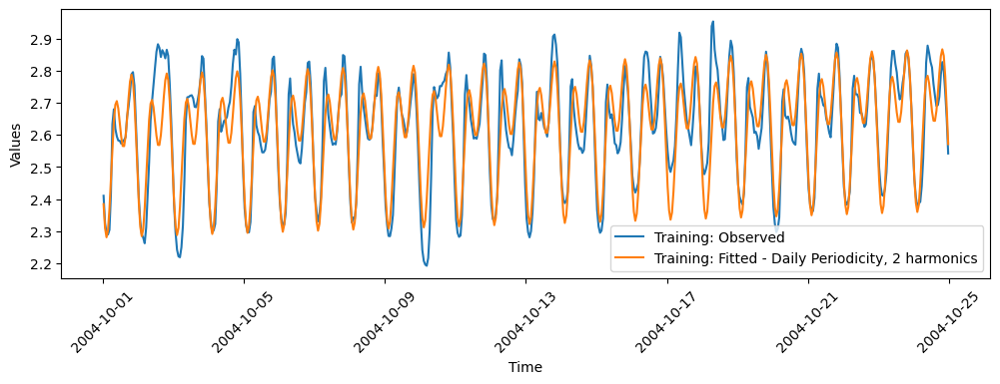

In [99]:
# daily periodicity and 2 harmonics
harmonic_df_oct04["log_load_rs"] = np.log(harmonic_df_oct04.load_rs)

# defining training data
harmonic_df_oct04_train = harmonic_df_oct04.loc[(harmonic_df_oct04.index < "2004-10-25") & (harmonic_df_oct04.index >= "2004-10-01 00:30:00"), :]

# Defining the sine wave
dp = DeterministicProcess(
    index=harmonic_df_oct04_train.index,
    period=None,         # It's not defined so that frequency can be read from the index
    constant=False,      # Let regression model define this intercept later on
    order=1,             # allows trend to be included so that the level of the wave is allowed to change with time, linearly 
    seasonal=False,      # no seasonal dummies
    additional_terms=[periodicity], # 2 seperate waves will be generated
    drop=True            # if perfect collinearity exists, the terms can be dropped
)

waves = dp.in_sample()

# Regression with 2 harmonics
model_oct04_train = LinearRegression() 
X_train = waves[['trend','sin(1,24)','cos(1,24)', 'sin(2,24)', 'cos(2,24)']]
y_train = harmonic_df_oct04_train.log_load_rs
model_oct04_train.fit(X_train, y_train) # 2 harmonics

# Fitted values - training data
fitted_oct04_train = model_oct04_train.predict(X_train)

# Observed versus fitted values plot
fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(harmonic_df_oct04_train.index, y_train, label="Training: Observed")
ax.plot(harmonic_df_oct04_train.index, fitted_oct04_train, label="Training: Fitted - Daily Periodicity, 2 harmonics")
ax.set_xlabel("Time")
ax.set_ylabel("Values")
ax.legend()
plt.xticks(rotation=45)
plt.show()

In [100]:
# Performance on training set
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error, mean_absolute_error

print(f"R2 score: {r2_score(y_train, fitted_oct04_train)}")
print(f'MSE score: {mean_squared_error(y_train, fitted_oct04_train)}')
print(f'MAE score: {mean_absolute_error(y_train, fitted_oct04_train)}')
print(f'MAPE score: {mean_absolute_percentage_error(y_train, fitted_oct04_train)}')

R2 score: 0.7957826406833863
MSE score: 0.005966098267741104
MAE score: 0.057257239856065664
MAPE score: 0.021861452964404903


#### Testing

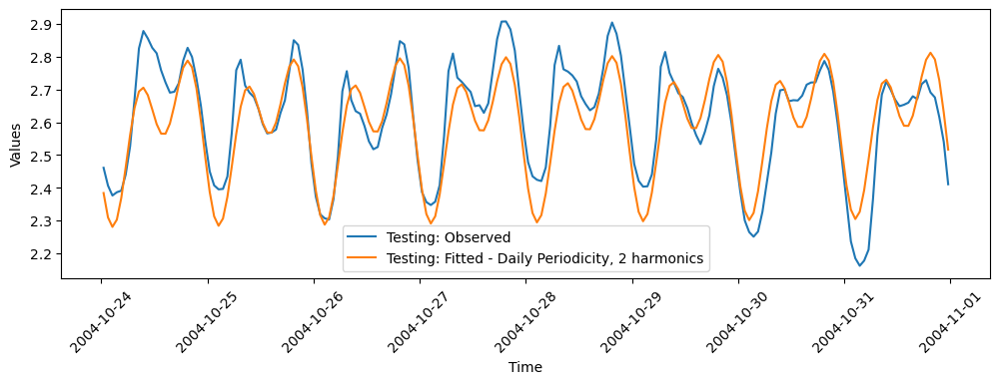

In [101]:
# defining test data
harmonic_df_oct04_test = harmonic_df_oct04.loc[(harmonic_df_oct04.index > "2004-10-24") & (harmonic_df_oct04.index < "2004-11-01 00:30:00"), :]

# Defining the sine wave
dp = DeterministicProcess(
    index=harmonic_df_oct04_test.index,
    period=None,         # It's not defined so that frequency can be read from the index
    constant=False,      # Let regression model define this intercept later on
    order=1,             # allows trend to be included so that the level of the wave is allowed to change with time, linearly 
    seasonal=False,      # no seasonal dummies
    additional_terms=[periodicity], # 2 seperate waves will be generated
    drop=True            # if perfect collinearity exists, the terms can be dropped
)

waves = dp.in_sample()

# Regression with 2 harmonics
model_oct04_test = LinearRegression() 
X_test = waves[['trend','sin(1,24)','cos(1,24)', 'sin(2,24)', 'cos(2,24)']]
y_test = harmonic_df_oct04_test.log_load_rs

# Fitted values - test data
fitted_oct04_test = model_oct04_train.predict(X_test)

# Observed versus fitted values plot
fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(harmonic_df_oct04_test.index, y_test, label="Testing: Observed")
ax.plot(harmonic_df_oct04_test.index, fitted_oct04_test, label="Testing: Fitted - Daily Periodicity, 2 harmonics")
ax.set_xlabel("Time")
ax.set_ylabel("Values")
ax.legend()
plt.xticks(rotation=45)
plt.show()

In [102]:
# Performance on test set
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error, mean_absolute_error

print(f"R2 score: {r2_score(y_test, fitted_oct04_test)}")
print(f'MSE score: {mean_squared_error(y_test, fitted_oct04_test)}')
print(f'MAE score: {mean_absolute_error(y_test, fitted_oct04_test)}')
print(f'MAPE score: {mean_absolute_percentage_error(y_test, fitted_oct04_test)}')

R2 score: 0.7343557877634914
MSE score: 0.007558610360820345
MAE score: 0.06854972735982427
MAPE score: 0.02641679549474173


### Defining Harmonic For Dec 2004, Zone 1

#### Identifying Periodicity and Number of Harmonics

In [103]:
# generating a new dataframe - Zone 1 (Dec 2004)
harmonic_df_dec04 = load_long_z1.loc[(load_long_z1.year == 2004) & (load_long_z1.month == 12),['timestamp','month','day','hour','load_rs']]
harmonic_df_dec04["t"] = range(1,len(harmonic_df_dec04)+1)
harmonic_df_dec04 = harmonic_df_dec04.set_index("timestamp")
harmonic_df_dec04.head()

,month,day,hour,load_rs,t
timestamp,,,,,
2004-12-01 00:30:00,12,1,00:30,14.165,1
2004-12-01 01:30:00,12,1,01:30,13.592,2
2004-12-01 02:30:00,12,1,02:30,13.576,3
2004-12-01 03:30:00,12,1,03:30,13.697,4
2004-12-01 04:30:00,12,1,04:30,14.099,5


0.37579384923584014


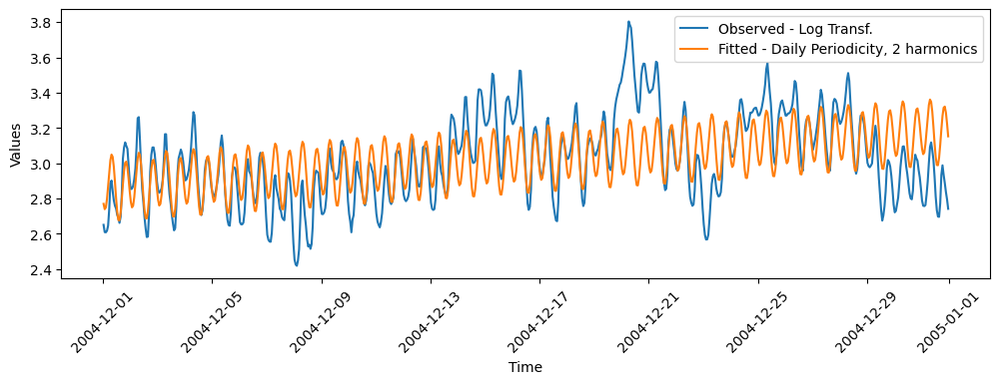

In [104]:
# LOG TRANSFORMED

# Adding periodicities
periodicity_1 = Fourier(period=24, order=4) # daily cycle i.e. 24 hours, 4 harmonics

# Defining the sine wave
dp = DeterministicProcess(
    index=harmonic_df_dec04.index,
    period=None,         # It's not defined so that frequency can be read from the index
    constant=False,      # Let regression model define this intercept later on
    order=1,             # allows trend to be included so that the level of the wave is allowed to change with time, linearly 
    seasonal=False,      # no seasonal dummies
    additional_terms=[periodicity_1], # 4 seperate waves will be generated
    drop=True            # if perfect collinearity exists, the terms can be dropped
)

waves = dp.in_sample()

# Fitting regression model - log transformed
model_1 = LinearRegression() 
model_1.fit(waves[['trend', 'sin(1,24)', 'cos(1,24)', 'sin(2,24)', 'cos(2,24)']], np.log(harmonic_df_dec04['load_rs'])) # Only using first 2 harmonics

# Fitted values
fitted_1 = model_1.predict(waves[['trend', 'sin(1,24)',	'cos(1,24)', 'sin(2,24)', 'cos(2,24)']])

# Regression fit score
print(model_1.score(waves[['trend', 'sin(1,24)','cos(1,24)', 'sin(2,24)', 'cos(2,24)']], np.log(harmonic_df_dec04['load_rs']))) # r2 score

# Observed versus fitted values plot
fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(harmonic_df_dec04.index, np.array(np.log(harmonic_df_dec04.load_rs)).reshape(-1, 1), label="Observed - Log Transf.")
ax.plot(harmonic_df_dec04.index, fitted_1, label="Fitted - Daily Periodicity, 2 harmonics")
ax.set_xlabel("Time")
ax.set_ylabel("Values")
ax.legend()
plt.xticks(rotation=45)
plt.show()

Similar to January, we see that here there are greater fluctuations in use!
<br> Can more harmonics improve explanatory power? 

0.3777210453760972


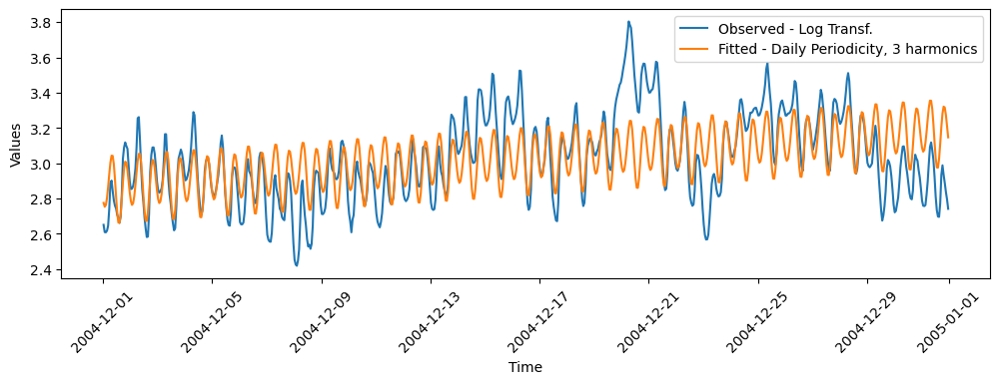

In [105]:
# Fitting regression model - log transformed
model_2 = LinearRegression() 
model_2.fit(waves[['trend', 'sin(1,24)', 'cos(1,24)', 'sin(2,24)', 'cos(2,24)', 'sin(3,24)', 'cos(3,24)']], np.log(harmonic_df_dec04['load_rs'])) # Only using first 3 harmonics

# Fitted values
fitted_2 = model_2.predict(waves[['trend', 'sin(1,24)',	'cos(1,24)', 'sin(2,24)', 'cos(2,24)', 'sin(3,24)', 'cos(3,24)']])

# Regression fit score
print(model_2.score(waves[['trend', 'sin(1,24)','cos(1,24)', 'sin(2,24)', 'cos(2,24)', 'sin(3,24)', 'cos(3,24)']], np.log(harmonic_df_dec04['load_rs']))) # r2 score

# Observed versus fitted values plot
fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(harmonic_df_dec04.index, np.array(np.log(harmonic_df_dec04.load_rs)).reshape(-1, 1), label="Observed - Log Transf.")
ax.plot(harmonic_df_dec04.index, fitted_2, label="Fitted - Daily Periodicity, 3 harmonics")
ax.set_xlabel("Time")
ax.set_ylabel("Values")
ax.legend()
plt.xticks(rotation=45)
plt.show()

Performance didn't improve, as expected! Trying 4 harmonics to verify.

0.38093256275845366


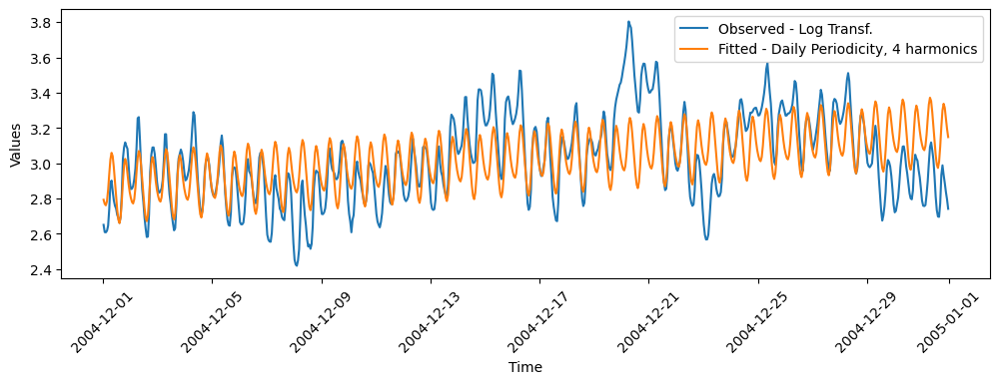

In [106]:
# Fitting regression model - log transformed
model_3 = LinearRegression() 
model_3.fit(waves, np.log(harmonic_df_dec04['load_rs'])) # 4 harmonics

# Fitted values
fitted_3 = model_3.predict(waves)

# Regression fit score
print(model_3.score(waves, np.log(harmonic_df_dec04['load_rs']))) # r2 score

# Observed versus fitted values plot
fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(harmonic_df_dec04.index, np.array(np.log(harmonic_df_dec04.load_rs)).reshape(-1, 1), label="Observed - Log Transf.")
ax.plot(harmonic_df_dec04.index, fitted_3, label="Fitted - Daily Periodicity, 4 harmonics")
ax.set_xlabel("Time")
ax.set_ylabel("Values")
ax.legend()
plt.xticks(rotation=45)
plt.show()

Performance didn't increase by much. 2 harmonics suffice.

##### Conclusion
In certain portion of the year (particularly associated with warmer temperatures), load is closely following a sinusoidal pattern. This means that periodicity is consistent and load usage is more structured. In portion of the year which is more associated with winter months, the consistency of periodicity appears to break down due to higher variation.

#### Training

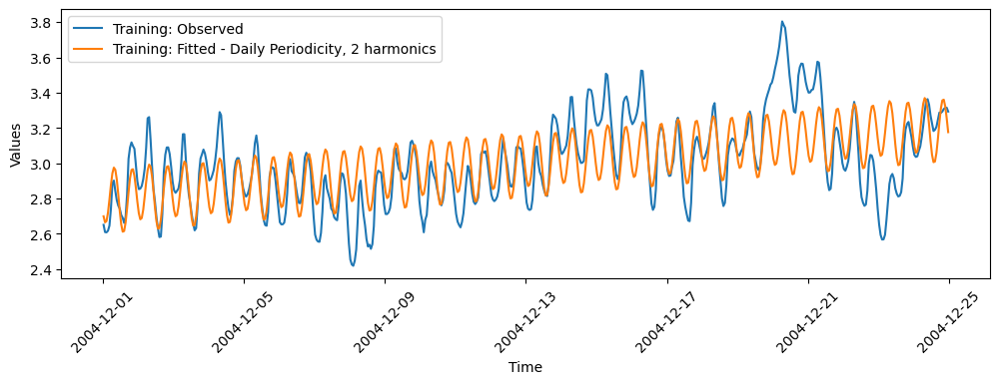

In [107]:
# daily periodicity and 2 harmonics
harmonic_df_dec04["log_load_rs"] = np.log(harmonic_df_dec04.load_rs)

# defining training data
harmonic_df_dec04_train = harmonic_df_dec04.loc[(harmonic_df_dec04.index < "2004-12-25") & (harmonic_df_dec04.index >= "2004-12-01 00:30:00"), :]

# Defining the sine wave
dp = DeterministicProcess(
    index=harmonic_df_dec04_train.index,
    period=None,         # It's not defined so that frequency can be read from the index
    constant=False,      # Let regression model define this intercept later on
    order=1,             # allows trend to be included so that the level of the wave is allowed to change with time, linearly 
    seasonal=False,      # no seasonal dummies
    additional_terms=[periodicity], # 2 seperate waves will be generated
    drop=True            # if perfect collinearity exists, the terms can be dropped
)

waves = dp.in_sample()

# Regression with 2 harmonics
model_dec04_train = LinearRegression() 
X_train = waves[['trend','sin(1,24)','cos(1,24)', 'sin(2,24)', 'cos(2,24)']]
y_train = harmonic_df_dec04_train.log_load_rs
model_dec04_train.fit(X_train, y_train) # 2 harmonics

# Fitted values - training data
fitted_dec04_train = model_dec04_train.predict(X_train)

# Observed versus fitted values plot
fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(harmonic_df_dec04_train.index, y_train, label="Training: Observed")
ax.plot(harmonic_df_dec04_train.index, fitted_dec04_train, label="Training: Fitted - Daily Periodicity, 2 harmonics")
ax.set_xlabel("Time")
ax.set_ylabel("Values")
ax.legend()
plt.xticks(rotation=45)
plt.show()

In [108]:
# Performance on training set
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error, mean_absolute_error

print(f"R2 score: {r2_score(y_train, fitted_dec04_train)}")
print(f'MSE score: {mean_squared_error(y_train, fitted_dec04_train)}')
print(f'MAE score: {mean_absolute_error(y_train, fitted_dec04_train)}')
print(f'MAPE score: {mean_absolute_percentage_error(y_train, fitted_dec04_train)}')

R2 score: 0.46477167738425074
MSE score: 0.03310733859436627
MAE score: 0.13972725570222433
MAPE score: 0.04642139583518737


#### Testing

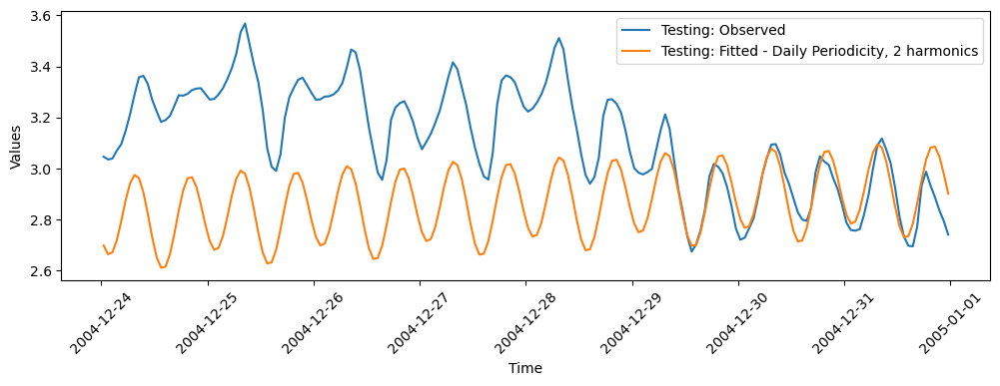

In [109]:
# defining test data
harmonic_df_dec04_test = harmonic_df_dec04.loc[(harmonic_df_dec04.index > "2004-12-24") & (harmonic_df_dec04.index < "2005-01-01 00:30:00"), :]

# Defining the sine wave
dp = DeterministicProcess(
    index=harmonic_df_dec04_test.index,
    period=None,         # It's not defined so that frequency can be read from the index
    constant=False,      # Let regression model define this intercept later on
    order=1,             # allows trend to be included so that the level of the wave is allowed to change with time, linearly 
    seasonal=False,      # no seasonal dummies
    additional_terms=[periodicity], # 2 seperate waves will be generated
    drop=True            # if perfect collinearity exists, the terms can be dropped
)

waves = dp.in_sample()

# Regression with 2 harmonics
model_dec04_test = LinearRegression() 
X_test = waves[['trend','sin(1,24)','cos(1,24)', 'sin(2,24)', 'cos(2,24)']]
y_test = harmonic_df_dec04_test.log_load_rs

# Fitted values - test data
fitted_dec04_test = model_dec04_train.predict(X_test)

# Observed versus fitted values plot
fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(harmonic_df_dec04_test.index, y_test, label="Testing: Observed")
ax.plot(harmonic_df_dec04_test.index, fitted_dec04_test, label="Testing: Fitted - Daily Periodicity, 2 harmonics")
ax.set_xlabel("Time")
ax.set_ylabel("Values")
ax.legend()
plt.xticks(rotation=45)
plt.show()

In [110]:
# Performance on test set
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error, mean_absolute_error

print(f"R2 score: {r2_score(y_test, fitted_dec04_test)}")
print(f'MSE score: {mean_squared_error(y_test, fitted_dec04_test)}')
print(f'MAE score: {mean_absolute_error(y_test, fitted_dec04_test)}')
print(f'MAPE score: {mean_absolute_percentage_error(y_test, fitted_dec04_test)}')

R2 score: -1.5126986196831056
MSE score: 0.1106560278881603
MAE score: 0.2767863923654101
MAPE score: 0.08600001890911257


## Combining Temperature with Fourier Terms
This section is meant to do Multivariate Regression, using holidays, harmonics and temperature information as explanatory variables.
<br>
The model is tested throughout different portions of 2004, as done previously in this notebook.
<br>
<i>(Log transformation for both load and temperature is used.)</i>

In [111]:
# Creating multiple series objects
timestamp_series = temperature["timestamp"]
temp_weighted_series = temperature["temp_weighted"]
load_long_z1_series = load_long_z1["load_rs"]
print(len(timestamp_series), len(temp_weighted_series), len(load_long_z1_series))

39414 39414 39414


In [112]:
# Generating a combined DataFrame
series_list = [timestamp_series,temp_weighted_series,load_long_z1_series]
mul_reg_df = pd.concat(series_list, axis=1)
mul_reg_df.head()

,timestamp,temp_weighted,load_rs
0,2004-01-01 00:30:00,42.338937,16.853
1,2004-01-01 01:30:00,41.239284,16.450
2,2004-01-01 02:30:00,39.591442,16.517
3,2004-01-01 03:30:00,36.243296,16.873
4,2004-01-01 04:30:00,34.600850,17.064


In [113]:
# Log Transformation on load
mul_reg_df["log_load_rs"] = np.log(mul_reg_df.load_rs)
mul_reg_df["temp_pc1"] = mul_reg_df.temp_weighted
mul_reg_df = mul_reg_df.loc[:,["timestamp","temp_pc1","log_load_rs"]]
mul_reg_df.head()

,timestamp,temp_pc1,log_load_rs
0,2004-01-01 00:30:00,42.338937,2.824529
1,2004-01-01 01:30:00,41.239284,2.800325
2,2004-01-01 02:30:00,39.591442,2.804390
3,2004-01-01 03:30:00,36.243296,2.825715
4,2004-01-01 04:30:00,34.600850,2.836971


### Adding holiday information

In [114]:
# Importing holiday dataframe
holiday_df = pd.read_csv(r"C:\Users\singh\Desktop\TUD (All Semesters)\Courses - Semester 6 (TU Dresden)\Thesis Work\Dataset\GEFCom2012\GEFCOM2012_Data\Load\Holiday_List.csv")
holiday_df.head()

,Unnamed: 0,2004,2005,2006,2007,2008
0,New Year's Day,"Thursday, January 1","Friday, December 31, 2004","Monday, January 2","Monday, January 1","Tuesday, January 1"
1,"Birthday of Martin Luther King, Jr.","Monday, January 19","Monday, January 17","Monday, January 16","Monday, January 15","Monday, January 21"
2,Washington's Birthday,"Monday, February 16","Monday, February 21","Monday, February 20","Monday, February 19","Monday, February 18"
3,Memorial Day,"Monday, May 31","Monday, May 30","Monday, May 29","Monday, May 28","Monday, May 26"
4,Independence Day,"Monday, July 5","Monday, July 4","Tuesday, July 4","Wednesday, July 4","Friday, July 4"


In [115]:
# Dimensions
print(holiday_df.shape)

(10, 6)


In [116]:
# Adding holiday column
mul_reg_df["holiday"] = 0
mul_reg_df.head()

,timestamp,temp_pc1,log_load_rs,holiday
0,2004-01-01 00:30:00,42.338937,2.824529,0
1,2004-01-01 01:30:00,41.239284,2.800325,0
2,2004-01-01 02:30:00,39.591442,2.804390,0
3,2004-01-01 03:30:00,36.243296,2.825715,0
4,2004-01-01 04:30:00,34.600850,2.836971,0


In [117]:
# Holidays in 2004
holiday_df["2004"]

0      Thursday, January 1
1       Monday, January 19
2      Monday, February 16
3           Monday, May 31
4           Monday, July 5
5      Monday, September 6
6       Monday, October 11
7    Thursday, November 11
8    Thursday, November 25
9      Friday, December 24
Name: 2004, dtype: object

In [118]:
# Making changes for 2004
mul_reg_df.loc[mul_reg_df.timestamp <= "2004-01-01 23:30:00","holiday"] = 1
mul_reg_df.loc[(mul_reg_df.timestamp <= "2004-01-19 23:30:00") & (mul_reg_df.timestamp >= "2004-01-19 00:30:00"),"holiday"] = 1
mul_reg_df.loc[(mul_reg_df.timestamp <= "2004-02-16 23:30:00") & (mul_reg_df.timestamp >= "2004-02-16 00:30:00"),"holiday"] = 1
mul_reg_df.loc[(mul_reg_df.timestamp <= "2004-05-31 23:30:00") & (mul_reg_df.timestamp >= "2004-05-31 00:30:00"),"holiday"] = 1
mul_reg_df.loc[(mul_reg_df.timestamp <= "2004-07-05 23:30:00") & (mul_reg_df.timestamp >= "2004-07-05 00:30:00"),"holiday"] = 1
mul_reg_df.loc[(mul_reg_df.timestamp <= "2004-09-06 23:30:00") & (mul_reg_df.timestamp >= "2004-09-06 00:30:00"),"holiday"] = 1
mul_reg_df.loc[(mul_reg_df.timestamp <= "2004-10-11 23:30:00") & (mul_reg_df.timestamp >= "2004-10-11 00:30:00"),"holiday"] = 1
mul_reg_df.loc[(mul_reg_df.timestamp <= "2004-11-11 23:30:00") & (mul_reg_df.timestamp >= "2004-11-11 00:30:00"),"holiday"] = 1
mul_reg_df.loc[(mul_reg_df.timestamp <= "2004-11-25 23:30:00") & (mul_reg_df.timestamp >= "2004-11-25 00:30:00"),"holiday"] = 1
mul_reg_df.loc[(mul_reg_df.timestamp <= "2004-12-24 23:30:00") & (mul_reg_df.timestamp >= "2004-12-24 00:30:00"),"holiday"] = 1
mul_reg_df.head()

,timestamp,temp_pc1,log_load_rs,holiday
0,2004-01-01 00:30:00,42.338937,2.824529,1
1,2004-01-01 01:30:00,41.239284,2.800325,1
2,2004-01-01 02:30:00,39.591442,2.804390,1
3,2004-01-01 03:30:00,36.243296,2.825715,1
4,2004-01-01 04:30:00,34.600850,2.836971,1


In [119]:
# Holidays in 2005
holiday_df["2005"]

0    Friday, December 31, 2004
1           Monday, January 17
2          Monday, February 21
3               Monday, May 30
4               Monday, July 4
5          Monday, September 5
6           Monday, October 10
7          Friday, November 11
8        Thursday, November 24
9          Monday, December 26
Name: 2005, dtype: object

In [120]:
# Making changes for 2005
mul_reg_df.loc[(mul_reg_df.timestamp <= "2004-12-31 23:30:00") & (mul_reg_df.timestamp >= "2004-12-31 00:30:00"),"holiday"] = 1

mul_reg_df.loc[(mul_reg_df.timestamp <= "2005-01-17 23:30:00") & (mul_reg_df.timestamp >= "2005-01-17 00:30:00"),"holiday"] = 1
mul_reg_df.loc[(mul_reg_df.timestamp <= "2005-02-21 23:30:00") & (mul_reg_df.timestamp >= "2005-02-21 00:30:00"),"holiday"] = 1
mul_reg_df.loc[(mul_reg_df.timestamp <= "2005-05-30 23:30:00") & (mul_reg_df.timestamp >= "2005-05-30 00:30:00"),"holiday"] = 1
mul_reg_df.loc[(mul_reg_df.timestamp <= "2005-07-04 23:30:00") & (mul_reg_df.timestamp >= "2005-07-04 00:30:00"),"holiday"] = 1
mul_reg_df.loc[(mul_reg_df.timestamp <= "2005-09-05 23:30:00") & (mul_reg_df.timestamp >= "2005-09-05 00:30:00"),"holiday"] = 1
mul_reg_df.loc[(mul_reg_df.timestamp <= "2005-10-10 23:30:00") & (mul_reg_df.timestamp >= "2005-10-10 00:30:00"),"holiday"] = 1
mul_reg_df.loc[(mul_reg_df.timestamp <= "2005-11-11 23:30:00") & (mul_reg_df.timestamp >= "2005-11-11 00:30:00"),"holiday"] = 1
mul_reg_df.loc[(mul_reg_df.timestamp <= "2005-11-24 23:30:00") & (mul_reg_df.timestamp >= "2005-11-24 00:30:00"),"holiday"] = 1
mul_reg_df.loc[(mul_reg_df.timestamp <= "2005-12-26 23:30:00") & (mul_reg_df.timestamp >= "2005-12-26 00:30:00"),"holiday"] = 1
mul_reg_df.head()

,timestamp,temp_pc1,log_load_rs,holiday
0,2004-01-01 00:30:00,42.338937,2.824529,1
1,2004-01-01 01:30:00,41.239284,2.800325,1
2,2004-01-01 02:30:00,39.591442,2.804390,1
3,2004-01-01 03:30:00,36.243296,2.825715,1
4,2004-01-01 04:30:00,34.600850,2.836971,1


In [121]:
# Holidays in 2006
holiday_df["2006"]

0        Monday, January 2
1       Monday, January 16
2      Monday, February 20
3           Monday, May 29
4          Tuesday, July 4
5      Monday, September 4
6        Monday, October 9
7      Friday, November 10
8    Thursday, November 23
9      Monday, December 25
Name: 2006, dtype: object

In [122]:
# Making changes for 2006
mul_reg_df.loc[(mul_reg_df.timestamp <= "2006-01-02 23:30:00") & (mul_reg_df.timestamp >= "2006-01-02 00:30:00"),"holiday"] = 1
mul_reg_df.loc[(mul_reg_df.timestamp <= "2006-01-16 23:30:00") & (mul_reg_df.timestamp >= "2006-01-16 00:30:00"),"holiday"] = 1
mul_reg_df.loc[(mul_reg_df.timestamp <= "2006-02-20 23:30:00") & (mul_reg_df.timestamp >= "2006-02-20 00:30:00"),"holiday"] = 1
mul_reg_df.loc[(mul_reg_df.timestamp <= "2006-05-29 23:30:00") & (mul_reg_df.timestamp >= "2006-05-29 00:30:00"),"holiday"] = 1
mul_reg_df.loc[(mul_reg_df.timestamp <= "2006-07-04 23:30:00") & (mul_reg_df.timestamp >= "2006-07-04 00:30:00"),"holiday"] = 1
mul_reg_df.loc[(mul_reg_df.timestamp <= "2006-09-04 23:30:00") & (mul_reg_df.timestamp >= "2006-09-04 00:30:00"),"holiday"] = 1
mul_reg_df.loc[(mul_reg_df.timestamp <= "2006-10-09 23:30:00") & (mul_reg_df.timestamp >= "2006-10-09 00:30:00"),"holiday"] = 1
mul_reg_df.loc[(mul_reg_df.timestamp <= "2006-11-10 23:30:00") & (mul_reg_df.timestamp >= "2006-11-10 00:30:00"),"holiday"] = 1
mul_reg_df.loc[(mul_reg_df.timestamp <= "2006-11-23 23:30:00") & (mul_reg_df.timestamp >= "2006-11-23 00:30:00"),"holiday"] = 1
mul_reg_df.loc[(mul_reg_df.timestamp <= "2006-12-25 23:30:00") & (mul_reg_df.timestamp >= "2006-12-25 00:30:00"),"holiday"] = 1
mul_reg_df.head()

,timestamp,temp_pc1,log_load_rs,holiday
0,2004-01-01 00:30:00,42.338937,2.824529,1
1,2004-01-01 01:30:00,41.239284,2.800325,1
2,2004-01-01 02:30:00,39.591442,2.804390,1
3,2004-01-01 03:30:00,36.243296,2.825715,1
4,2004-01-01 04:30:00,34.600850,2.836971,1


In [123]:
# Holidays in 2007
holiday_df["2007"]

0        Monday, January 1
1       Monday, January 15
2      Monday, February 19
3           Monday, May 28
4        Wednesday, July 4
5      Monday, September 3
6        Monday, October 8
7      Monday, November 12
8    Thursday, November 22
9     Tuesday, December 25
Name: 2007, dtype: object

In [124]:
# Making changes for 2007
mul_reg_df.loc[(mul_reg_df.timestamp <= "2007-01-01 23:30:00") & (mul_reg_df.timestamp >= "2007-01-01 00:30:00"),"holiday"] = 1
mul_reg_df.loc[(mul_reg_df.timestamp <= "2007-01-15 23:30:00") & (mul_reg_df.timestamp >= "2007-01-15 00:30:00"),"holiday"] = 1
mul_reg_df.loc[(mul_reg_df.timestamp <= "2007-02-19 23:30:00") & (mul_reg_df.timestamp >= "2007-02-19 00:30:00"),"holiday"] = 1
mul_reg_df.loc[(mul_reg_df.timestamp <= "2007-05-28 23:30:00") & (mul_reg_df.timestamp >= "2007-05-28 00:30:00"),"holiday"] = 1
mul_reg_df.loc[(mul_reg_df.timestamp <= "2007-07-04 23:30:00") & (mul_reg_df.timestamp >= "2007-07-04 00:30:00"),"holiday"] = 1
mul_reg_df.loc[(mul_reg_df.timestamp <= "2007-09-03 23:30:00") & (mul_reg_df.timestamp >= "2007-09-03 00:30:00"),"holiday"] = 1
mul_reg_df.loc[(mul_reg_df.timestamp <= "2007-10-08 23:30:00") & (mul_reg_df.timestamp >= "2007-10-08 00:30:00"),"holiday"] = 1
mul_reg_df.loc[(mul_reg_df.timestamp <= "2007-11-12 23:30:00") & (mul_reg_df.timestamp >= "2007-11-12 00:30:00"),"holiday"] = 1
mul_reg_df.loc[(mul_reg_df.timestamp <= "2007-11-22 23:30:00") & (mul_reg_df.timestamp >= "2007-11-22 00:30:00"),"holiday"] = 1
mul_reg_df.loc[(mul_reg_df.timestamp <= "2007-12-25 23:30:00") & (mul_reg_df.timestamp >= "2007-12-25 00:30:00"),"holiday"] = 1
mul_reg_df.head()

,timestamp,temp_pc1,log_load_rs,holiday
0,2004-01-01 00:30:00,42.338937,2.824529,1
1,2004-01-01 01:30:00,41.239284,2.800325,1
2,2004-01-01 02:30:00,39.591442,2.804390,1
3,2004-01-01 03:30:00,36.243296,2.825715,1
4,2004-01-01 04:30:00,34.600850,2.836971,1


In [125]:
# Holidays in 2008
holiday_df["2008"]

0     Tuesday, January 1
1     Monday, January 21
2    Monday, February 18
3         Monday, May 26
4         Friday, July 4
5                    NaN
6                    NaN
7                    NaN
8                    NaN
9                    NaN
Name: 2008, dtype: object

In [126]:
# Making changes for 2008
mul_reg_df.loc[(mul_reg_df.timestamp <= "2008-01-01 23:30:00") & (mul_reg_df.timestamp >= "2008-01-01 00:30:00"),"holiday"] = 1
mul_reg_df.loc[(mul_reg_df.timestamp <= "2008-01-21 23:30:00") & (mul_reg_df.timestamp >= "2008-01-21 00:30:00"),"holiday"] = 1
mul_reg_df.loc[(mul_reg_df.timestamp <= "2008-02-18 23:30:00") & (mul_reg_df.timestamp >= "2008-02-18 00:30:00"),"holiday"] = 1
mul_reg_df.loc[(mul_reg_df.timestamp <= "2008-05-26 23:30:00") & (mul_reg_df.timestamp >= "2008-05-26 00:30:00"),"holiday"] = 1
mul_reg_df.loc[(mul_reg_df.timestamp <= "2008-07-04 23:30:00") & (mul_reg_df.timestamp >= "2008-07-04 00:30:00"),"holiday"] = 1
mul_reg_df.head()

,timestamp,temp_pc1,log_load_rs,holiday
0,2004-01-01 00:30:00,42.338937,2.824529,1
1,2004-01-01 01:30:00,41.239284,2.800325,1
2,2004-01-01 02:30:00,39.591442,2.804390,1
3,2004-01-01 03:30:00,36.243296,2.825715,1
4,2004-01-01 04:30:00,34.600850,2.836971,1


In [127]:
# What's the latest date saved?
np.max(mul_reg_df.timestamp)

Timestamp('2008-06-30 05:30:00')

<b><i> The last holiday i.e. 4th July 2008 hasn't been updated due to limited inclusion of timestamp</i></b>

### Multivariate Regression
Performing regression, using all three explanatory variables.

#### Multivariate Regression for January 2004, Zone 1

In [128]:
# Dataframe for Jan 2004, Zone 1
mul_reg_df_jan04 = mul_reg_df.loc[(mul_reg_df.timestamp >= "2004-01-01 00:30:00") & (mul_reg_df.timestamp < "2004-02-01 00:30:00"), ["timestamp", "temp_pc1", "log_load_rs", "holiday"]]
mul_reg_df_jan04.head()

,timestamp,temp_pc1,log_load_rs,holiday
0,2004-01-01 00:30:00,42.338937,2.824529,1
1,2004-01-01 01:30:00,41.239284,2.800325,1
2,2004-01-01 02:30:00,39.591442,2.804390,1
3,2004-01-01 03:30:00,36.243296,2.825715,1
4,2004-01-01 04:30:00,34.600850,2.836971,1


##### Training

In [129]:
# Defining train and test sets
mul_reg_df_jan04_train = mul_reg_df_jan04.loc[(mul_reg_df_jan04.timestamp >= "2004-01-01 00:30:00") & (mul_reg_df_jan04.timestamp < "2004-01-25 00:30:00"), ["timestamp", "temp_pc1", "log_load_rs", "holiday"]]
mul_reg_df_jan04_test = mul_reg_df_jan04.loc[(mul_reg_df_jan04.timestamp >= "2004-01-25 00:30:00") & (mul_reg_df_jan04.timestamp < "2004-02-01 00:30:00"), ["timestamp", "temp_pc1", "log_load_rs", "holiday"]]

In [130]:
# FEATURE SET: Training

# Adding periodicities
periodicity = Fourier(period=24, order=2) # daily cycle i.e. 24 hours, 2 harmonics

# Defining the sine wave
dp = DeterministicProcess(
    index=mul_reg_df_jan04_train.timestamp,
    period=None,         # It's not defined so that frequency can be read from the index
    constant=False,      # Let regression model define this intercept later on
    order=1,             # allows trend to be included so that the level of the wave is allowed to change with time, linearly 
    seasonal=False,      # no seasonal dummies
    additional_terms=[periodicity], # 2 seperate waves will be generated
    drop=True            # if perfect collinearity exists, the terms can be dropped
)

waves = dp.in_sample()

# Adding fourier terms
mul_reg_df_jan04_train = pd.merge(mul_reg_df_jan04_train, waves, on='timestamp', how='inner')
mul_reg_df_jan04_train.head()

,timestamp,temp_pc1,log_load_rs,holiday,trend,"sin(1,24)","cos(1,24)","sin(2,24)","cos(2,24)"
0,2004-01-01 00:30:00,42.338937,2.824529,1,1.0,0.000000,1.000000,0.000000,1.000000e+00
1,2004-01-01 01:30:00,41.239284,2.800325,1,2.0,0.258819,0.965926,0.500000,8.660254e-01
2,2004-01-01 02:30:00,39.591442,2.804390,1,3.0,0.500000,0.866025,0.866025,5.000000e-01
3,2004-01-01 03:30:00,36.243296,2.825715,1,4.0,0.707107,0.707107,1.000000,6.123234e-17
4,2004-01-01 04:30:00,34.600850,2.836971,1,5.0,0.866025,0.500000,0.866025,-5.000000e-01


In [131]:
# Specifying explanatory and explained variables - training

X_train = mul_reg_df_jan04_train[['temp_pc1', 'holiday', 'trend', 'sin(1,24)', 'cos(1,24)', 'sin(2,24)', 'cos(2,24)']]
y_train = np.array(mul_reg_df_jan04_train.log_load_rs).reshape(-1, 1)
mul_reg_jan04_train = LinearRegression().fit(X_train, y_train)
fitted_jan04_train = mul_reg_jan04_train.predict(X_train)

# Regression Performance - training
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error, mean_absolute_error

print(f"R2 score: {r2_score(y_train, fitted_jan04_train)}")
print(f'MSE score: {mean_squared_error(y_train, fitted_jan04_train)}')
print(f'MAE score: {mean_absolute_error(y_train, fitted_jan04_train)}')
print(f'MAPE score: {mean_absolute_percentage_error(y_train, fitted_jan04_train)}')

R2 score: 0.8500656460939982
MSE score: 0.009995981246806965
MAE score: 0.08073038267090696
MAPE score: 0.026932998640935898


R2 score is very strong.

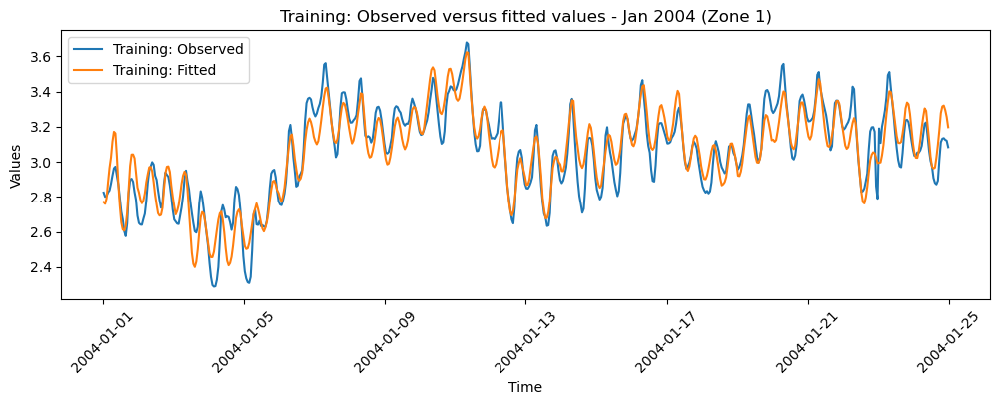

In [132]:
# Observed versus fitted values plot - training

fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(mul_reg_df_jan04_train.timestamp, y_train, label="Training: Observed")
ax.plot(mul_reg_df_jan04_train.timestamp, fitted_jan04_train, label="Training: Fitted")
ax.set_xlabel("Time")
ax.set_ylabel("Values")
ax.legend()
ax.set_title("Training: Observed versus fitted values - Jan 2004 (Zone 1)")
plt.xticks(rotation=45)
plt.show()

A high r2 score of 0.85 came for this period from the temperature data, in addition to harmonics.

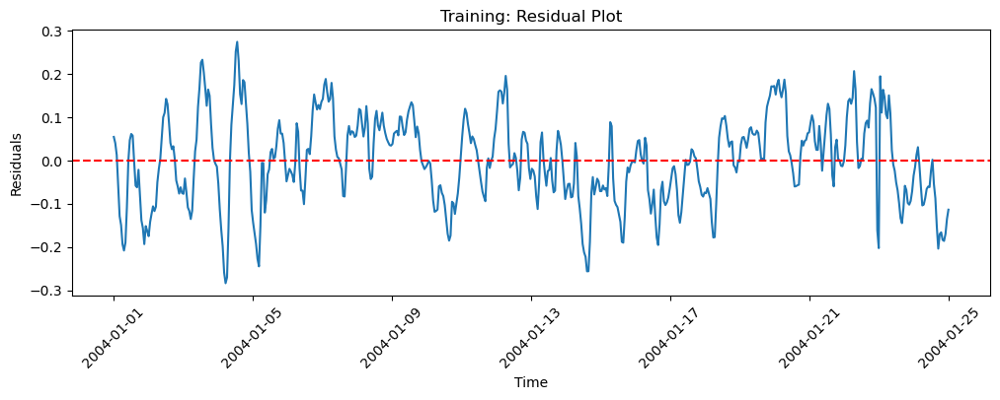

In [133]:
# Residual variance with time - training

fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(mul_reg_df_jan04_train.timestamp, np.array(y_train - fitted_jan04_train).reshape(-1, 1), label="Residuals (Training)")
ax.set_xlabel("Time")
ax.set_ylabel("Residuals")
ax.axhline(np.mean(np.array(y_train - fitted_jan04_train).reshape(-1, 1)), color="red", linestyle="--") # Residual mean
plt.xticks(rotation=45)
ax.set_title("Training: Residual Plot")
plt.show()

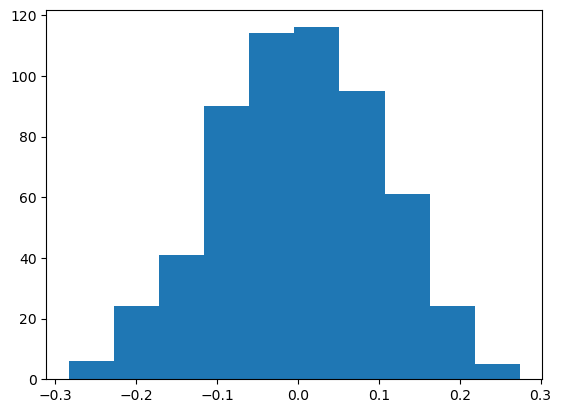

In [134]:
# Distribution of residuals
plt.hist(np.array(y_train - fitted_jan04_train).reshape(-1, 1))
plt.show()

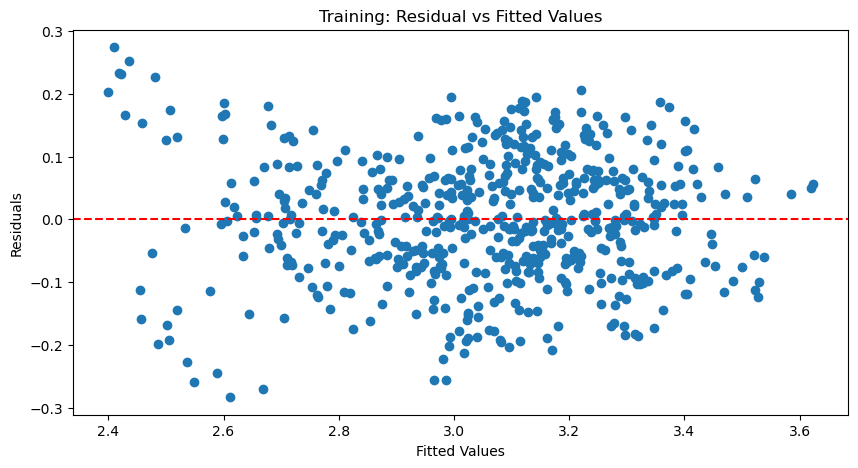

In [135]:
# Residual vs fitted values
fig, ax = plt.subplots(figsize=(10,5))
plt.scatter(np.array(fitted_jan04_train).reshape(-1,1), np.array(y_train - fitted_jan04_train).reshape(-1, 1))
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
ax.axhline(np.mean(np.array(y_train - fitted_jan04_train).reshape(-1, 1)), color="red", linestyle="--") # Residual mean
ax.set_title("Training: Residual vs Fitted Values")
plt.show()

VAriance appears to be slightly higher at the initial fitted values

##### Testing

In [136]:
# FEATURE SET: Testing

# Defining the sine wave
dp = DeterministicProcess(
    index=mul_reg_df_jan04_test.timestamp,
    period=None,         # It's not defined so that frequency can be read from the index
    constant=False,      # Let regression model define this intercept later on
    order=1,             # allows trend to be included so that the level of the wave is allowed to change with time, linearly 
    seasonal=False,      # no seasonal dummies
    additional_terms=[periodicity], # 2 seperate waves will be generated
    drop=True            # if perfect collinearity exists, the terms can be dropped
)

waves = dp.in_sample()

# Adding fourier terms
mul_reg_df_jan04_test = pd.merge(mul_reg_df_jan04_test, waves, on='timestamp', how='inner')
mul_reg_df_jan04_test.head()

,timestamp,temp_pc1,log_load_rs,holiday,trend,"sin(1,24)","cos(1,24)","sin(2,24)","cos(2,24)"
0,2004-01-25 00:30:00,21.155292,3.094174,0,1.0,0.000000,1.000000,0.000000,1.000000e+00
1,2004-01-25 01:30:00,20.058817,3.101713,0,2.0,0.258819,0.965926,0.500000,8.660254e-01
2,2004-01-25 02:30:00,19.051006,3.144626,0,3.0,0.500000,0.866025,0.866025,5.000000e-01
3,2004-01-25 03:30:00,18.246300,3.160441,0,4.0,0.707107,0.707107,1.000000,6.123234e-17
4,2004-01-25 04:30:00,17.700175,3.197407,0,5.0,0.866025,0.500000,0.866025,-5.000000e-01


In [137]:
# Specifying explanatory and explained variables - testing

X_test = mul_reg_df_jan04_test[['temp_pc1', 'holiday', 'trend', 'sin(1,24)', 'cos(1,24)', 'sin(2,24)', 'cos(2,24)']]
y_test = np.array(mul_reg_df_jan04_test.log_load_rs).reshape(-1, 1)
fitted_jan04_test = mul_reg_jan04_train.predict(X_test)

# Regression Performance - testing
print(f"R2 score: {r2_score(y_test, fitted_jan04_test)}")
print(f'MSE score: {mean_squared_error(y_test, fitted_jan04_test)}')
print(f'MAE score: {mean_absolute_error(y_test, fitted_jan04_test)}')
print(f'MAPE score: {mean_absolute_percentage_error(y_test, fitted_jan04_test)}')

R2 score: 0.5394058253423304
MSE score: 0.014067255058485146
MAE score: 0.1036490912065237
MAPE score: 0.031263261907404576


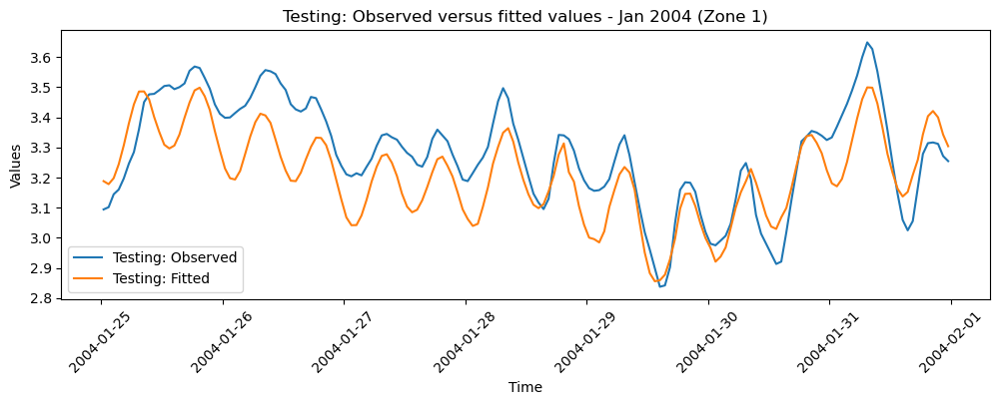

In [138]:
# Observed versus fitted values plot - testing

fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(mul_reg_df_jan04_test.timestamp, y_test, label="Testing: Observed")
ax.plot(mul_reg_df_jan04_test.timestamp, fitted_jan04_test, label="Testing: Fitted")
ax.set_xlabel("Time")
ax.set_ylabel("Values")
ax.legend()
ax.set_title("Testing: Observed versus fitted values - Jan 2004 (Zone 1)")
plt.xticks(rotation=45)
plt.show()

#### Multivariate Regression for April 2004, Zone 1

In [139]:
# Dataframe for Apr 2004, Zone 1
mul_reg_df_apr04 = mul_reg_df.loc[(mul_reg_df.timestamp >= "2004-04-01 00:30:00") & (mul_reg_df.timestamp < "2004-05-01 00:30:00"), ["timestamp", "temp_pc1", "log_load_rs", "holiday"]].reset_index(drop=True).sort_values(by="timestamp")
mul_reg_df_apr04.head()

,timestamp,temp_pc1,log_load_rs,holiday
0,2004-04-01 00:30:00,45.453562,2.645820,0
1,2004-04-01 01:30:00,45.547368,2.633901,0
2,2004-04-01 02:30:00,45.454863,2.633039,0
3,2004-04-01 03:30:00,45.454863,2.646246,0
4,2004-04-01 04:30:00,45.191047,2.688528,0


##### Training

In [140]:
# Defining train and test sets
mul_reg_df_apr04_train = mul_reg_df_apr04.loc[mul_reg_df_apr04.timestamp < "2004-04-24 00:30:00", ["timestamp", "temp_pc1", "log_load_rs", "holiday"]]
mul_reg_df_apr04_test = mul_reg_df_apr04.loc[mul_reg_df_apr04.timestamp > "2004-04-23 23:30:00", ["timestamp", "temp_pc1", "log_load_rs", "holiday"]]

In [141]:
# FEATURE SET: Training

# Defining the sine wave
dp = DeterministicProcess(
    index=mul_reg_df_apr04_train.timestamp,
    period=None,         # It's not defined so that frequency can be read from the index
    constant=False,      # Let regression model define this intercept later on
    order=1,             # allows trend to be included so that the level of the wave is allowed to change with time, linearly 
    seasonal=False,      # no seasonal dummies
    additional_terms=[periodicity], # 2 seperate waves will be generated
    drop=True            # if perfect collinearity exists, the terms can be dropped
)

waves = dp.in_sample()

# Adding fourier terms
mul_reg_df_apr04_train = pd.merge(mul_reg_df_apr04_train, waves, on='timestamp', how='inner')
mul_reg_df_apr04_train.head()

,timestamp,temp_pc1,log_load_rs,holiday,trend,"sin(1,24)","cos(1,24)","sin(2,24)","cos(2,24)"
0,2004-04-01 00:30:00,45.453562,2.645820,0,1.0,0.000000,1.000000,0.000000,1.000000e+00
1,2004-04-01 01:30:00,45.547368,2.633901,0,2.0,0.258819,0.965926,0.500000,8.660254e-01
2,2004-04-01 02:30:00,45.454863,2.633039,0,3.0,0.500000,0.866025,0.866025,5.000000e-01
3,2004-04-01 03:30:00,45.454863,2.646246,0,4.0,0.707107,0.707107,1.000000,6.123234e-17
4,2004-04-01 04:30:00,45.191047,2.688528,0,5.0,0.866025,0.500000,0.866025,-5.000000e-01


In [142]:
# Specifying explanatory and explained variables - training

X_train = mul_reg_df_apr04_train[['temp_pc1', 'holiday', 'trend', 'sin(1,24)', 'cos(1,24)', 'sin(2,24)', 'cos(2,24)']]
y_train = np.array(mul_reg_df_apr04_train.log_load_rs).reshape(-1, 1)
mul_reg_apr04_train = LinearRegression().fit(X_train, y_train)
fitted_apr04_train = mul_reg_apr04_train.predict(X_train)

# Regression Performance - training
print(f"R2 score: {r2_score(y_train, fitted_apr04_train)}")
print(f'MSE score: {mean_squared_error(y_train, fitted_apr04_train)}')
print(f'MAE score: {mean_absolute_error(y_train, fitted_apr04_train)}')
print(f'MAPE score: {mean_absolute_percentage_error(y_train, fitted_apr04_train)}')

R2 score: 0.4623414621954034
MSE score: 0.02137272979069013
MAE score: 0.1258574016216306
MAPE score: 0.04704427538888587


R2 score is still not very strong. It is much better though compared to the case when only temperature was used.

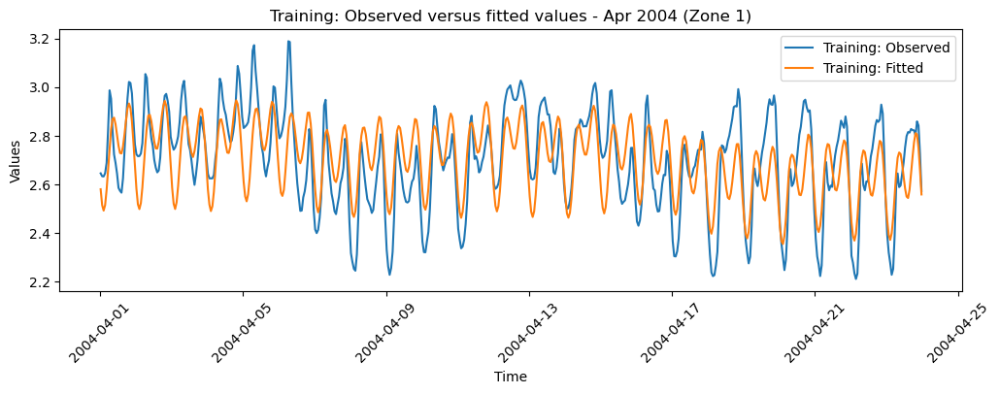

In [143]:
# Observed versus fitted values plot - training

fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(mul_reg_df_apr04_train.timestamp, y_train, label="Training: Observed")
ax.plot(mul_reg_df_apr04_train.timestamp, fitted_apr04_train, label="Training: Fitted")
ax.set_xlabel("Time")
ax.set_ylabel("Values")
ax.legend()
ax.set_title("Training: Observed versus fitted values - Apr 2004 (Zone 1)")
plt.xticks(rotation=45)
plt.show()

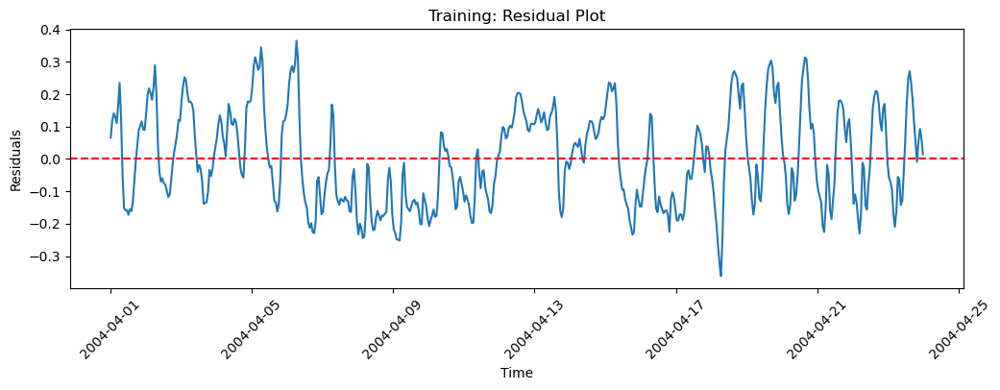

In [144]:
# Residual variance with time - training

fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(mul_reg_df_apr04_train.timestamp, np.array(y_train - fitted_apr04_train).reshape(-1, 1), label="Residuals (Training)")
ax.set_xlabel("Time")
ax.set_ylabel("Residuals")
ax.axhline(np.mean(np.array(y_train - fitted_apr04_train).reshape(-1, 1)), color="red", linestyle="--") # Residual mean
plt.xticks(rotation=45)
ax.set_title("Training: Residual Plot")
plt.show()

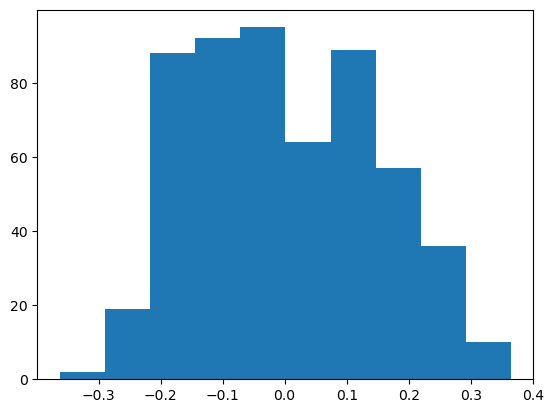

In [145]:
# Distribution of residuals
plt.hist(np.array(y_train - fitted_apr04_train).reshape(-1, 1))
plt.show()

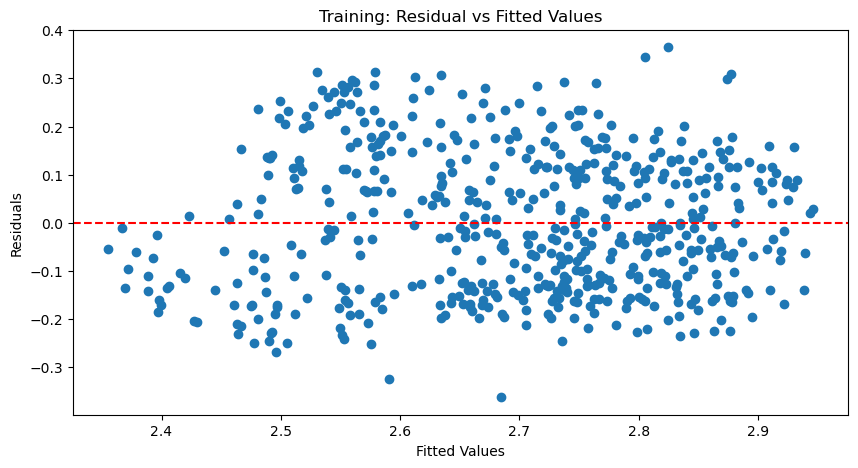

In [146]:
# Residual vs fitted values
fig, ax = plt.subplots(figsize=(10,5))
plt.scatter(np.array(fitted_apr04_train).reshape(-1,1), np.array(y_train - fitted_apr04_train).reshape(-1, 1))
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
ax.axhline(np.mean(np.array(y_train - fitted_apr04_train).reshape(-1, 1)), color="red", linestyle="--") # Residual mean
ax.set_title("Training: Residual vs Fitted Values")
plt.show()

Variance appears mostly contained.

##### Testing

In [147]:
# FEATURE SET: Testing

# Defining the sine wave
dp = DeterministicProcess(
    index=mul_reg_df_apr04_test.timestamp,
    period=None,         # It's not defined so that frequency can be read from the index
    constant=False,      # Let regression model define this intercept later on
    order=1,             # allows trend to be included so that the level of the wave is allowed to change with time, linearly 
    seasonal=False,      # no seasonal dummies
    additional_terms=[periodicity], # 2 seperate waves will be generated
    drop=True            # if perfect collinearity exists, the terms can be dropped
)

waves = dp.in_sample()

# Adding fourier terms
mul_reg_df_apr04_test = pd.merge(mul_reg_df_apr04_test, waves, on='timestamp', how='inner')
mul_reg_df_apr04_test.head()

,timestamp,temp_pc1,log_load_rs,holiday,trend,"sin(1,24)","cos(1,24)","sin(2,24)","cos(2,24)"
0,2004-04-24 00:30:00,62.266565,2.437728,0,1.0,0.000000,1.000000,0.000000,1.000000e+00
1,2004-04-24 01:30:00,62.708075,2.328643,0,2.0,0.258819,0.965926,0.500000,8.660254e-01
2,2004-04-24 02:30:00,61.449205,2.279316,0,3.0,0.500000,0.866025,0.866025,5.000000e-01
3,2004-04-24 03:30:00,60.634717,2.249290,0,4.0,0.707107,0.707107,1.000000,6.123234e-17
4,2004-04-24 04:30:00,59.824237,2.248657,0,5.0,0.866025,0.500000,0.866025,-5.000000e-01


In [148]:
# Specifying explanatory and explained variables - testing

X_test = mul_reg_df_apr04_test[['temp_pc1', 'holiday', 'trend', 'sin(1,24)', 'cos(1,24)', 'sin(2,24)', 'cos(2,24)']]
y_test = np.array(mul_reg_df_apr04_test.log_load_rs).reshape(-1, 1)
fitted_apr04_test = mul_reg_apr04_train.predict(X_test)

# Regression Performance - training
print(f"R2 score: {r2_score(y_test, fitted_apr04_test)}")
print(f'MSE score: {mean_squared_error(y_test, fitted_apr04_test)}')
print(f'MAE score: {mean_absolute_error(y_test, fitted_apr04_test)}')
print(f'MAPE score: {mean_absolute_percentage_error(y_test, fitted_apr04_test)}')

R2 score: 0.30955834070748045
MSE score: 0.023617305798423777
MAE score: 0.13123310980912098
MAPE score: 0.05218479295472437


Score on the test set are not particularly strong, most likely due to the non-linear relationship with temperature in this season.

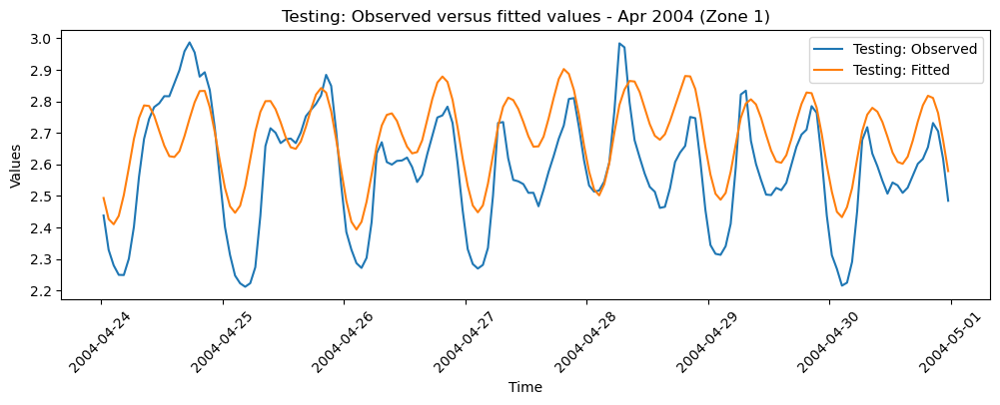

In [149]:
# Observed versus fitted values plot - testing

fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(mul_reg_df_apr04_test.timestamp, y_test, label="Testing: Observed")
ax.plot(mul_reg_df_apr04_test.timestamp, fitted_apr04_test, label="Testing: Fitted")
ax.set_xlabel("Time")
ax.set_ylabel("Values")
ax.legend()
ax.set_title("Testing: Observed versus fitted values - Apr 2004 (Zone 1)")
plt.xticks(rotation=45)
plt.show()

#### Multivariate Regression for July 2004, Zone 1

In [150]:
# Dataframe for Jul 2004, Zone 1
mul_reg_df_jul04 = mul_reg_df.loc[(mul_reg_df.timestamp >= "2004-07-01 00:30:00") & (mul_reg_df.timestamp < "2004-08-01 00:30:00"), ["timestamp", "temp_pc1", "log_load_rs", "holiday"]].reset_index(drop=True)
mul_reg_df_jul04.head()

,timestamp,temp_pc1,log_load_rs,holiday
0,2004-07-01 00:30:00,67.152732,2.658230,0
1,2004-07-01 01:30:00,66.148285,2.548507,0
2,2004-07-01 02:30:00,65.687669,2.482404,0
3,2004-07-01 03:30:00,64.515455,2.447464,0
4,2004-07-01 04:30:00,64.517938,2.430626,0


##### Training

In [151]:
# Defining train and test sets
mul_reg_df_jul04_train = mul_reg_df_jul04.loc[mul_reg_df_jul04.timestamp <= "2004-07-24 23:30:00", ["timestamp", "temp_pc1", "log_load_rs", "holiday"]]
mul_reg_df_jul04_test = mul_reg_df_jul04.loc[mul_reg_df_jul04.timestamp > "2004-07-24 23:30:00", ["timestamp", "temp_pc1", "log_load_rs", "holiday"]]

In [152]:
# FEATURE SET: Training

# Defining the sine wave
dp = DeterministicProcess(
    index=mul_reg_df_jul04_train.timestamp,
    period=None,         # It's not defined so that frequency can be read from the index
    constant=False,      # Let regression model define this intercept later on
    order=1,             # allows trend to be included so that the level of the wave is allowed to change with time, linearly 
    seasonal=False,      # no seasonal dummies
    additional_terms=[periodicity], # 2 seperate waves will be generated
    drop=True            # if perfect collinearity exists, the terms can be dropped
)

waves = dp.in_sample()

# Adding fourier terms
mul_reg_df_jul04_train = pd.merge(mul_reg_df_jul04_train, waves, on='timestamp', how='inner')
mul_reg_df_jul04_train.head()

,timestamp,temp_pc1,log_load_rs,holiday,trend,"sin(1,24)","cos(1,24)","sin(2,24)","cos(2,24)"
0,2004-07-01 00:30:00,67.152732,2.658230,0,1.0,0.000000,1.000000,0.000000,1.000000e+00
1,2004-07-01 01:30:00,66.148285,2.548507,0,2.0,0.258819,0.965926,0.500000,8.660254e-01
2,2004-07-01 02:30:00,65.687669,2.482404,0,3.0,0.500000,0.866025,0.866025,5.000000e-01
3,2004-07-01 03:30:00,64.515455,2.447464,0,4.0,0.707107,0.707107,1.000000,6.123234e-17
4,2004-07-01 04:30:00,64.517938,2.430626,0,5.0,0.866025,0.500000,0.866025,-5.000000e-01


In [153]:
# Specifying explanatory and explained variables - training

X_train = mul_reg_df_jul04_train[['temp_pc1', 'holiday', 'trend', 'sin(1,24)', 'cos(1,24)', 'sin(2,24)', 'cos(2,24)']]
y_train = np.array(mul_reg_df_jul04_train.log_load_rs).reshape(-1, 1)
mul_reg_jul04_train = LinearRegression().fit(X_train, y_train)
fitted_jul04_train = mul_reg_jul04_train.predict(X_train)

# Regression Performance - training
print(f"R2 score: {r2_score(y_train, fitted_jul04_train)}")
print(f'MSE score: {mean_squared_error(y_train, fitted_jul04_train)}')
print(f'MAE score: {mean_absolute_error(y_train, fitted_jul04_train)}')
print(f'MAPE score: {mean_absolute_percentage_error(y_train, fitted_jul04_train)}')

R2 score: 0.9365742395173737
MSE score: 0.00646344844211838
MAE score: 0.06384086801384364
MAPE score: 0.021581458746986464


R2 score was already strong, but has improved even further.

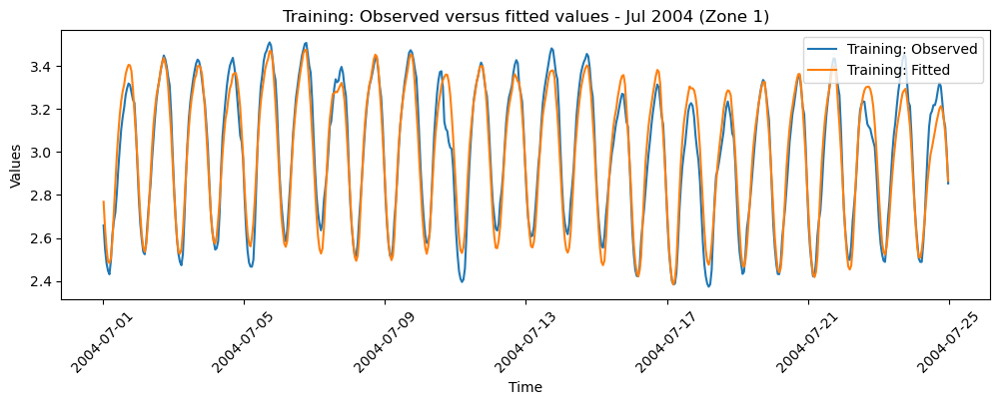

In [154]:
# Observed versus fitted values plot - training

fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(mul_reg_df_jul04_train.timestamp, y_train, label="Training: Observed")
ax.plot(mul_reg_df_jul04_train.timestamp, fitted_jul04_train, label="Training: Fitted")
ax.set_xlabel("Time")
ax.set_ylabel("Values")
ax.legend()
ax.set_title("Training: Observed versus fitted values - Jul 2004 (Zone 1)")
plt.xticks(rotation=45)
plt.show()

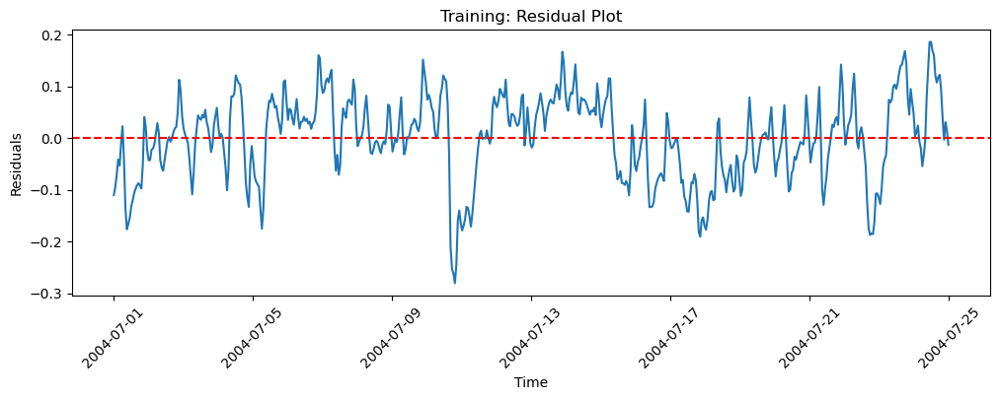

In [155]:
# Residual variance with time - training

fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(mul_reg_df_jul04_train.timestamp, np.array(y_train - fitted_jul04_train).reshape(-1, 1), label="Residuals (Training)")
ax.set_xlabel("Time")
ax.set_ylabel("Residuals")
ax.axhline(np.mean(np.array(y_train - fitted_jul04_train).reshape(-1, 1)), color="red", linestyle="--") # Residual mean
plt.xticks(rotation=45)
ax.set_title("Training: Residual Plot")
plt.show()

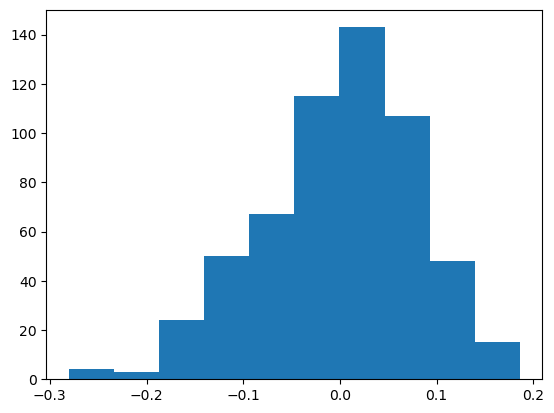

In [156]:
# Distribution of residuals
plt.hist(np.array(y_train - fitted_jul04_train).reshape(-1, 1))
plt.show()

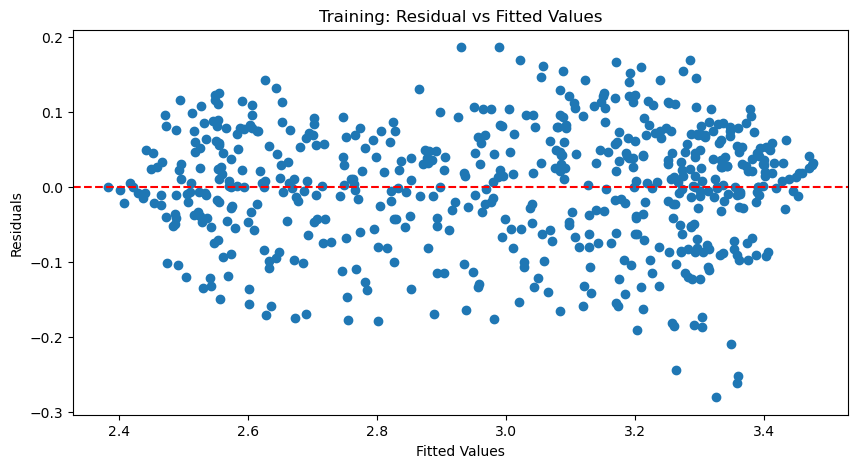

In [157]:
# Residual vs fitted values - training
fig, ax = plt.subplots(figsize=(10,5))
plt.scatter(np.array(fitted_jul04_train).reshape(-1,1), np.array(y_train - fitted_jul04_train).reshape(-1, 1))
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
ax.axhline(np.mean(np.array(y_train - fitted_jul04_train).reshape(-1, 1)), color="red", linestyle="--") # Residual mean
ax.set_title("Training: Residual vs Fitted Values")
plt.show()

##### Testing

In [158]:
# FEATURE SET: Testing

# Defining the sine wave
dp = DeterministicProcess(
    index=mul_reg_df_jul04_test.timestamp,
    period=None,         # It's not defined so that frequency can be read from the index
    constant=False,      # Let regression model define this intercept later on
    order=1,             # allows trend to be included so that the level of the wave is allowed to change with time, linearly 
    seasonal=False,      # no seasonal dummies
    additional_terms=[periodicity], # 2 seperate waves will be generated
    drop=True            # if perfect collinearity exists, the terms can be dropped
)

waves = dp.in_sample()

# Adding fourier terms
mul_reg_df_jul04_test = pd.merge(mul_reg_df_jul04_test, waves, on='timestamp', how='inner')
mul_reg_df_jul04_test.head()

,timestamp,temp_pc1,log_load_rs,holiday,trend,"sin(1,24)","cos(1,24)","sin(2,24)","cos(2,24)"
0,2004-07-25 00:30:00,70.616043,2.669517,0,1.0,0.000000,1.000000,0.000000,1.000000e+00
1,2004-07-25 01:30:00,70.893317,2.551552,0,2.0,0.258819,0.965926,0.500000,8.660254e-01
2,2004-07-25 02:30:00,70.710504,2.486073,0,3.0,0.500000,0.866025,0.866025,5.000000e-01
3,2004-07-25 03:30:00,70.526899,2.441738,0,4.0,0.707107,0.707107,1.000000,6.123234e-17
4,2004-07-25 04:30:00,70.527349,2.429834,0,5.0,0.866025,0.500000,0.866025,-5.000000e-01


In [159]:
# Specifying explanatory and explained variables - testing

X_test = mul_reg_df_jul04_test[['temp_pc1', 'holiday', 'trend', 'sin(1,24)', 'cos(1,24)', 'sin(2,24)', 'cos(2,24)']]
y_test = np.array(mul_reg_df_jul04_test.log_load_rs).reshape(-1, 1)
fitted_jul04_test = mul_reg_jul04_train.predict(X_test)

# Regression Performance - training
print(f"R2 score: {r2_score(y_test, fitted_jul04_test)}")
print(f'MSE score: {mean_squared_error(y_test, fitted_jul04_test)}')
print(f'MAE score: {mean_absolute_error(y_test, fitted_jul04_test)}')
print(f'MAPE score: {mean_absolute_percentage_error(y_test, fitted_jul04_test)}')

R2 score: 0.7936614049344565
MSE score: 0.016295742836156826
MAE score: 0.10382499370727893
MAPE score: 0.03602097278988346


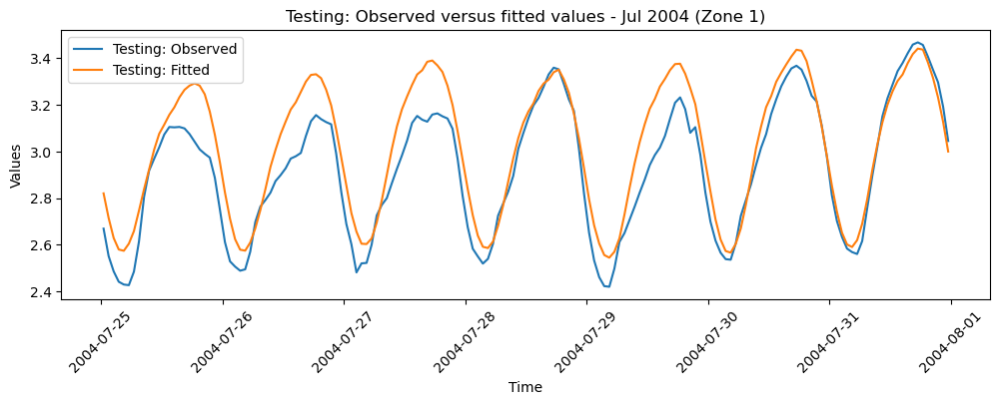

In [160]:
# Observed versus fitted values plot - testing

fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(mul_reg_df_jul04_test.timestamp, y_test, label="Testing: Observed")
ax.plot(mul_reg_df_jul04_test.timestamp, fitted_jul04_test, label="Testing: Fitted")
ax.set_xlabel("Time")
ax.set_ylabel("Values")
ax.legend()
ax.set_title("Testing: Observed versus fitted values - Jul 2004 (Zone 1)")
plt.xticks(rotation=45)
plt.show()

Explained Variance i.e. R2 on the test is high.

#### Multivariate Regression for October 2004, Zone 1

In [161]:
# Dataframe for Oct 2004, Zone 1
mul_reg_df_oct04 = mul_reg_df.loc[(mul_reg_df.timestamp >= "2004-10-01 00:30:00") & (mul_reg_df.timestamp < "2004-11-01 00:30:00"), ["timestamp", "temp_pc1", "log_load_rs", "holiday"]].reset_index(drop=True)
mul_reg_df_oct04.head()

,timestamp,temp_pc1,log_load_rs,holiday
0,2004-10-01 00:30:00,60.792180,2.410093,0
1,2004-10-01 01:30:00,60.513850,2.324444,0
2,2004-10-01 02:30:00,60.152501,2.293544,0
3,2004-10-01 03:30:00,59.693854,2.289399,0
4,2004-10-01 04:30:00,59.417333,2.303684,0


##### Training

In [162]:
# Defining train and test sets
mul_reg_df_oct04_train = mul_reg_df_oct04.loc[mul_reg_df_oct04.timestamp < "2004-10-25 00:30:00", ["timestamp", "temp_pc1", "log_load_rs", "holiday"]]
mul_reg_df_oct04_test = mul_reg_df_oct04.loc[mul_reg_df_oct04.timestamp > "2004-10-24 23:30:00", ["timestamp", "temp_pc1", "log_load_rs", "holiday"]]

In [163]:
# FEATURE SET: Training

# Defining the sine wave
dp = DeterministicProcess(
    index=mul_reg_df_oct04_train.timestamp,
    period=None,         # It's not defined so that frequency can be read from the index
    constant=False,      # Let regression model define this intercept later on
    order=1,             # allows trend to be included so that the level of the wave is allowed to change with time, linearly 
    seasonal=False,      # no seasonal dummies
    additional_terms=[periodicity], # 2 seperate waves will be generated
    drop=True            # if perfect collinearity exists, the terms can be dropped
)

waves = dp.in_sample()

# Adding fourier terms
mul_reg_df_oct04_train = pd.merge(mul_reg_df_oct04_train, waves, on='timestamp', how='inner')
mul_reg_df_oct04_train.head()

,timestamp,temp_pc1,log_load_rs,holiday,trend,"sin(1,24)","cos(1,24)","sin(2,24)","cos(2,24)"
0,2004-10-01 00:30:00,60.792180,2.410093,0,1.0,0.000000,1.000000,0.000000,1.000000e+00
1,2004-10-01 01:30:00,60.513850,2.324444,0,2.0,0.258819,0.965926,0.500000,8.660254e-01
2,2004-10-01 02:30:00,60.152501,2.293544,0,3.0,0.500000,0.866025,0.866025,5.000000e-01
3,2004-10-01 03:30:00,59.693854,2.289399,0,4.0,0.707107,0.707107,1.000000,6.123234e-17
4,2004-10-01 04:30:00,59.417333,2.303684,0,5.0,0.866025,0.500000,0.866025,-5.000000e-01


In [164]:
# Specifying explanatory and explained variables - training

X_train = mul_reg_df_oct04_train[['temp_pc1', 'holiday', 'trend', 'sin(1,24)', 'cos(1,24)', 'sin(2,24)', 'cos(2,24)']]
y_train = np.array(mul_reg_df_oct04_train.log_load_rs).reshape(-1, 1)
mul_reg_oct04_train = LinearRegression().fit(X_train, y_train)
fitted_oct04_train = mul_reg_oct04_train.predict(X_train)

# Regression Performance - training
print(f"R2 score: {r2_score(y_train, fitted_oct04_train)}")
print(f'MSE score: {mean_squared_error(y_train, fitted_oct04_train)}')
print(f'MAE score: {mean_absolute_error(y_train, fitted_oct04_train)}')
print(f'MAPE score: {mean_absolute_percentage_error(y_train, fitted_oct04_train)}')

R2 score: 0.8044961895062201
MSE score: 0.005711536712779516
MAE score: 0.05688349207922504
MAPE score: 0.021702275397250708


R2 score is strong here as well.

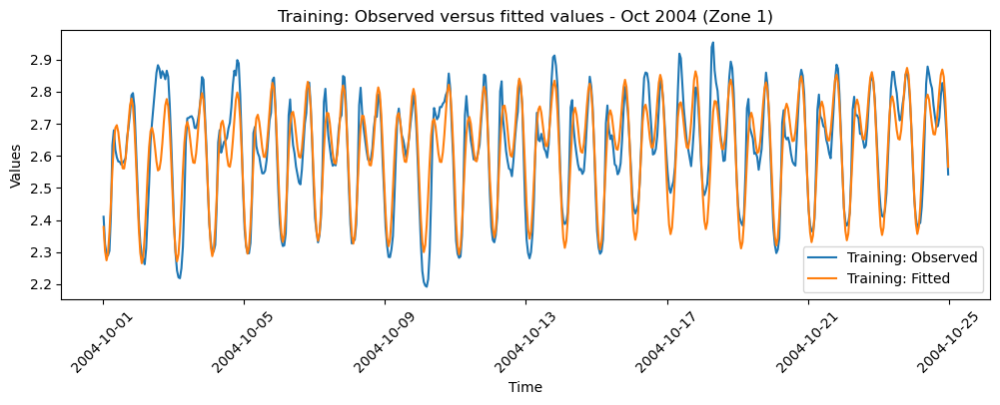

In [165]:
# Observed versus fitted values plot - training

fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(mul_reg_df_oct04_train.timestamp, y_train, label="Training: Observed")
ax.plot(mul_reg_df_oct04_train.timestamp, fitted_oct04_train, label="Training: Fitted")
ax.set_xlabel("Time")
ax.set_ylabel("Values")
ax.legend()
ax.set_title("Training: Observed versus fitted values - Oct 2004 (Zone 1)")
plt.xticks(rotation=45)
plt.show()

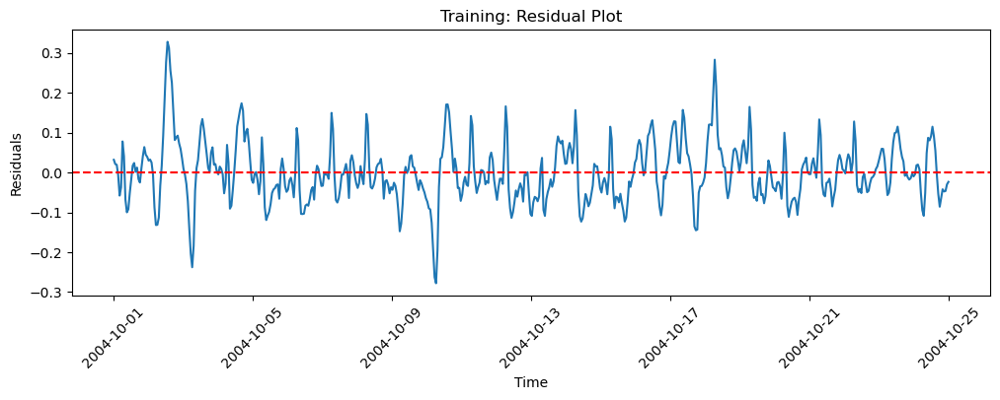

In [166]:
# Residual variance with time - training

fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(mul_reg_df_oct04_train.timestamp, np.array(y_train - fitted_oct04_train).reshape(-1, 1), label="Residuals (Training)")
ax.set_xlabel("Time")
ax.set_ylabel("Residuals")
ax.axhline(np.mean(np.array(y_train - fitted_oct04_train).reshape(-1, 1)), color="red", linestyle="--") # Residual mean
plt.xticks(rotation=45)
ax.set_title("Training: Residual Plot")
plt.show()

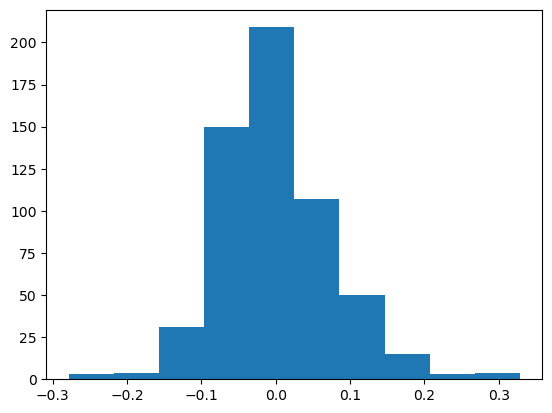

In [167]:
# Distribution of residuals
plt.hist(np.array(y_train - fitted_oct04_train).reshape(-1, 1))
plt.show()

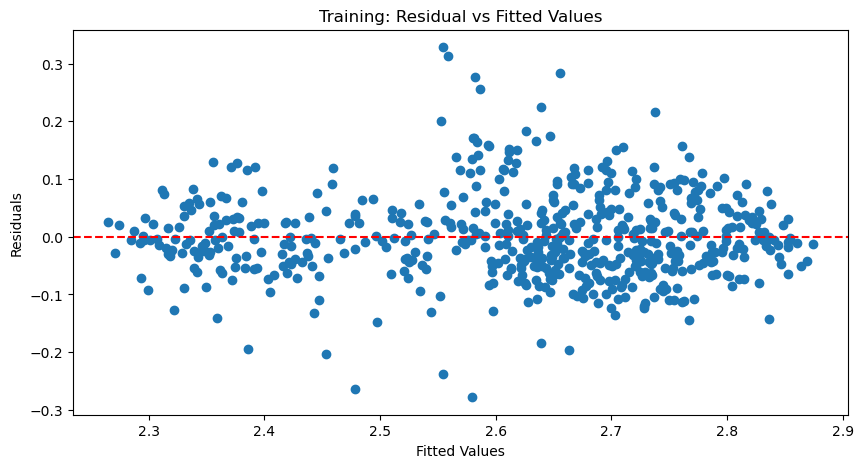

In [168]:
# Residual vs fitted values - training
fig, ax = plt.subplots(figsize=(10,5))
plt.scatter(np.array(fitted_oct04_train).reshape(-1,1), np.array(y_train - fitted_oct04_train).reshape(-1, 1))
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
ax.axhline(np.mean(np.array(y_train - fitted_oct04_train).reshape(-1, 1)), color="red", linestyle="--") # Residual mean
ax.set_title("Training: Residual vs Fitted Values")
plt.show()

No obvious funnel or curved shape, variance appears to be mostly contained apart from the middle section.

##### Testing

In [169]:
# FEATURE SET: Testing

# Defining the sine wave
dp = DeterministicProcess(
    index=mul_reg_df_oct04_test.timestamp,
    period=None,         # It's not defined so that frequency can be read from the index
    constant=False,      # Let regression model define this intercept later on
    order=1,             # allows trend to be included so that the level of the wave is allowed to change with time, linearly 
    seasonal=False,      # no seasonal dummies
    additional_terms=[periodicity], # 2 seperate waves will be generated
    drop=True            # if perfect collinearity exists, the terms can be dropped
)

waves = dp.in_sample()

# Adding fourier terms
mul_reg_df_oct04_test = pd.merge(mul_reg_df_oct04_test, waves, on='timestamp', how='inner')
mul_reg_df_oct04_test.head()

,timestamp,temp_pc1,log_load_rs,holiday,trend,"sin(1,24)","cos(1,24)","sin(2,24)","cos(2,24)"
0,2004-10-25 00:30:00,50.290127,2.449970,0,1.0,0.000000,1.000000,0.000000,1.000000e+00
1,2004-10-25 01:30:00,50.291859,2.407305,0,2.0,0.258819,0.965926,0.500000,8.660254e-01
2,2004-10-25 02:30:00,50.658222,2.395164,0,3.0,0.500000,0.866025,0.866025,5.000000e-01
3,2004-10-25 03:30:00,50.571048,2.396531,0,4.0,0.707107,0.707107,1.000000,6.123234e-17
4,2004-10-25 04:30:00,50.467636,2.434403,0,5.0,0.866025,0.500000,0.866025,-5.000000e-01


In [170]:
# Specifying explanatory and explained variables - testing

X_test = mul_reg_df_oct04_test[['temp_pc1', 'holiday', 'trend', 'sin(1,24)', 'cos(1,24)', 'sin(2,24)', 'cos(2,24)']]
y_test = np.array(mul_reg_df_oct04_test.log_load_rs).reshape(-1, 1)
fitted_oct04_test = mul_reg_oct04_train.predict(X_test)

# Regression Performance - training
print(f"R2 score: {r2_score(y_test, fitted_oct04_test)}")
print(f'MSE score: {mean_squared_error(y_test, fitted_oct04_test)}')
print(f'MAE score: {mean_absolute_error(y_test, fitted_oct04_test)}')
print(f'MAPE score: {mean_absolute_percentage_error(y_test, fitted_oct04_test)}')

R2 score: 0.7977021036066552
MSE score: 0.005712398296527978
MAE score: 0.05999630854710179
MAPE score: 0.023227637005485822


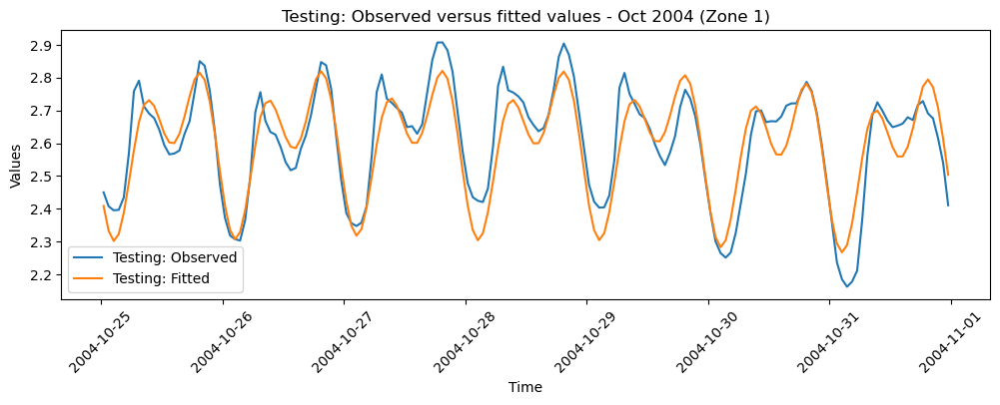

In [171]:
# Observed versus fitted values plot - testing

fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(mul_reg_df_oct04_test.timestamp, y_test, label="Testing: Observed")
ax.plot(mul_reg_df_oct04_test.timestamp, fitted_oct04_test, label="Testing: Fitted")
ax.set_xlabel("Time")
ax.set_ylabel("Values")
ax.legend()
ax.set_title("Testing: Observed versus fitted values - Oct 2004 (Zone 1)")
plt.xticks(rotation=45)
plt.show()

#### Multivariate Regression for December 2004, Zone 1

In [172]:
# Dataframe for Dec 2004, Zone 1
mul_reg_df_dec04 = mul_reg_df.loc[(mul_reg_df.timestamp >= "2004-12-01 00:30:00") & (mul_reg_df.timestamp < "2005-01-01"), ["timestamp", "temp_pc1", "log_load_rs", "holiday"]].reset_index(drop=True)
mul_reg_df_dec04.head()

,timestamp,temp_pc1,log_load_rs,holiday
0,2004-12-01 00:30:00,47.965991,2.650774,0
1,2004-12-01 01:30:00,48.609925,2.609481,0
2,2004-12-01 02:30:00,49.154281,2.608304,0
3,2004-12-01 03:30:00,50.252969,2.617177,0
4,2004-12-01 04:30:00,51.607521,2.646104,0


##### Training

In [173]:
# Defining train and test sets
mul_reg_df_dec04_train = mul_reg_df_dec04.loc[mul_reg_df_dec04.timestamp < "2004-12-25 00:30:00", ["timestamp", "temp_pc1", "log_load_rs", "holiday"]]
mul_reg_df_dec04_test = mul_reg_df_dec04.loc[mul_reg_df_dec04.timestamp > "2004-12-24 23:30:00", ["timestamp", "temp_pc1", "log_load_rs", "holiday"]]

In [174]:
# FEATURE SET: Training

# Defining the sine wave
dp = DeterministicProcess(
    index=mul_reg_df_dec04_train.timestamp,
    period=None,         # It's not defined so that frequency can be read from the index
    constant=False,      # Let regression model define this intercept later on
    order=1,             # allows trend to be included so that the level of the wave is allowed to change with time, linearly 
    seasonal=False,      # no seasonal dummies
    additional_terms=[periodicity], # 2 seperate waves will be generated
    drop=True            # if perfect collinearity exists, the terms can be dropped
)

waves = dp.in_sample()

# Adding fourier terms
mul_reg_df_dec04_train = pd.merge(mul_reg_df_dec04_train, waves, on='timestamp', how='inner')
mul_reg_df_dec04_train.head()

,timestamp,temp_pc1,log_load_rs,holiday,trend,"sin(1,24)","cos(1,24)","sin(2,24)","cos(2,24)"
0,2004-12-01 00:30:00,47.965991,2.650774,0,1.0,0.000000,1.000000,0.000000,1.000000e+00
1,2004-12-01 01:30:00,48.609925,2.609481,0,2.0,0.258819,0.965926,0.500000,8.660254e-01
2,2004-12-01 02:30:00,49.154281,2.608304,0,3.0,0.500000,0.866025,0.866025,5.000000e-01
3,2004-12-01 03:30:00,50.252969,2.617177,0,4.0,0.707107,0.707107,1.000000,6.123234e-17
4,2004-12-01 04:30:00,51.607521,2.646104,0,5.0,0.866025,0.500000,0.866025,-5.000000e-01


In [175]:
# Specifying explanatory and explained variables - training

X_train = mul_reg_df_dec04_train[['temp_pc1', 'holiday', 'trend', 'sin(1,24)', 'cos(1,24)', 'sin(2,24)', 'cos(2,24)']]
y_train = np.array(mul_reg_df_dec04_train.log_load_rs).reshape(-1, 1)
mul_reg_dec04_train = LinearRegression().fit(X_train, y_train)
fitted_dec04_train = mul_reg_dec04_train.predict(X_train)

# Regression Performance - training
print(f"R2 score: {r2_score(y_train, fitted_dec04_train)}")
print(f'MSE score: {mean_squared_error(y_train, fitted_dec04_train)}')
print(f'MAE score: {mean_absolute_error(y_train, fitted_dec04_train)}')
print(f'MAPE score: {mean_absolute_percentage_error(y_train, fitted_dec04_train)}')

R2 score: 0.8781546946045512
MSE score: 0.007536921368709319
MAE score: 0.06758397626683564
MAPE score: 0.022519566643655675


Strong R2 score here as well.<br>
Only months of April and May appear tricky because of unclear relationship between temperature and load.

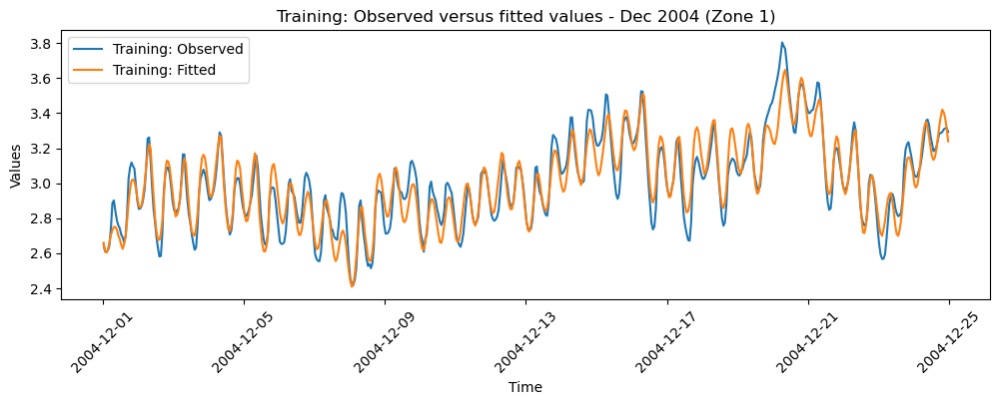

In [176]:
# Observed versus fitted values plot - training

fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(mul_reg_df_dec04_train.timestamp, y_train, label="Training: Observed")
ax.plot(mul_reg_df_dec04_train.timestamp, fitted_dec04_train, label="Training: Fitted")
ax.set_xlabel("Time")
ax.set_ylabel("Values")
ax.legend()
ax.set_title("Training: Observed versus fitted values - Dec 2004 (Zone 1)")
plt.xticks(rotation=45)
plt.show()

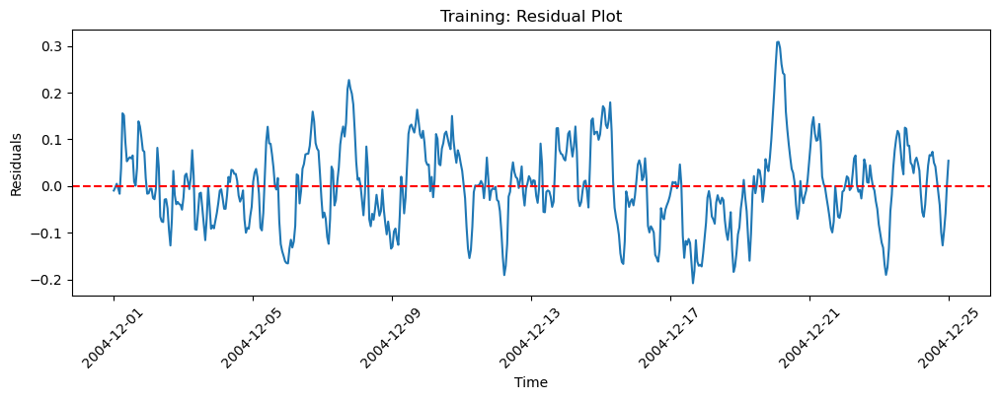

In [177]:
# Residual variance with time - training

fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(mul_reg_df_dec04_train.timestamp, np.array(y_train - fitted_dec04_train).reshape(-1, 1), label="Residuals (Training)")
ax.set_xlabel("Time")
ax.set_ylabel("Residuals")
ax.axhline(np.mean(np.array(y_train - fitted_dec04_train).reshape(-1, 1)), color="red", linestyle="--") # Residual mean
plt.xticks(rotation=45)
ax.set_title("Training: Residual Plot")
plt.show()

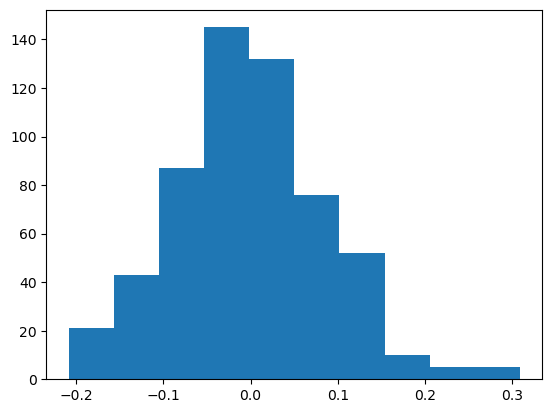

In [178]:
# Distribution of residuals
plt.hist(np.array(y_train - fitted_dec04_train).reshape(-1, 1))
plt.show()

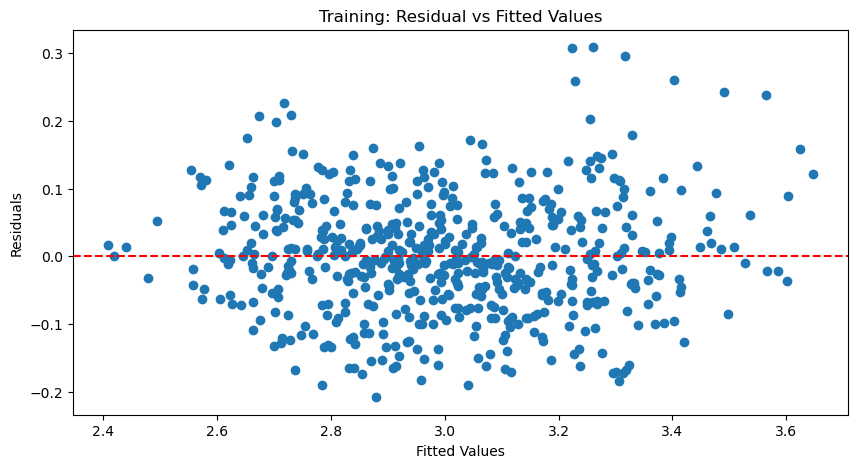

In [179]:
# Residual vs fitted values - training
fig, ax = plt.subplots(figsize=(10,5))
plt.scatter(np.array(fitted_dec04_train).reshape(-1,1), np.array(y_train - fitted_dec04_train).reshape(-1, 1))
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
ax.axhline(np.mean(np.array(y_train - fitted_dec04_train).reshape(-1, 1)), color="red", linestyle="--") # Residual mean
ax.set_title("Training: Residual vs Fitted Values")
plt.show()

No obvious shape, but variance is high and not contained -> heteroskedasticity.

##### Testing

In [180]:
# FEATURE SET: Testing

# Defining the sine wave
dp = DeterministicProcess(
    index=mul_reg_df_dec04_test.timestamp,
    period=None,         # It's not defined so that frequency can be read from the index
    constant=False,      # Let regression model define this intercept later on
    order=1,             # allows trend to be included so that the level of the wave is allowed to change with time, linearly 
    seasonal=False,      # no seasonal dummies
    additional_terms=[periodicity], # 2 seperate waves will be generated
    drop=True            # if perfect collinearity exists, the terms can be dropped
)

waves = dp.in_sample()

# Adding fourier terms
mul_reg_df_dec04_test = pd.merge(mul_reg_df_dec04_test, waves, on='timestamp', how='inner')
mul_reg_df_dec04_test.head()

,timestamp,temp_pc1,log_load_rs,holiday,trend,"sin(1,24)","cos(1,24)","sin(2,24)","cos(2,24)"
0,2004-12-25 00:30:00,25.586955,3.270443,0,1.0,0.000000,1.000000,0.000000,1.000000e+00
1,2004-12-25 01:30:00,24.675567,3.272530,0,2.0,0.258819,0.965926,0.500000,8.660254e-01
2,2004-12-25 02:30:00,24.681275,3.290191,0,3.0,0.500000,0.866025,0.866025,5.000000e-01
3,2004-12-25 03:30:00,24.588997,3.314804,0,4.0,0.707107,0.707107,1.000000,6.123234e-17
4,2004-12-25 04:30:00,24.320518,3.350676,0,5.0,0.866025,0.500000,0.866025,-5.000000e-01


In [181]:
# Specifying explanatory and explained variables - testing

X_test = mul_reg_df_dec04_test[['temp_pc1', 'holiday', 'trend', 'sin(1,24)', 'cos(1,24)', 'sin(2,24)', 'cos(2,24)']]
y_test = np.array(mul_reg_df_dec04_test.log_load_rs).reshape(-1, 1)
fitted_dec04_test = mul_reg_dec04_train.predict(X_test)

# Regression Performance - training
print(f"R2 score: {r2_score(y_test, fitted_dec04_test)}")
print(f'MSE score: {mean_squared_error(y_test, fitted_dec04_test)}')
print(f'MAE score: {mean_absolute_error(y_test, fitted_dec04_test)}')
print(f'MAPE score: {mean_absolute_percentage_error(y_test, fitted_dec04_test)}')

R2 score: 0.7653040820130188
MSE score: 0.011012777667895858
MAE score: 0.07941630680687417
MAPE score: 0.025151430250917695


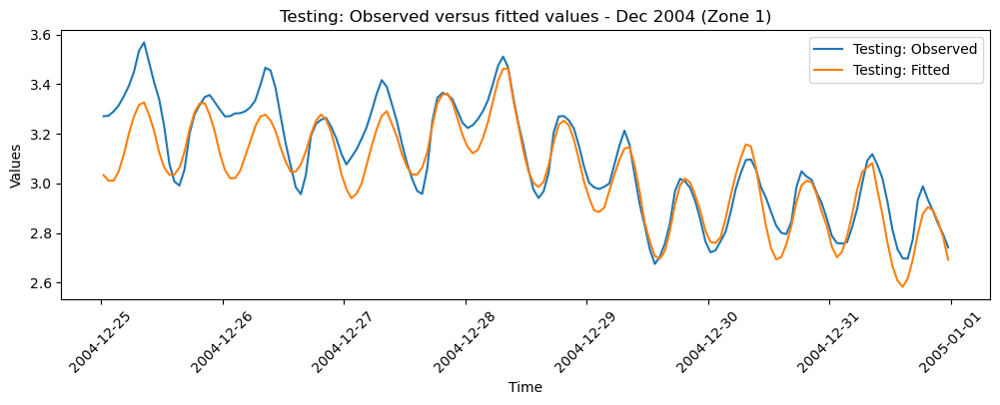

In [182]:
# Observed versus fitted values plot - testing

fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(mul_reg_df_dec04_test.timestamp, y_test, label="Testing: Observed")
ax.plot(mul_reg_df_dec04_test.timestamp, fitted_dec04_test, label="Testing: Fitted")
ax.set_xlabel("Time")
ax.set_ylabel("Values")
ax.legend()
ax.set_title("Testing: Observed versus fitted values - Dec 2004 (Zone 1)")
plt.xticks(rotation=45)
plt.show()

### Relationship between load and temperature, by month
- Identifying portions of the year where relationship between load and temperature isn't very clear.
- It is found that in autumn-winter months (Sep - Nov), fourier terms seem to explain load variance well.
- It is found that in autumn-winter months (for ex. Oct) relation with temperature isn't very clear, but that isn't hampering test performance.

C:\Users\singh\AppData\Local\Temp\ipykernel_17436\3516576481.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mul_reg_df_2004_z1['month'] = mul_reg_df_2004_z1['timestamp'].dt.month


Text(0.5, 1.02, 'Load vs. Temperature Scatterplots by Month - 2004 (Zone 1)')

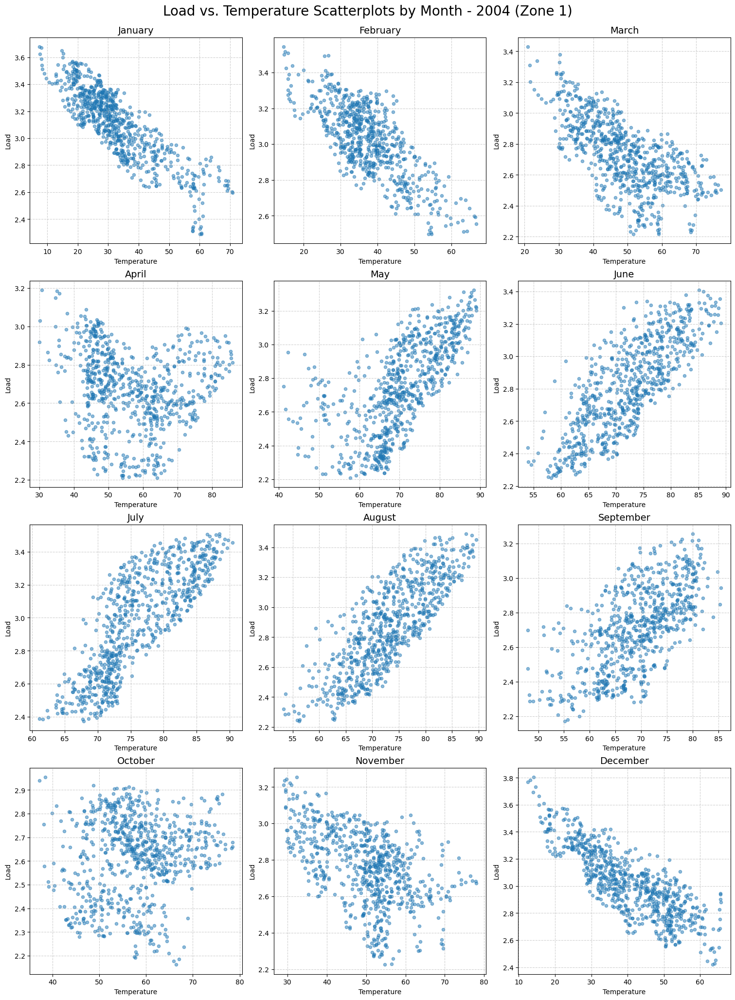

In [183]:
# Plotting for 2004 - Zone 1

import pandas as pd
import matplotlib.pyplot as plt
import datetime as dt

# Dataset for 2004 only (Zone 1)
mul_reg_df_2004_z1 = mul_reg_df.loc[mul_reg_df.timestamp.dt.year == 2004,:]

# Extract the month number (1 for Jan, 12 for Dec)
mul_reg_df_2004_z1['month'] = mul_reg_df_2004_z1['timestamp'].dt.month

# Define month names for plot titles
month_names = {
    1: 'January', 2: 'February', 3: 'March', 4: 'April',
    5: 'May', 6: 'June', 7: 'July', 8: 'August',
    9: 'September', 10: 'October', 11: 'November', 12: 'December'
}

# 3. Create the multiple subplots
fig, axes = plt.subplots(4, 3, figsize=(15, 20), constrained_layout=True)
axes = axes.flatten() # Flatten the 4x3 array into a 1D array for easy indexing

# Iterate over all 12 months
for month_num in range(1, 13):
    ax = axes[month_num - 1]
    
    # Filter data for the current month
    month_data = mul_reg_df_2004_z1[mul_reg_df_2004_z1['month'] == month_num]
    
    # Create the scatterplot
    ax.scatter(month_data['temp_pc1'], month_data['log_load_rs'], alpha=0.5, s=20)
    
    # Set plot titles and labels
    ax.set_title(f'{month_names[month_num]}', fontsize=14)
    ax.set_xlabel('Temperature', fontsize=10)
    ax.set_ylabel('Load', fontsize=10)
    ax.grid(True, linestyle='--', alpha=0.6)

# Set a main title for the entire figure
fig.suptitle('Load vs. Temperature Scatterplots by Month - 2004 (Zone 1)', fontsize=20, y=1.02)

C:\Users\singh\AppData\Local\Temp\ipykernel_17436\1976941922.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mul_reg_df_2005_z1['month'] = mul_reg_df_2005_z1['timestamp'].dt.month


Text(0.5, 1.02, 'Load vs. Temperature Scatterplots by Month - 2005 (Zone 1)')

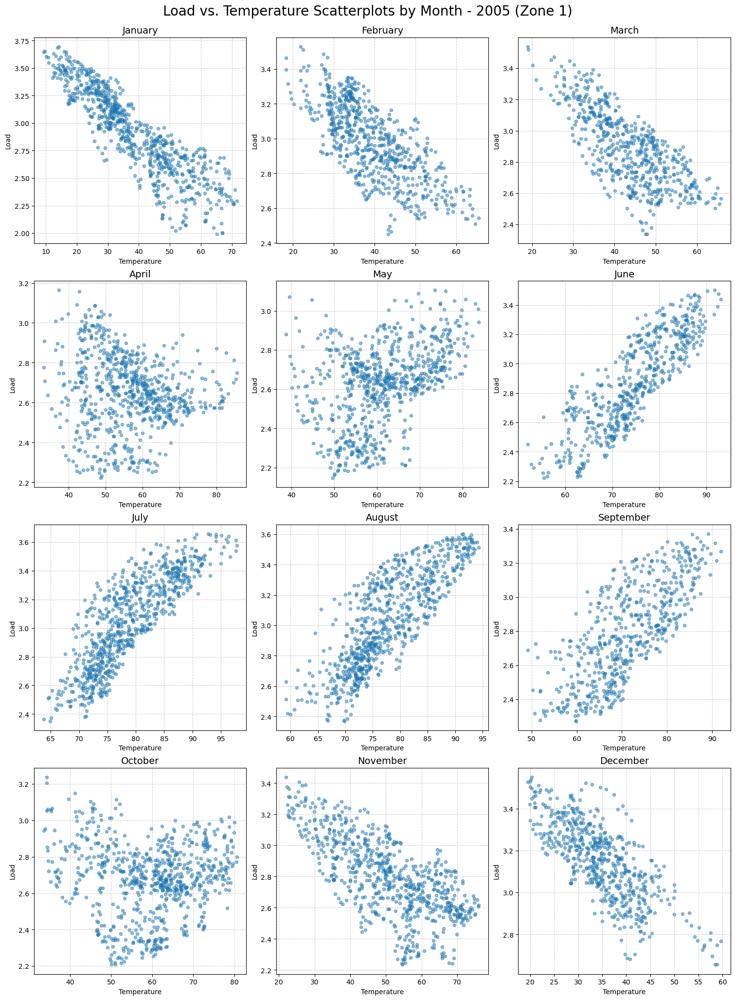

In [184]:
# Plotting for 2005 - Zone 1

# Dataset for 2005 only (Zone 1)
mul_reg_df_2005_z1 = mul_reg_df.loc[mul_reg_df.timestamp.dt.year == 2005,:]

# Extract the month number (1 for Jan, 12 for Dec)
mul_reg_df_2005_z1['month'] = mul_reg_df_2005_z1['timestamp'].dt.month

# Define month names for plot titles
month_names = {
    1: 'January', 2: 'February', 3: 'March', 4: 'April',
    5: 'May', 6: 'June', 7: 'July', 8: 'August',
    9: 'September', 10: 'October', 11: 'November', 12: 'December'
}

# 3. Create the multiple subplots
fig, axes = plt.subplots(4, 3, figsize=(15, 20), constrained_layout=True)
axes = axes.flatten() # Flatten the 4x3 array into a 1D array for easy indexing

# Iterate over all 12 months
for month_num in range(1, 13):
    ax = axes[month_num - 1]
    
    # Filter data for the current month
    month_data = mul_reg_df_2005_z1[mul_reg_df_2005_z1['month'] == month_num]
    
    # Create the scatterplot
    ax.scatter(month_data['temp_pc1'], month_data['log_load_rs'], alpha=0.5, s=20)
    
    # Set plot titles and labels
    ax.set_title(f'{month_names[month_num]}', fontsize=14)
    ax.set_xlabel('Temperature', fontsize=10)
    ax.set_ylabel('Load', fontsize=10)
    ax.grid(True, linestyle='--', alpha=0.6)

# Set a main title for the entire figure
fig.suptitle('Load vs. Temperature Scatterplots by Month - 2005 (Zone 1)', fontsize=20, y=1.02)

The pattern is exactly the same for 2005. Periods of unclear relationship are Apr-May and Oct-Nov.

> Periods where relationship isn't particularly clear are:-
>- March to May (both inclusive)
>- September to November (both inclusive)<br>

> October also has unclear relationship between load and temp, but even then test performance is very high.
>- Likely that load variance is more periodic in movement (hence, explained well by fourier terms)

### Piecewise Linear Approach 
- Problem is that the relationship of temperature with load is actually non-linear. 
- The linear model previously used doesn't accommodate for that.
- Defining "knots" can address the u-shaped relationship

#### Identifying Knots - Visual Inspection
The knots are going the be defined on temperature, but the knot points must be identified.

In [185]:
# Only values of Zone 1 are contained - # of obs for Jan 1, 2024
len(mul_reg_df.loc[(mul_reg_df.timestamp.dt.day == 1) & (mul_reg_df.timestamp.dt.month == 1) & (mul_reg_df.timestamp.dt.year == 2004), :])

24

Text(0.5, 1.04, 'Load vs. Temperature Scatterplots by Month (Zone 1) - All Years (Zone 1)')

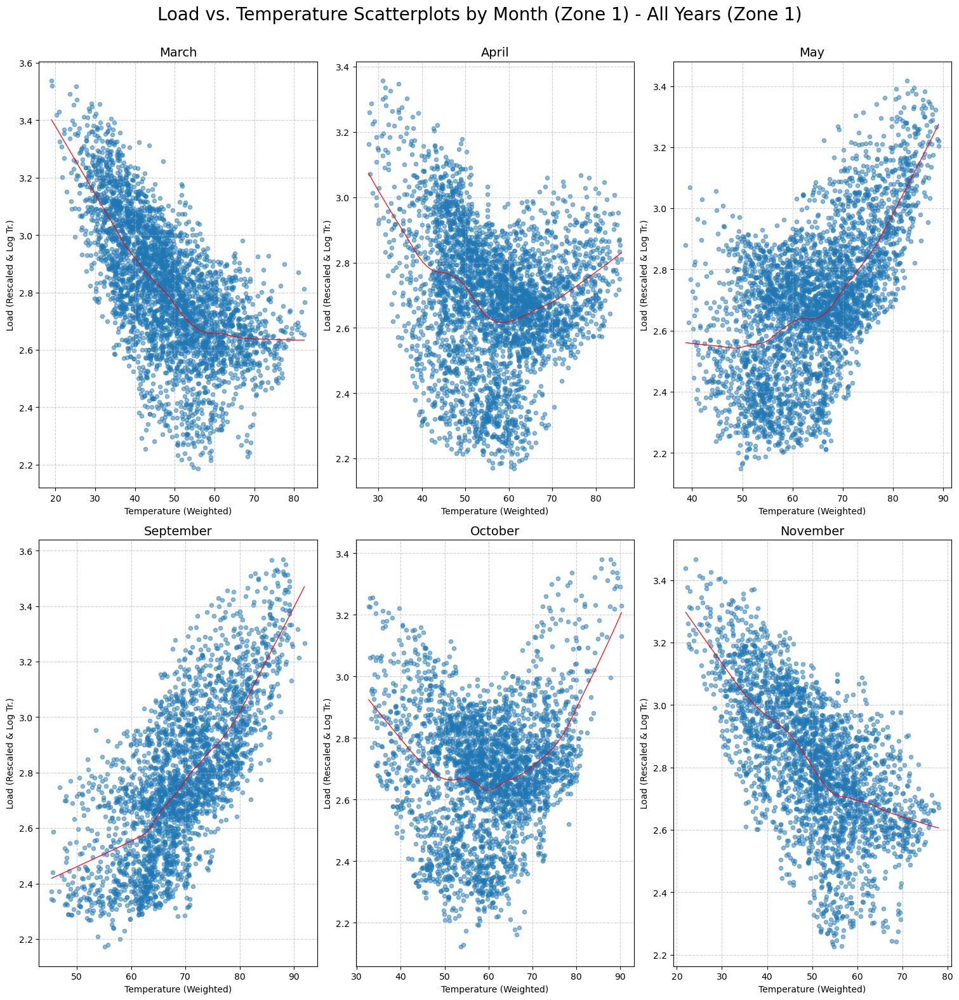

In [186]:
import statsmodels.api as sm
from statsmodels.nonparametric.smoothers_lowess import lowess

# Defining month names

month_names = {
    3: 'March', 4: 'April', 5: 'May', 9: 'September', 10: 'October', 11: 'November'
}

ax_names = {
    3: 0, 4: 1, 5: 2, 9: 3, 10: 4, 11: 5
}

# Create the multiple subplots
fig, axes = plt.subplots(2, 3, figsize=(15, 15), constrained_layout=True)
axes = axes.flatten() # Flatten the 2x3 array into a 1D array for easy indexing

# Iterate over selected months
for month_num in [3,4,5,9,10,11]:
    ax = axes[ax_names[month_num]]
    
    # Filter data for the current month
    month_data = mul_reg_df.loc[mul_reg_df.timestamp.dt.month == month_num,:]

    # Creating Lowess Smoothing Curve
    lowess_result = lowess(endog=month_data['log_load_rs'], exog=month_data['temp_pc1'], frac=0.3)
    x_smoothed = lowess_result[:, 0]
    y_smoothed = lowess_result[:, 1]
    
    # Create the scatterplot with lowess
    ax.scatter(month_data['temp_pc1'], month_data['log_load_rs'], alpha=0.5, s=20)
    ax.plot(x_smoothed, y_smoothed, color='red', linewidth=1, alpha=0.9, label='LOESS Smooth')

    # Set plot titles and labels
    ax.set_title(f'{month_names[month_num]}', fontsize=14)
    ax.set_xlabel('Temperature (Weighted)', fontsize=10)
    ax.set_ylabel('Load (Rescaled & Log Tr.)', fontsize=10)
    ax.grid(True, linestyle='--', alpha=0.6)

# Set a main title for the entire figure
fig.suptitle('Load vs. Temperature Scatterplots by Month (Zone 1) - All Years (Zone 1)', fontsize=20, y=1.04)

- In some graphs, it appears that there exists a U-shaped curve (not V-shaped). 
- This suggests that using two knots can be a good way to model load behavior for different temperature regions.

Considering multiple months, the knots for temperature can be defined as follows:
- Below 55 ("Heating Demand": Load should increase rapidly, as temp drops in this region)
- 55-65 (Load movement is more uncertain, likely month specific)
- Above 65 ("Cooling Demand": Load should increase rapidly, as temp increase in this region)

In [187]:
# Defining the Knots (Thresholds)
T_H = 55  # Heating Threshold
T_C = 65  # Cooling Threshold

# Construct the Heating Demand Knot: HDK = max(0, T_H - Temp)
## This captures load increase when temp is below T_H.
mul_reg_df["HDK"] = np.where(
    mul_reg_df["temp_pc1"] < T_H,  
    T_H - mul_reg_df["temp_pc1"],  # Value if True: The positive difference
    0                               # Value if False: Zero
)

# Construct the Cooling Demand Knot; CDK = max(0, Temp - T_C)
## This captures load increase when temp is above T_C.
mul_reg_df["CDK"] = np.where(
    mul_reg_df["temp_pc1"] > T_C,  
    mul_reg_df["temp_pc1"] - T_C,  # Value if True: The positive difference
    0                               # Value if False: Zero
)

mul_reg_df.head()

,timestamp,temp_pc1,log_load_rs,holiday,HDK,CDK
0,2004-01-01 00:30:00,42.338937,2.824529,1,12.661063,0.0
1,2004-01-01 01:30:00,41.239284,2.800325,1,13.760716,0.0
2,2004-01-01 02:30:00,39.591442,2.804390,1,15.408558,0.0
3,2004-01-01 03:30:00,36.243296,2.825715,1,18.756704,0.0
4,2004-01-01 04:30:00,34.600850,2.836971,1,20.399150,0.0


#### Applying Complete Regression
Replacing temperature with CDK and HDK knots, and using other regressors used in multiple regression.

In [188]:
# Defining a function to check if regression residuals are stationary
from statsmodels.tsa.stattools import adfuller

def check_stationarity(timeseries):
    result = adfuller(timeseries, autolag='AIC')
    p_value = result[1]
    print(f'ADF Statistic: {result[0]}')
    print(f'p-value: {p_value}')
    print('Stationary' if p_value < 0.05 else 'Non-Stationary')

##### January 2004, Zone 1

###### Training

In [189]:
# Dataframe for Jan 2004, Zone 1
plr_df_jan04 = mul_reg_df.loc[(mul_reg_df.timestamp >= "2004-01-01 00:30:00") & (mul_reg_df.timestamp < "2004-02-01"), ["timestamp", "HDK", "CDK", "log_load_rs", "holiday"]].reset_index(drop=True)
plr_df_jan04.head()

,timestamp,HDK,CDK,log_load_rs,holiday
0,2004-01-01 00:30:00,12.661063,0.0,2.824529,1
1,2004-01-01 01:30:00,13.760716,0.0,2.800325,1
2,2004-01-01 02:30:00,15.408558,0.0,2.804390,1
3,2004-01-01 03:30:00,18.756704,0.0,2.825715,1
4,2004-01-01 04:30:00,20.399150,0.0,2.836971,1


In [190]:
# Defining training sets
plr_df_jan04_train = plr_df_jan04.loc[plr_df_jan04.timestamp < "2004-01-25 00:30:00", ["timestamp", "HDK", "CDK", "log_load_rs", "holiday"]]

# FEATURE SET: Training

# Defining the sine wave
dp = DeterministicProcess(
    index=plr_df_jan04_train.timestamp,
    period=None,         # It's not defined so that frequency can be read from the index
    constant=False,      # Let regression model define this intercept later on
    order=1,             # allows trend to be included so that the level of the wave is allowed to change with time, linearly 
    seasonal=False,      # no seasonal dummies
    additional_terms=[periodicity], # 2 seperate waves will be generated
    drop=True            # if perfect collinearity exists, the terms can be dropped
)

waves = dp.in_sample()

# Adding fourier terms
plr_df_jan04_train = pd.merge(plr_df_jan04_train, waves, on='timestamp', how='inner')
plr_df_jan04_train.head()

,timestamp,HDK,CDK,log_load_rs,holiday,trend,"sin(1,24)","cos(1,24)","sin(2,24)","cos(2,24)"
0,2004-01-01 00:30:00,12.661063,0.0,2.824529,1,1.0,0.000000,1.000000,0.000000,1.000000e+00
1,2004-01-01 01:30:00,13.760716,0.0,2.800325,1,2.0,0.258819,0.965926,0.500000,8.660254e-01
2,2004-01-01 02:30:00,15.408558,0.0,2.804390,1,3.0,0.500000,0.866025,0.866025,5.000000e-01
3,2004-01-01 03:30:00,18.756704,0.0,2.825715,1,4.0,0.707107,0.707107,1.000000,6.123234e-17
4,2004-01-01 04:30:00,20.399150,0.0,2.836971,1,5.0,0.866025,0.500000,0.866025,-5.000000e-01


In [191]:
# Specifying explanatory and explained variables - training

X_train = plr_df_jan04_train[['CDK', 'HDK', 'holiday', 'trend', 'sin(1,24)', 'cos(1,24)', 'sin(2,24)', 'cos(2,24)']]
y_train = np.array(plr_df_jan04_train.log_load_rs).reshape(-1, 1)
plr_df_jan04_train_reg = LinearRegression().fit(X_train, y_train)
fitted_plr_jan04_train = plr_df_jan04_train_reg.predict(X_train)

# Regression Performance - training
print(f"R2 score: {r2_score(y_train, fitted_plr_jan04_train)}")
print(f'MSE score: {mean_squared_error(y_train, fitted_plr_jan04_train)}')
print(f'MAE score: {mean_absolute_error(y_train, fitted_plr_jan04_train)}')
print(f'MAPE score: {mean_absolute_percentage_error(y_train, fitted_plr_jan04_train)}')

R2 score: 0.8615958129637585
MSE score: 0.009227275951455264
MAE score: 0.07715103937200138
MAPE score: 0.025603292441214013


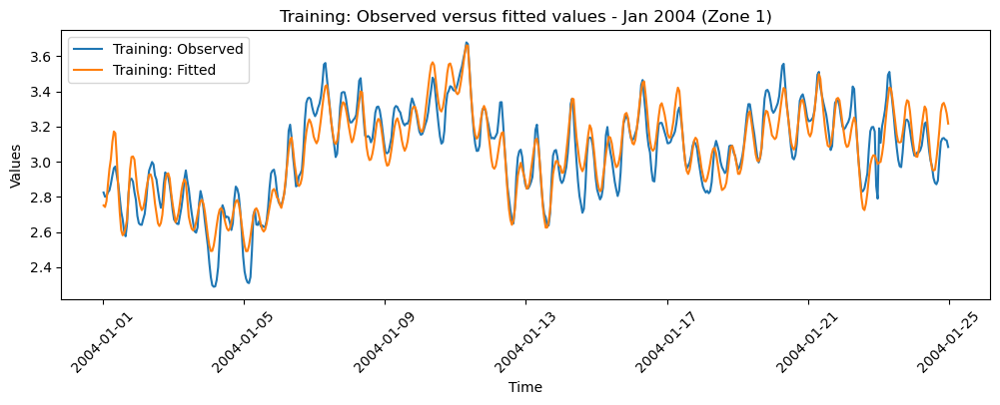

In [192]:
# Observed versus fitted values plot - training

fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(plr_df_jan04_train.timestamp, y_train, label="Training: Observed")
ax.plot(plr_df_jan04_train.timestamp, fitted_plr_jan04_train, label="Training: Fitted")
ax.set_xlabel("Time")
ax.set_ylabel("Values")
ax.legend()
ax.set_title("Training: Observed versus fitted values - Jan 2004 (Zone 1)")
plt.xticks(rotation=45)
plt.show()

In [193]:
# Checking for multicollinearity
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif_data = pd.DataFrame()

vif_data["feature"] = plr_df_jan04_train[['CDK', 'HDK', 'holiday', 'trend', 'sin(1,24)', 'cos(1,24)', 'sin(2,24)', 'cos(2,24)']].columns

vif_data["VIF"] = [variance_inflation_factor(plr_df_jan04_train[['CDK', 'HDK', 'holiday', 'trend', 'sin(1,24)', 'cos(1,24)', 'sin(2,24)', 'cos(2,24)']].values, i)
                          for i in range(len(plr_df_jan04_train[['CDK', 'HDK', 'holiday', 'trend', 'sin(1,24)', 'cos(1,24)', 'sin(2,24)', 'cos(2,24)']].columns))]
print(vif_data)

     feature       VIF
0        CDK  1.055467
1        HDK  4.949454
2    holiday  1.057488
3      trend  4.745946
4  sin(1,24)  1.097312
5  cos(1,24)  1.070781
6  sin(2,24)  1.026796
7  cos(2,24)  1.007461


VIF < 5; no considerable multicollinearity among features.

In [194]:
# Are the regression residuals from training data stationary?
check_stationarity(y_train - fitted_plr_jan04_train)

ADF Statistic: -6.174128481830573
p-value: 6.694321382998097e-08
Stationary


Text(0, 0.5, 'ACF')

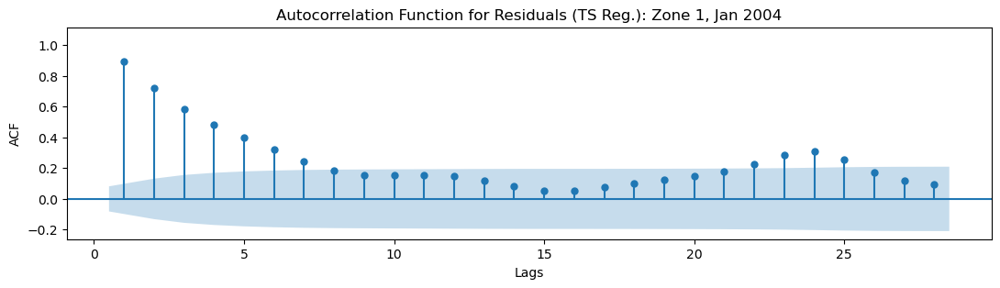

In [195]:
# autocorrelation in residuals

from statsmodels.graphics.tsaplots import plot_acf

fig, ax = plt.subplots(figsize=(13,3))
plot_acf(y_train - fitted_plr_jan04_train, 
         ax=ax,
         zero=False, 
         bartlett_confint=True, 
         auto_ylims=True)

ax.set_title("Autocorrelation Function for Residuals (TS Reg.): Zone 1, Jan 2004")
ax.set_xlabel("Lags")
ax.set_ylabel("ACF")

Eventhough residuals are stationary, there is still uncaptured autocorrelation by the model (both non-seasonal and seasonal).

###### Testing

In [196]:
# Defining test set
plr_df_jan04_test = plr_df_jan04.loc[plr_df_jan04.timestamp > "2004-01-24 23:30:00", ["timestamp", "HDK", "CDK", "log_load_rs", "holiday"]]

# FEATURE SET: Testing

# Defining the sine wave
dp = DeterministicProcess(
    index=plr_df_jan04_test.timestamp,
    period=None,         # It's not defined so that frequency can be read from the index
    constant=False,      # Let regression model define this intercept later on
    order=1,             # allows trend to be included so that the level of the wave is allowed to change with time, linearly 
    seasonal=False,      # no seasonal dummies
    additional_terms=[periodicity], # 2 seperate waves will be generated
    drop=True            # if perfect collinearity exists, the terms can be dropped
)

waves = dp.in_sample()

# Adding fourier terms
plr_df_jan04_test = pd.merge(plr_df_jan04_test, waves, on='timestamp', how='inner')
plr_df_jan04_test.head()

,timestamp,HDK,CDK,log_load_rs,holiday,trend,"sin(1,24)","cos(1,24)","sin(2,24)","cos(2,24)"
0,2004-01-25 00:30:00,33.844708,0.0,3.094174,0,1.0,0.000000,1.000000,0.000000,1.000000e+00
1,2004-01-25 01:30:00,34.941183,0.0,3.101713,0,2.0,0.258819,0.965926,0.500000,8.660254e-01
2,2004-01-25 02:30:00,35.948994,0.0,3.144626,0,3.0,0.500000,0.866025,0.866025,5.000000e-01
3,2004-01-25 03:30:00,36.753700,0.0,3.160441,0,4.0,0.707107,0.707107,1.000000,6.123234e-17
4,2004-01-25 04:30:00,37.299825,0.0,3.197407,0,5.0,0.866025,0.500000,0.866025,-5.000000e-01


In [197]:
# Specifying explanatory and explained variables - testing

X_test = plr_df_jan04_test[['CDK', 'HDK', 'holiday', 'trend', 'sin(1,24)', 'cos(1,24)', 'sin(2,24)', 'cos(2,24)']]
y_test = np.array(plr_df_jan04_test.log_load_rs).reshape(-1, 1)
fitted_plr_jan04_test = plr_df_jan04_train_reg.predict(X_test)

# Regression Performance - training
print(f"R2 score: {r2_score(y_test, fitted_plr_jan04_test)}")
print(f'MSE score: {mean_squared_error(y_test, fitted_plr_jan04_test)}')
print(f'MAE score: {mean_absolute_error(y_test, fitted_plr_jan04_test)}')
print(f'MAPE score: {mean_absolute_percentage_error(y_test, fitted_plr_jan04_test)}')

R2 score: 0.5358105163989009
MSE score: 0.014177061327656625
MAE score: 0.10517835190950275
MAPE score: 0.03181222492472505


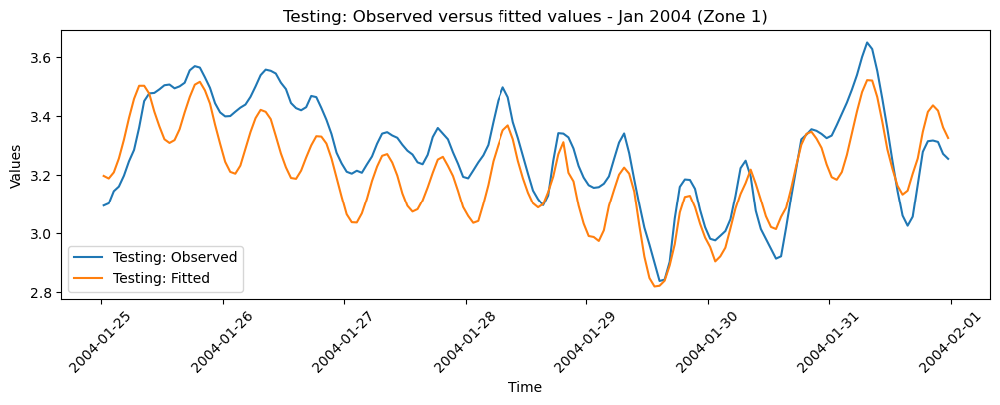

In [198]:
# Observed versus fitted values plot - testing

fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(plr_df_jan04_test.timestamp, y_test, label="Testing: Observed")
ax.plot(plr_df_jan04_test.timestamp, fitted_plr_jan04_test, label="Testing: Fitted")
ax.set_xlabel("Time")
ax.set_ylabel("Values")
ax.legend()
ax.set_title("Testing: Observed versus fitted values - Jan 2004 (Zone 1)")
plt.xticks(rotation=45)
plt.show()

##### April 2004, Zone 1

###### Training

In [199]:
# Dataframe for Apr 2004, Zone 1
plr_df_apr04 = mul_reg_df.loc[(mul_reg_df.timestamp >= "2004-04-01 00:30:00") & (mul_reg_df.timestamp < "2004-05-01"), ["timestamp", "HDK", "CDK", "log_load_rs", "holiday"]].reset_index(drop=True)
plr_df_apr04.head()

,timestamp,HDK,CDK,log_load_rs,holiday
0,2004-04-01 00:30:00,9.546438,0.0,2.645820,0
1,2004-04-01 01:30:00,9.452632,0.0,2.633901,0
2,2004-04-01 02:30:00,9.545137,0.0,2.633039,0
3,2004-04-01 03:30:00,9.545137,0.0,2.646246,0
4,2004-04-01 04:30:00,9.808953,0.0,2.688528,0


In [200]:
# Defining training sets
plr_df_apr04_train = plr_df_apr04.loc[plr_df_apr04.timestamp < "2004-04-24 00:30:00", ["timestamp", "HDK", "CDK", "log_load_rs", "holiday"]]

# FEATURE SET: Training

# Defining the sine wave
dp = DeterministicProcess(
    index=plr_df_apr04_train.timestamp,
    period=None,         # It's not defined so that frequency can be read from the index
    constant=False,      # Let regression model define this intercept later on
    order=1,             # allows trend to be included so that the level of the wave is allowed to change with time, linearly 
    seasonal=False,      # no seasonal dummies
    additional_terms=[periodicity], # 2 seperate waves will be generated
    drop=True            # if perfect collinearity exists, the terms can be dropped
)

waves = dp.in_sample()

# Adding fourier terms
plr_df_apr04_train = pd.merge(plr_df_apr04_train, waves, on='timestamp', how='inner')
plr_df_apr04_train.head()

,timestamp,HDK,CDK,log_load_rs,holiday,trend,"sin(1,24)","cos(1,24)","sin(2,24)","cos(2,24)"
0,2004-04-01 00:30:00,9.546438,0.0,2.645820,0,1.0,0.000000,1.000000,0.000000,1.000000e+00
1,2004-04-01 01:30:00,9.452632,0.0,2.633901,0,2.0,0.258819,0.965926,0.500000,8.660254e-01
2,2004-04-01 02:30:00,9.545137,0.0,2.633039,0,3.0,0.500000,0.866025,0.866025,5.000000e-01
3,2004-04-01 03:30:00,9.545137,0.0,2.646246,0,4.0,0.707107,0.707107,1.000000,6.123234e-17
4,2004-04-01 04:30:00,9.808953,0.0,2.688528,0,5.0,0.866025,0.500000,0.866025,-5.000000e-01


In [201]:
# Specifying explanatory and explained variables - training

X_train = plr_df_apr04_train[['CDK', 'HDK', 'holiday', 'trend', 'sin(1,24)', 'cos(1,24)', 'sin(2,24)', 'cos(2,24)']]
y_train = np.array(plr_df_apr04_train.log_load_rs).reshape(-1, 1)
plr_df_apr04_train_reg = LinearRegression().fit(X_train, y_train)
fitted_plr_apr04_train = plr_df_apr04_train_reg.predict(X_train)

# Regression Performance - training
print(f"R2 score: {r2_score(y_train, fitted_plr_apr04_train)}")
print(f'MSE score: {mean_squared_error(y_train, fitted_plr_apr04_train)}')
print(f'MAE score: {mean_absolute_error(y_train, fitted_plr_apr04_train)}')
print(f'MAPE score: {mean_absolute_percentage_error(y_train, fitted_plr_apr04_train)}')

R2 score: 0.688865490357774
MSE score: 0.01236806139133409
MAE score: 0.0920550195339074
MAPE score: 0.03445986715324797


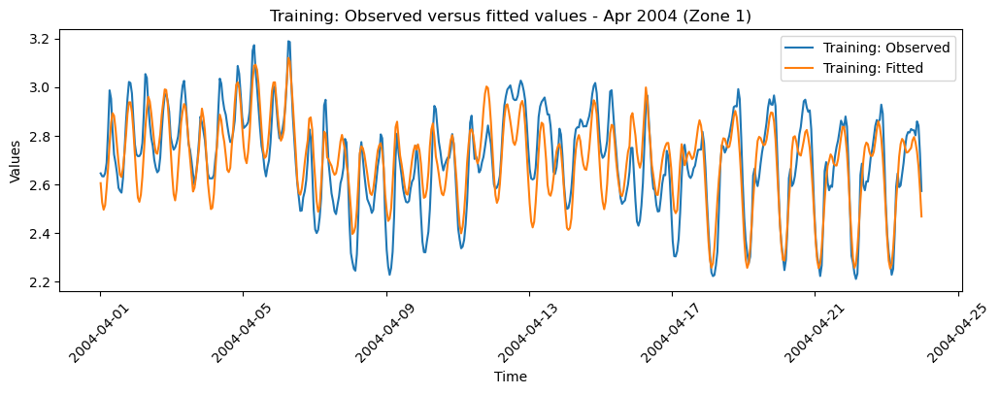

In [202]:
# Observed versus fitted values plot - training

fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(plr_df_apr04_train.timestamp, y_train, label="Training: Observed")
ax.plot(plr_df_apr04_train.timestamp, fitted_plr_apr04_train, label="Training: Fitted")
ax.set_xlabel("Time")
ax.set_ylabel("Values")
ax.legend()
ax.set_title("Training: Observed versus fitted values - Apr 2004 (Zone 1)")
plt.xticks(rotation=45)
plt.show()

In [203]:
# Checking for multicollinearity
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif_data = pd.DataFrame()

vif_data["feature"] = plr_df_apr04_train[['CDK', 'HDK', 'holiday', 'trend', 'sin(1,24)', 'cos(1,24)', 'sin(2,24)', 'cos(2,24)']].columns

vif_data["VIF"] = [variance_inflation_factor(plr_df_apr04_train[['CDK', 'HDK', 'holiday', 'trend', 'sin(1,24)', 'cos(1,24)', 'sin(2,24)', 'cos(2,24)']].values, i)
                          for i in range(len(plr_df_apr04_train[['CDK', 'HDK', 'holiday', 'trend', 'sin(1,24)', 'cos(1,24)', 'sin(2,24)', 'cos(2,24)']].columns))]
print(vif_data)

     feature       VIF
0        CDK  1.955758
1        HDK  1.393277
2    holiday       NaN
3      trend  1.939621
4  sin(1,24)  1.170134
5  cos(1,24)  1.206809
6  sin(2,24)  1.024849
7  cos(2,24)  1.006222


C:\Users\singh\anaconda3\Lib\site-packages\statsmodels\regression\linear_model.py:1785: RuntimeWarning: invalid value encountered in scalar divide
  return 1 - self.ssr/self.uncentered_tss


VIF < 5; no considerable multicollinearity among features.

In [204]:
# Are the regression residuals from training data stationary?
check_stationarity(y_train - fitted_plr_apr04_train)

ADF Statistic: -4.039467526421985
p-value: 0.001217379085888458
Stationary


Text(0, 0.5, 'ACF')

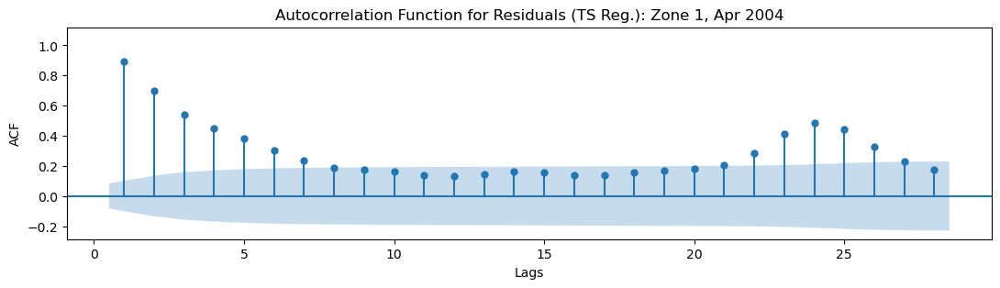

In [205]:
# autocorrelation in residuals

from statsmodels.graphics.tsaplots import plot_acf

fig, ax = plt.subplots(figsize=(13,3))
plot_acf(y_train - fitted_plr_apr04_train, 
         ax=ax,
         zero=False, 
         bartlett_confint=True, 
         auto_ylims=True)

ax.set_title("Autocorrelation Function for Residuals (TS Reg.): Zone 1, Apr 2004")
ax.set_xlabel("Lags")
ax.set_ylabel("ACF")

Eventhough residuals are stationary, there is still uncaptured autocorrelation by the model (both non-seasonal and seasonal).

###### Testing

In [206]:
# Defining test set
plr_df_apr04_test = plr_df_apr04.loc[plr_df_apr04.timestamp > "2004-04-23 23:30:00", ["timestamp", "HDK", "CDK", "log_load_rs", "holiday"]]

# FEATURE SET: Testing

# Defining the sine wave
dp = DeterministicProcess(
    index=plr_df_apr04_test.timestamp,
    period=None,         # It's not defined so that frequency can be read from the index
    constant=False,      # Let regression model define this intercept later on
    order=1,             # allows trend to be included so that the level of the wave is allowed to change with time, linearly 
    seasonal=False,      # no seasonal dummies
    additional_terms=[periodicity], # 2 seperate waves will be generated
    drop=True            # if perfect collinearity exists, the terms can be dropped
)

waves = dp.in_sample()

# Adding fourier terms
plr_df_apr04_test = pd.merge(plr_df_apr04_test, waves, on='timestamp', how='inner')
plr_df_apr04_test.head()

,timestamp,HDK,CDK,log_load_rs,holiday,trend,"sin(1,24)","cos(1,24)","sin(2,24)","cos(2,24)"
0,2004-04-24 00:30:00,0.0,0.0,2.437728,0,1.0,0.000000,1.000000,0.000000,1.000000e+00
1,2004-04-24 01:30:00,0.0,0.0,2.328643,0,2.0,0.258819,0.965926,0.500000,8.660254e-01
2,2004-04-24 02:30:00,0.0,0.0,2.279316,0,3.0,0.500000,0.866025,0.866025,5.000000e-01
3,2004-04-24 03:30:00,0.0,0.0,2.249290,0,4.0,0.707107,0.707107,1.000000,6.123234e-17
4,2004-04-24 04:30:00,0.0,0.0,2.248657,0,5.0,0.866025,0.500000,0.866025,-5.000000e-01


In [207]:
# Specifying explanatory and explained variables - testing

X_test = plr_df_apr04_test[['CDK', 'HDK', 'holiday', 'trend', 'sin(1,24)', 'cos(1,24)', 'sin(2,24)', 'cos(2,24)']]
y_test = np.array(plr_df_apr04_test.log_load_rs).reshape(-1, 1)
fitted_plr_apr04_test = plr_df_apr04_train_reg.predict(X_test)

# Regression Performance - training
print(f"R2 score: {r2_score(y_test, fitted_plr_apr04_test)}")
print(f'MSE score: {mean_squared_error(y_test, fitted_plr_apr04_test)}')
print(f'MAE score: {mean_absolute_error(y_test, fitted_plr_apr04_test)}')
print(f'MAPE score: {mean_absolute_percentage_error(y_test, fitted_plr_apr04_test)}')

R2 score: 0.6546357884383913
MSE score: 0.011813557433136201
MAE score: 0.09005801437308593
MAPE score: 0.03501521437888206


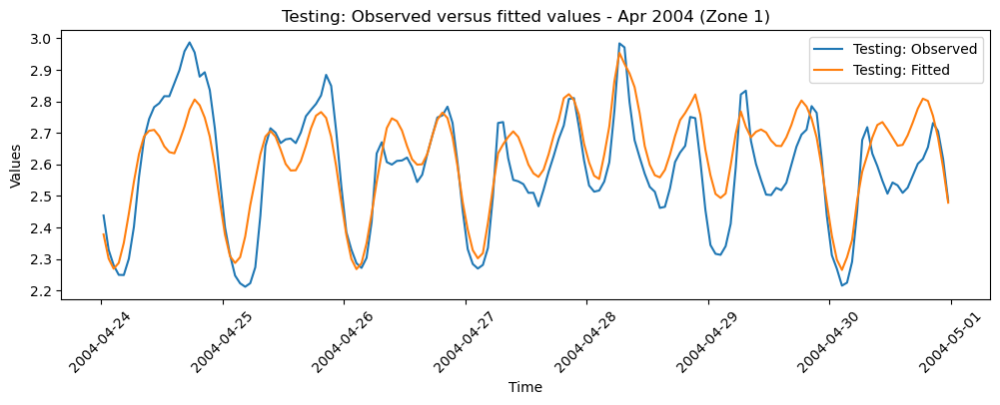

In [208]:
# Observed versus fitted values plot - testing

fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(plr_df_apr04_test.timestamp, y_test, label="Testing: Observed")
ax.plot(plr_df_apr04_test.timestamp, fitted_plr_apr04_test, label="Testing: Fitted")
ax.set_xlabel("Time")
ax.set_ylabel("Values")
ax.legend()
ax.set_title("Testing: Observed versus fitted values - Apr 2004 (Zone 1)")
plt.xticks(rotation=45)
plt.show()

##### July 2004, Zone 1

###### Training

In [209]:
# Dataframe for Jul 2004, Zone 1
plr_df_jul04 = mul_reg_df.loc[(mul_reg_df.timestamp >= "2004-07-01 00:30:00") & (mul_reg_df.timestamp < "2004-08-01"), ["timestamp", "HDK", "CDK", "log_load_rs", "holiday"]].reset_index(drop=True)
plr_df_jul04.head()

,timestamp,HDK,CDK,log_load_rs,holiday
0,2004-07-01 00:30:00,0.0,2.152732,2.658230,0
1,2004-07-01 01:30:00,0.0,1.148285,2.548507,0
2,2004-07-01 02:30:00,0.0,0.687669,2.482404,0
3,2004-07-01 03:30:00,0.0,0.000000,2.447464,0
4,2004-07-01 04:30:00,0.0,0.000000,2.430626,0


In [210]:
# Defining training sets
plr_df_jul04_train = plr_df_jul04.loc[plr_df_jul04.timestamp < "2004-07-25 00:30:00", ["timestamp", "HDK", "CDK", "log_load_rs", "holiday"]]

# FEATURE SET: Training

# Defining the sine wave
dp = DeterministicProcess(
    index=plr_df_jul04_train.timestamp,
    period=None,         # It's not defined so that frequency can be read from the index
    constant=False,      # Let regression model define this intercept later on
    order=1,             # allows trend to be included so that the level of the wave is allowed to change with time, linearly 
    seasonal=False,      # no seasonal dummies
    additional_terms=[periodicity], # 2 seperate waves will be generated
    drop=True            # if perfect collinearity exists, the terms can be dropped
)

waves = dp.in_sample()

# Adding fourier terms
plr_df_jul04_train = pd.merge(plr_df_jul04_train, waves, on='timestamp', how='inner')
plr_df_jul04_train.head()

,timestamp,HDK,CDK,log_load_rs,holiday,trend,"sin(1,24)","cos(1,24)","sin(2,24)","cos(2,24)"
0,2004-07-01 00:30:00,0.0,2.152732,2.658230,0,1.0,0.000000,1.000000,0.000000,1.000000e+00
1,2004-07-01 01:30:00,0.0,1.148285,2.548507,0,2.0,0.258819,0.965926,0.500000,8.660254e-01
2,2004-07-01 02:30:00,0.0,0.687669,2.482404,0,3.0,0.500000,0.866025,0.866025,5.000000e-01
3,2004-07-01 03:30:00,0.0,0.000000,2.447464,0,4.0,0.707107,0.707107,1.000000,6.123234e-17
4,2004-07-01 04:30:00,0.0,0.000000,2.430626,0,5.0,0.866025,0.500000,0.866025,-5.000000e-01


In [211]:
# Specifying explanatory and explained variables - training

X_train = plr_df_jul04_train[['CDK', 'HDK', 'holiday', 'trend', 'sin(1,24)', 'cos(1,24)', 'sin(2,24)', 'cos(2,24)']]
y_train = np.array(plr_df_jul04_train.log_load_rs).reshape(-1, 1)
plr_df_jul04_train_reg = LinearRegression().fit(X_train, y_train)
fitted_plr_jul04_train = plr_df_jul04_train_reg.predict(X_train)

# Regression Performance - training
print(f"R2 score: {r2_score(y_train, fitted_plr_jul04_train)}")
print(f'MSE score: {mean_squared_error(y_train, fitted_plr_jul04_train)}')
print(f'MAE score: {mean_absolute_error(y_train, fitted_plr_jul04_train)}')
print(f'MAPE score: {mean_absolute_percentage_error(y_train, fitted_plr_jul04_train)}')

R2 score: 0.9362937904275223
MSE score: 0.0064920278114330016
MAE score: 0.06421829602076515
MAPE score: 0.021737442138606285


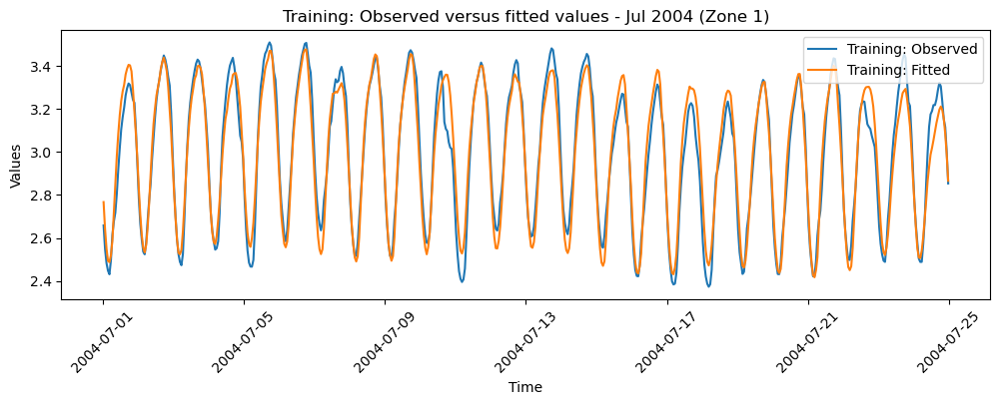

In [212]:
# Observed versus fitted values plot - training

fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(plr_df_jul04_train.timestamp, y_train, label="Training: Observed")
ax.plot(plr_df_jul04_train.timestamp, fitted_plr_jul04_train, label="Training: Fitted")
ax.set_xlabel("Time")
ax.set_ylabel("Values")
ax.legend()
ax.set_title("Training: Observed versus fitted values - Jul 2004 (Zone 1)")
plt.xticks(rotation=45)
plt.show()

In [213]:
# Checking for multicollinearity
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif_data = pd.DataFrame()

vif_data["feature"] = plr_df_jul04_train[['CDK', 'HDK', 'holiday', 'trend', 'sin(1,24)', 'cos(1,24)', 'sin(2,24)', 'cos(2,24)']].columns

vif_data["VIF"] = [variance_inflation_factor(plr_df_jul04_train[['CDK', 'HDK', 'holiday', 'trend', 'sin(1,24)', 'cos(1,24)', 'sin(2,24)', 'cos(2,24)']].values, i)
                          for i in range(len(plr_df_jul04_train[['CDK', 'HDK', 'holiday', 'trend', 'sin(1,24)', 'cos(1,24)', 'sin(2,24)', 'cos(2,24)']].columns))]
print(vif_data)

     feature       VIF
0        CDK  3.987487
1        HDK       NaN
2    holiday  1.156936
3      trend  2.944408
4  sin(1,24)  1.240566
5  cos(1,24)  1.541364
6  sin(2,24)  1.003077
7  cos(2,24)  1.013879


C:\Users\singh\anaconda3\Lib\site-packages\statsmodels\regression\linear_model.py:1785: RuntimeWarning: invalid value encountered in scalar divide
  return 1 - self.ssr/self.uncentered_tss


VIF < 5; no considerable multicollinearity among features.

In [214]:
# Are the regression residuals from training data stationary?
check_stationarity(y_train - fitted_plr_jul04_train)

ADF Statistic: -4.48712813138763
p-value: 0.00020744332151234057
Stationary


Text(0, 0.5, 'ACF')

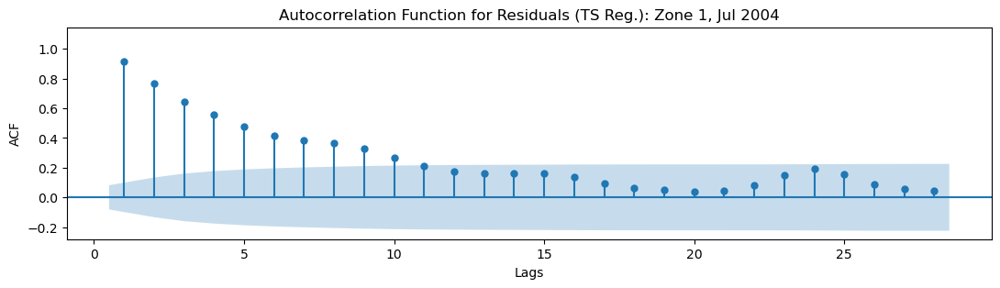

In [215]:
# autocorrelation in residuals

from statsmodels.graphics.tsaplots import plot_acf

fig, ax = plt.subplots(figsize=(13,3))
plot_acf(y_train - fitted_plr_jul04_train, 
         ax=ax,
         zero=False, 
         bartlett_confint=True, 
         auto_ylims=True)

ax.set_title("Autocorrelation Function for Residuals (TS Reg.): Zone 1, Jul 2004")
ax.set_xlabel("Lags")
ax.set_ylabel("ACF")

Eventhough residuals are stationary, there is still uncaptured autocorrelation by the model (both non-seasonal and seasonal).

###### Testing

In [216]:
# Defining test set
plr_df_jul04_test = plr_df_jul04.loc[plr_df_jul04.timestamp > "2004-07-24 23:30:00", ["timestamp", "HDK", "CDK", "log_load_rs", "holiday"]]

# FEATURE SET: Testing

# Defining the sine wave
dp = DeterministicProcess(
    index=plr_df_jul04_test.timestamp,
    period=None,         # It's not defined so that frequency can be read from the index
    constant=False,      # Let regression model define this intercept later on
    order=1,             # allows trend to be included so that the level of the wave is allowed to change with time, linearly 
    seasonal=False,      # no seasonal dummies
    additional_terms=[periodicity], # 2 seperate waves will be generated
    drop=True            # if perfect collinearity exists, the terms can be dropped
)

waves = dp.in_sample()

# Adding fourier terms
plr_df_jul04_test = pd.merge(plr_df_jul04_test, waves, on='timestamp', how='inner')
plr_df_jul04_test.head()

,timestamp,HDK,CDK,log_load_rs,holiday,trend,"sin(1,24)","cos(1,24)","sin(2,24)","cos(2,24)"
0,2004-07-25 00:30:00,0.0,5.616043,2.669517,0,1.0,0.000000,1.000000,0.000000,1.000000e+00
1,2004-07-25 01:30:00,0.0,5.893317,2.551552,0,2.0,0.258819,0.965926,0.500000,8.660254e-01
2,2004-07-25 02:30:00,0.0,5.710504,2.486073,0,3.0,0.500000,0.866025,0.866025,5.000000e-01
3,2004-07-25 03:30:00,0.0,5.526899,2.441738,0,4.0,0.707107,0.707107,1.000000,6.123234e-17
4,2004-07-25 04:30:00,0.0,5.527349,2.429834,0,5.0,0.866025,0.500000,0.866025,-5.000000e-01


In [217]:
# Specifying explanatory and explained variables - testing

X_test = plr_df_jul04_test[['CDK', 'HDK', 'holiday', 'trend', 'sin(1,24)', 'cos(1,24)', 'sin(2,24)', 'cos(2,24)']]
y_test = np.array(plr_df_jul04_test.log_load_rs).reshape(-1, 1)
fitted_plr_jul04_test = plr_df_jul04_train_reg.predict(X_test)

# Regression Performance - training
print(f"R2 score: {r2_score(y_test, fitted_plr_jul04_test)}")
print(f'MSE score: {mean_squared_error(y_test, fitted_plr_jul04_test)}')
print(f'MAE score: {mean_absolute_error(y_test, fitted_plr_jul04_test)}')
print(f'MAPE score: {mean_absolute_percentage_error(y_test, fitted_plr_jul04_test)}')

R2 score: 0.7955423516351657
MSE score: 0.016147193682211392
MAE score: 0.10322643112304045
MAPE score: 0.035803791640017624


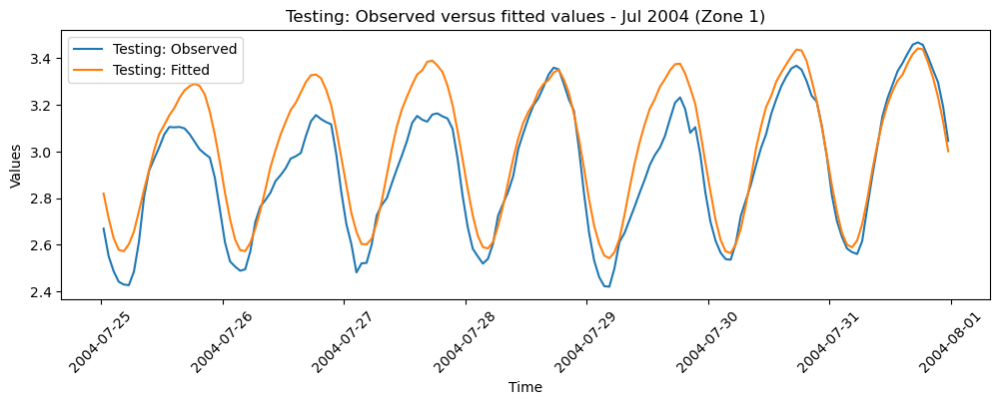

In [218]:
# Observed versus fitted values plot - testing

fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(plr_df_jul04_test.timestamp, y_test, label="Testing: Observed")
ax.plot(plr_df_jul04_test.timestamp, fitted_plr_jul04_test, label="Testing: Fitted")
ax.set_xlabel("Time")
ax.set_ylabel("Values")
ax.legend()
ax.set_title("Testing: Observed versus fitted values - Jul 2004 (Zone 1)")
plt.xticks(rotation=45)
plt.show()

##### October 2024, Zone 1

###### Training

In [219]:
# Dataframe for Oct 2004, Zone 1
plr_df_oct04 = mul_reg_df.loc[(mul_reg_df.timestamp >= "2004-10-01 00:30:00") & (mul_reg_df.timestamp < "2004-11-01"), ["timestamp", "HDK", "CDK", "log_load_rs", "holiday"]].reset_index(drop=True)
plr_df_oct04.head()

,timestamp,HDK,CDK,log_load_rs,holiday
0,2004-10-01 00:30:00,0.0,0.0,2.410093,0
1,2004-10-01 01:30:00,0.0,0.0,2.324444,0
2,2004-10-01 02:30:00,0.0,0.0,2.293544,0
3,2004-10-01 03:30:00,0.0,0.0,2.289399,0
4,2004-10-01 04:30:00,0.0,0.0,2.303684,0


In [220]:
# Defining training sets
plr_df_oct04_train = plr_df_oct04.loc[plr_df_oct04.timestamp < "2004-10-25 00:30:00", ["timestamp", "HDK", "CDK", "log_load_rs", "holiday"]]

# FEATURE SET: Training

# Defining the sine wave
dp = DeterministicProcess(
    index=plr_df_oct04_train.timestamp,
    period=None,         # It's not defined so that frequency can be read from the index
    constant=False,      # Let regression model define this intercept later on
    order=1,             # allows trend to be included so that the level of the wave is allowed to change with time, linearly 
    seasonal=False,      # no seasonal dummies
    additional_terms=[periodicity], # 2 seperate waves will be generated
    drop=True            # if perfect collinearity exists, the terms can be dropped
)

waves = dp.in_sample()

# Adding fourier terms
plr_df_oct04_train = pd.merge(plr_df_oct04_train, waves, on='timestamp', how='inner')
plr_df_oct04_train.head()

,timestamp,HDK,CDK,log_load_rs,holiday,trend,"sin(1,24)","cos(1,24)","sin(2,24)","cos(2,24)"
0,2004-10-01 00:30:00,0.0,0.0,2.410093,0,1.0,0.000000,1.000000,0.000000,1.000000e+00
1,2004-10-01 01:30:00,0.0,0.0,2.324444,0,2.0,0.258819,0.965926,0.500000,8.660254e-01
2,2004-10-01 02:30:00,0.0,0.0,2.293544,0,3.0,0.500000,0.866025,0.866025,5.000000e-01
3,2004-10-01 03:30:00,0.0,0.0,2.289399,0,4.0,0.707107,0.707107,1.000000,6.123234e-17
4,2004-10-01 04:30:00,0.0,0.0,2.303684,0,5.0,0.866025,0.500000,0.866025,-5.000000e-01


In [221]:
# Specifying explanatory and explained variables - training

X_train = plr_df_oct04_train[['CDK', 'HDK', 'holiday', 'trend', 'sin(1,24)', 'cos(1,24)', 'sin(2,24)', 'cos(2,24)']]
y_train = np.array(plr_df_oct04_train.log_load_rs).reshape(-1, 1)
plr_df_oct04_train_reg = LinearRegression().fit(X_train, y_train)
fitted_plr_oct04_train = plr_df_oct04_train_reg.predict(X_train)

# Regression Performance - training
print(f"R2 score: {r2_score(y_train, fitted_plr_oct04_train)}")
print(f'MSE score: {mean_squared_error(y_train, fitted_plr_oct04_train)}')
print(f'MAE score: {mean_absolute_error(y_train, fitted_plr_oct04_train)}')
print(f'MAPE score: {mean_absolute_percentage_error(y_train, fitted_plr_oct04_train)}')

R2 score: 0.8417419560136707
MSE score: 0.004623422050125992
MAE score: 0.05424744412607674
MAPE score: 0.02074645601847872


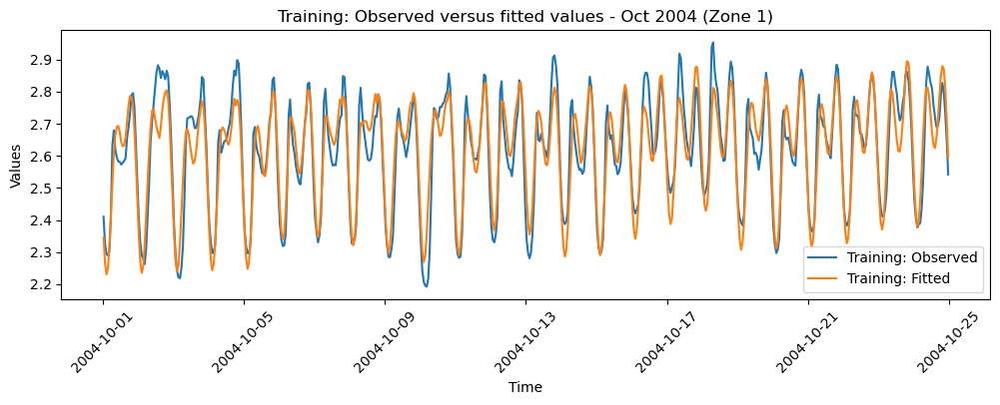

In [222]:
# Observed versus fitted values plot - training

fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(plr_df_oct04_train.timestamp, y_train, label="Training: Observed")
ax.plot(plr_df_oct04_train.timestamp, fitted_plr_oct04_train, label="Training: Fitted")
ax.set_xlabel("Time")
ax.set_ylabel("Values")
ax.legend()
ax.set_title("Training: Observed versus fitted values - Oct 2004 (Zone 1)")
plt.xticks(rotation=45)
plt.show()

In [223]:
# Checking for multicollinearity
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif_data = pd.DataFrame()

vif_data["feature"] = plr_df_oct04_train[['CDK', 'HDK', 'holiday', 'trend', 'sin(1,24)', 'cos(1,24)', 'sin(2,24)', 'cos(2,24)']].columns

vif_data["VIF"] = [variance_inflation_factor(plr_df_oct04_train[['CDK', 'HDK', 'holiday', 'trend', 'sin(1,24)', 'cos(1,24)', 'sin(2,24)', 'cos(2,24)']].values, i)
                          for i in range(len(plr_df_oct04_train[['CDK', 'HDK', 'holiday', 'trend', 'sin(1,24)', 'cos(1,24)', 'sin(2,24)', 'cos(2,24)']].columns))]
print(vif_data)

     feature       VIF
0        CDK  1.369215
1        HDK  1.759328
2    holiday  1.039772
3      trend  1.403627
4  sin(1,24)  1.228298
5  cos(1,24)  1.400864
6  sin(2,24)  1.063067
7  cos(2,24)  1.030212


VIF < 5; no considerable multicollinearity among features.

In [224]:
# Are the regression residuals from training data stationary?
check_stationarity(y_train - fitted_plr_oct04_train)

ADF Statistic: -6.8772536458004625
p-value: 1.4638311007836908e-09
Stationary


Text(0, 0.5, 'ACF')

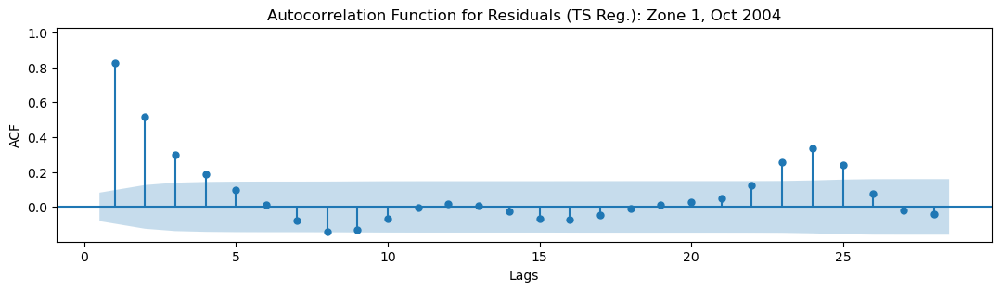

In [225]:
# autocorrelation in residuals

from statsmodels.graphics.tsaplots import plot_acf

fig, ax = plt.subplots(figsize=(13,3))
plot_acf(y_train - fitted_plr_oct04_train, 
         ax=ax,
         zero=False, 
         bartlett_confint=True, 
         auto_ylims=True)

ax.set_title("Autocorrelation Function for Residuals (TS Reg.): Zone 1, Oct 2004")
ax.set_xlabel("Lags")
ax.set_ylabel("ACF")

Eventhough residuals are stationary, there is still uncaptured autocorrelation by the model (both non-seasonal and seasonal).

###### Testing

In [226]:
# Defining test set
plr_df_oct04_test = plr_df_oct04.loc[plr_df_oct04.timestamp > "2004-10-24 23:30:00", ["timestamp", "HDK", "CDK", "log_load_rs", "holiday"]]

# FEATURE SET: Testing

# Defining the sine wave
dp = DeterministicProcess(
    index=plr_df_oct04_test.timestamp,
    period=None,         # It's not defined so that frequency can be read from the index
    constant=False,      # Let regression model define this intercept later on
    order=1,             # allows trend to be included so that the level of the wave is allowed to change with time, linearly 
    seasonal=False,      # no seasonal dummies
    additional_terms=[periodicity], # 2 seperate waves will be generated
    drop=True            # if perfect collinearity exists, the terms can be dropped
)

waves = dp.in_sample()

# Adding fourier terms
plr_df_oct04_test = pd.merge(plr_df_oct04_test, waves, on='timestamp', how='inner')
plr_df_oct04_test.head()

,timestamp,HDK,CDK,log_load_rs,holiday,trend,"sin(1,24)","cos(1,24)","sin(2,24)","cos(2,24)"
0,2004-10-25 00:30:00,4.709873,0.0,2.449970,0,1.0,0.000000,1.000000,0.000000,1.000000e+00
1,2004-10-25 01:30:00,4.708141,0.0,2.407305,0,2.0,0.258819,0.965926,0.500000,8.660254e-01
2,2004-10-25 02:30:00,4.341778,0.0,2.395164,0,3.0,0.500000,0.866025,0.866025,5.000000e-01
3,2004-10-25 03:30:00,4.428952,0.0,2.396531,0,4.0,0.707107,0.707107,1.000000,6.123234e-17
4,2004-10-25 04:30:00,4.532364,0.0,2.434403,0,5.0,0.866025,0.500000,0.866025,-5.000000e-01


In [227]:
# Specifying explanatory and explained variables - testing

X_test = plr_df_oct04_test[['CDK', 'HDK', 'holiday', 'trend', 'sin(1,24)', 'cos(1,24)', 'sin(2,24)', 'cos(2,24)']]
y_test = np.array(plr_df_oct04_test.log_load_rs).reshape(-1, 1)
fitted_plr_oct04_test = plr_df_oct04_train_reg.predict(X_test)

# Regression Performance - training
print(f"R2 score: {r2_score(y_test, fitted_plr_oct04_test)}")
print(f'MSE score: {mean_squared_error(y_test, fitted_plr_oct04_test)}')
print(f'MAE score: {mean_absolute_error(y_test, fitted_plr_oct04_test)}')
print(f'MAPE score: {mean_absolute_percentage_error(y_test, fitted_plr_oct04_test)}')

R2 score: 0.7270215519663383
MSE score: 0.007708244372963434
MAE score: 0.07157678024554186
MAPE score: 0.027521182943729496


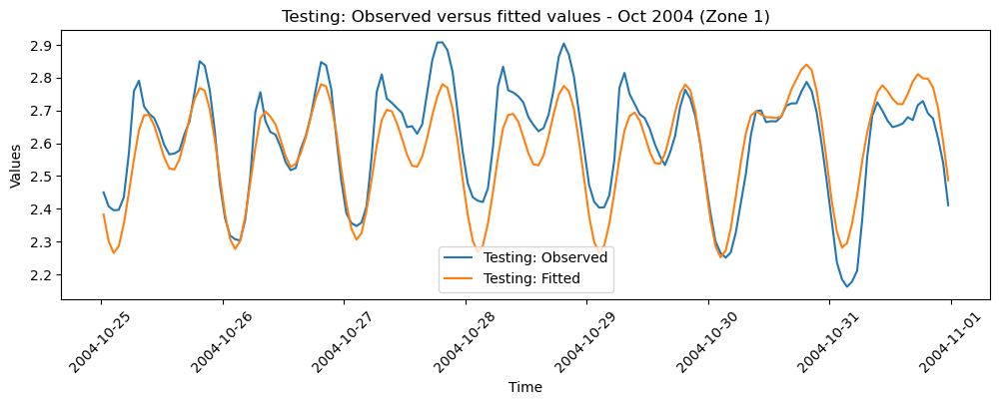

In [228]:
# Observed versus fitted values plot - testing

fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(plr_df_oct04_test.timestamp, y_test, label="Testing: Observed")
ax.plot(plr_df_oct04_test.timestamp, fitted_plr_oct04_test, label="Testing: Fitted")
ax.set_xlabel("Time")
ax.set_ylabel("Values")
ax.legend()
ax.set_title("Testing: Observed versus fitted values - Oct 2004 (Zone 1)")
plt.xticks(rotation=45)
plt.show()

##### December 2024, Zone 1

###### Training

In [229]:
# Dataframe for Dec 2004, Zone 1
plr_df_dec04 = mul_reg_df.loc[(mul_reg_df.timestamp >= "2004-12-01 00:30:00") & (mul_reg_df.timestamp < "2005-01-01"), ["timestamp", "HDK", "CDK", "log_load_rs", "holiday"]].reset_index(drop=True)
plr_df_dec04.head()

,timestamp,HDK,CDK,log_load_rs,holiday
0,2004-12-01 00:30:00,7.034009,0.0,2.650774,0
1,2004-12-01 01:30:00,6.390075,0.0,2.609481,0
2,2004-12-01 02:30:00,5.845719,0.0,2.608304,0
3,2004-12-01 03:30:00,4.747031,0.0,2.617177,0
4,2004-12-01 04:30:00,3.392479,0.0,2.646104,0


In [230]:
# Defining training sets
plr_df_dec04_train = plr_df_dec04.loc[plr_df_dec04.timestamp < "2004-12-25 00:30:00", ["timestamp", "HDK", "CDK", "log_load_rs", "holiday"]]

# FEATURE SET: Training

# Defining the sine wave
dp = DeterministicProcess(
    index=plr_df_dec04_train.timestamp,
    period=None,         # It's not defined so that frequency can be read from the index
    constant=False,      # Let regression model define this intercept later on
    order=1,             # allows trend to be included so that the level of the wave is allowed to change with time, linearly 
    seasonal=False,      # no seasonal dummies
    additional_terms=[periodicity], # 2 seperate waves will be generated
    drop=True            # if perfect collinearity exists, the terms can be dropped
)

waves = dp.in_sample()

# Adding fourier terms
plr_df_dec04_train = pd.merge(plr_df_dec04_train, waves, on='timestamp', how='inner')
plr_df_dec04_train.head()

,timestamp,HDK,CDK,log_load_rs,holiday,trend,"sin(1,24)","cos(1,24)","sin(2,24)","cos(2,24)"
0,2004-12-01 00:30:00,7.034009,0.0,2.650774,0,1.0,0.000000,1.000000,0.000000,1.000000e+00
1,2004-12-01 01:30:00,6.390075,0.0,2.609481,0,2.0,0.258819,0.965926,0.500000,8.660254e-01
2,2004-12-01 02:30:00,5.845719,0.0,2.608304,0,3.0,0.500000,0.866025,0.866025,5.000000e-01
3,2004-12-01 03:30:00,4.747031,0.0,2.617177,0,4.0,0.707107,0.707107,1.000000,6.123234e-17
4,2004-12-01 04:30:00,3.392479,0.0,2.646104,0,5.0,0.866025,0.500000,0.866025,-5.000000e-01


In [231]:
# Specifying explanatory and explained variables - training

X_train = plr_df_dec04_train[['CDK', 'HDK', 'holiday', 'trend', 'sin(1,24)', 'cos(1,24)', 'sin(2,24)', 'cos(2,24)']]
y_train = np.array(plr_df_dec04_train.log_load_rs).reshape(-1, 1)
plr_df_dec04_train_reg = LinearRegression().fit(X_train, y_train)
fitted_plr_dec04_train = plr_df_dec04_train_reg.predict(X_train)

# Regression Performance - training
print(f"R2 score: {r2_score(y_train, fitted_plr_dec04_train)}")
print(f'MSE score: {mean_squared_error(y_train, fitted_plr_dec04_train)}')
print(f'MAE score: {mean_absolute_error(y_train, fitted_plr_dec04_train)}')
print(f'MAPE score: {mean_absolute_percentage_error(y_train, fitted_plr_dec04_train)}')

R2 score: 0.8859680181775843
MSE score: 0.007053616696386401
MAE score: 0.06640390370650301
MAPE score: 0.02217567306478614


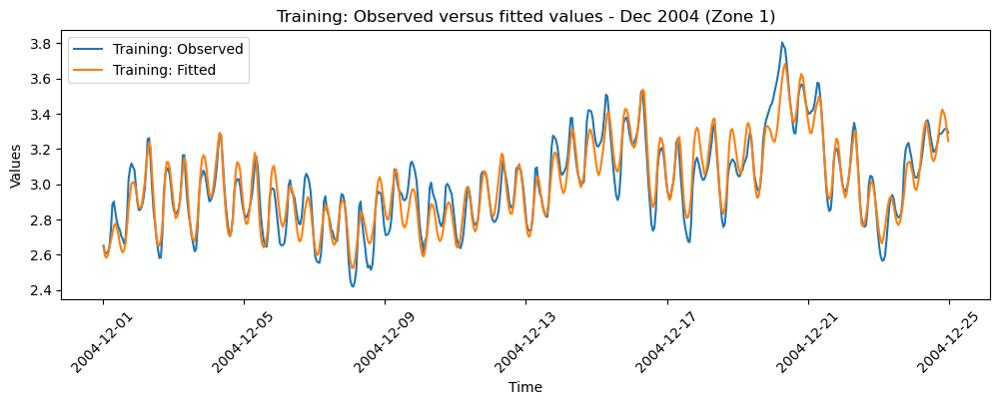

In [232]:
# Observed versus fitted values plot - training

fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(plr_df_dec04_train.timestamp, y_train, label="Training: Observed")
ax.plot(plr_df_dec04_train.timestamp, fitted_plr_dec04_train, label="Training: Fitted")
ax.set_xlabel("Time")
ax.set_ylabel("Values")
ax.legend()
ax.set_title("Training: Observed versus fitted values - Dec 2004 (Zone 1)")
plt.xticks(rotation=45)
plt.show()

In [233]:
# Checking for multicollinearity
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif_data = pd.DataFrame()

vif_data["feature"] = plr_df_dec04_train[['CDK', 'HDK', 'holiday', 'trend', 'sin(1,24)', 'cos(1,24)', 'sin(2,24)', 'cos(2,24)']].columns

vif_data["VIF"] = [variance_inflation_factor(plr_df_dec04_train[['CDK', 'HDK', 'holiday', 'trend', 'sin(1,24)', 'cos(1,24)', 'sin(2,24)', 'cos(2,24)']].values, i)
                          for i in range(len(plr_df_dec04_train[['CDK', 'HDK', 'holiday', 'trend', 'sin(1,24)', 'cos(1,24)', 'sin(2,24)', 'cos(2,24)']].columns))]
print(vif_data)

     feature       VIF
0        CDK  1.033280
1        HDK  3.340046
2    holiday  1.136611
3      trend  3.283387
4  sin(1,24)  1.098368
5  cos(1,24)  1.117587
6  sin(2,24)  1.014961
7  cos(2,24)  1.016800


VIF < 5; no considerable multicollinearity among features.

In [234]:
# Are the regression residuals from training data stationary?
check_stationarity(y_train - fitted_plr_dec04_train)

ADF Statistic: -4.146682936528086
p-value: 0.0008100464509613966
Stationary


Text(0, 0.5, 'ACF')

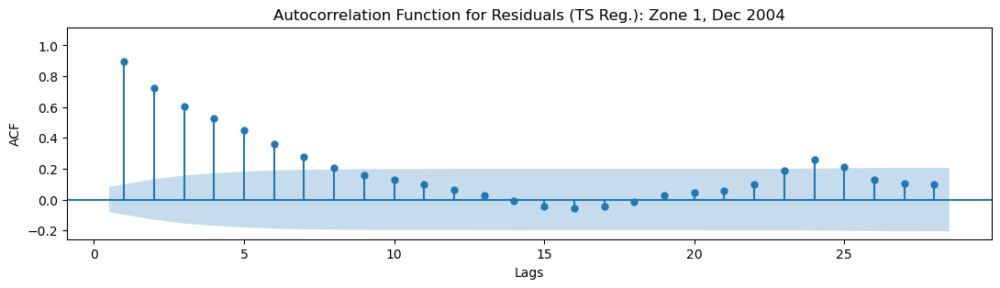

In [235]:
# autocorrelation in residuals

from statsmodels.graphics.tsaplots import plot_acf

fig, ax = plt.subplots(figsize=(13,3))
plot_acf(y_train - fitted_plr_dec04_train, 
         ax=ax,
         zero=False, 
         bartlett_confint=True, 
         auto_ylims=True)

ax.set_title("Autocorrelation Function for Residuals (TS Reg.): Zone 1, Dec 2004")
ax.set_xlabel("Lags")
ax.set_ylabel("ACF")

Eventhough residuals are stationary, there is still uncaptured autocorrelation by the model (both non-seasonal and seasonal).

###### Testing

In [236]:
# Defining test set
plr_df_dec04_test = plr_df_dec04.loc[plr_df_dec04.timestamp > "2004-12-24 23:30:00", ["timestamp", "HDK", "CDK", "log_load_rs", "holiday"]]

# FEATURE SET: Testing

# Defining the sine wave
dp = DeterministicProcess(
    index=plr_df_dec04_test.timestamp,
    period=None,         # It's not defined so that frequency can be read from the index
    constant=False,      # Let regression model define this intercept later on
    order=1,             # allows trend to be included so that the level of the wave is allowed to change with time, linearly 
    seasonal=False,      # no seasonal dummies
    additional_terms=[periodicity], # 2 seperate waves will be generated
    drop=True            # if perfect collinearity exists, the terms can be dropped
)

waves = dp.in_sample()

# Adding fourier terms
plr_df_dec04_test = pd.merge(plr_df_dec04_test, waves, on='timestamp', how='inner')
plr_df_dec04_test.head()

,timestamp,HDK,CDK,log_load_rs,holiday,trend,"sin(1,24)","cos(1,24)","sin(2,24)","cos(2,24)"
0,2004-12-25 00:30:00,29.413045,0.0,3.270443,0,1.0,0.000000,1.000000,0.000000,1.000000e+00
1,2004-12-25 01:30:00,30.324433,0.0,3.272530,0,2.0,0.258819,0.965926,0.500000,8.660254e-01
2,2004-12-25 02:30:00,30.318725,0.0,3.290191,0,3.0,0.500000,0.866025,0.866025,5.000000e-01
3,2004-12-25 03:30:00,30.411003,0.0,3.314804,0,4.0,0.707107,0.707107,1.000000,6.123234e-17
4,2004-12-25 04:30:00,30.679482,0.0,3.350676,0,5.0,0.866025,0.500000,0.866025,-5.000000e-01


In [237]:
# Specifying explanatory and explained variables - testing

X_test = plr_df_dec04_test[['CDK', 'HDK', 'holiday', 'trend', 'sin(1,24)', 'cos(1,24)', 'sin(2,24)', 'cos(2,24)']]
y_test = np.array(plr_df_dec04_test.log_load_rs).reshape(-1, 1)
fitted_plr_dec04_test = plr_df_dec04_train_reg.predict(X_test)

# Regression Performance - training
print(f"R2 score: {r2_score(y_test, fitted_plr_dec04_test)}")
print(f'MSE score: {mean_squared_error(y_test, fitted_plr_dec04_test)}')
print(f'MAE score: {mean_absolute_error(y_test, fitted_plr_dec04_test)}')
print(f'MAPE score: {mean_absolute_percentage_error(y_test, fitted_plr_dec04_test)}')

R2 score: 0.7922152981862531
MSE score: 0.009750006491343256
MAE score: 0.07524950171783369
MAPE score: 0.023955499580899715


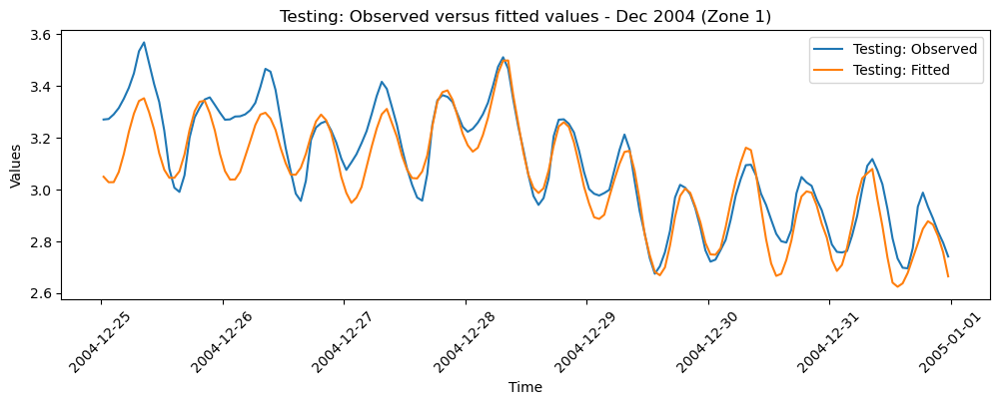

In [238]:
# Observed versus fitted values plot - testing

fig, ax = plt.subplots(figsize=(12,3.5))
ax.plot(plr_df_dec04_test.timestamp, y_test, label="Testing: Observed")
ax.plot(plr_df_dec04_test.timestamp, fitted_plr_dec04_test, label="Testing: Fitted")
ax.set_xlabel("Time")
ax.set_ylabel("Values")
ax.legend()
ax.set_title("Testing: Observed versus fitted values - Dec 2004 (Zone 1)")
plt.xticks(rotation=45)
plt.show()

### Conclusion
- In the month of April and Oct, performance on test data specifically improved. with PLR.
- It also expected that wherever a U-shaped relationship between load and temperature exists, PLR likely will improve test performance.
- However for months where load temperature relationship was clear, PLR did not improve test performance.
- <b><i>Regression residuals are found to be stationary (all tested months): Regression model can capture seasonal variation sufficiently well</i></b>